# Table of Contents

**Introduction**

* [Objective](#objective)
* [Data Extraction](#data-extraction)
* [Dataset Overview](#dataset-overview)
* [Dataset Accuracy Check](#dataset-accuracy-check)

**Exploratory Data Analysis (EDA)**

* [Benign Data Exploration](#benign-data-exploration)
* [Cyber-attack Data Exploration](#cyber-attack-data-exploration)
* [EDA Insights](#eda-insights)
* [Considerations for Modeling](#considerations-for-modeling)

**Modeling**

* [Modeling Scope](#modeling-scope)
* [Data pre-processing](#data-pre-processing)
* [Feature Engineering: Chi-Square, Anova, Mutual Information, Random Forrest](#feature-engineering-chi-square-anova-mutual-information-random-forrest)
* [Model Building and Evaluation: Random Forest](#model-building-and-evaluation-random-forest)
* [Model Testing with Feature Engineering Outputs](#model-testing-with-feature-engineering-outputs)
* [Performance Summary](#performance-summary)

**Conclusion**

* [Key Findings and Insights](#key-findings-and-insights)
* [Summary](#summary)

# Introduction

## Objective <a id="objective"></a>

* Explore and preprocess large-scale network traffic data (over 2.4M rows, 122 features) from the BCCC-CIC-IDS 2017 dataset to distinguish benign traffic from multiple cyber-attack types.

* Perform exploratory data analysis (EDA) to uncover distributions, correlations, and outlier patterns between benign and attack traffic across key feature groups.

* Explore different feature selection techniques (Chi-Square, ANOVA, Mutual Information, Random Forest importance) to identify the most relevant attributes for distinguishing benign traffic from cyber-attacks.

* Build and evaluate machine learning models, with emphasis on Random Forest, to classify cyber-attacks and assess predictive performance using selected features.

## Data Extraction<a id="data-extraction"></a>

In [36]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import math
import networkx as nx
import os
import matplotlib.dates as mdates
from matplotlib.ticker import MaxNLocator
import matplotlib as mpl
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant
from sklearn.feature_selection import chi2
from sklearn.preprocessing import LabelEncoder
from sklearn.feature_selection import f_classif
from sklearn.feature_selection import mutual_info_classif
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import precision_score, recall_score, roc_auc_score, roc_curve, accuracy_score, confusion_matrix
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import itertools
from itertools import zip_longest

In [37]:
# Folder path containing CSV files
folder_path = '/Users/javiermerino/Documents/Langara/3.DANA4830/Assignment1/Data2017/BCCC-CIC-IDS-2017'

# List to store DataFrames
dataframes = []

# Loop through all files in the folder
for file_name in os.listdir(folder_path):
    # Check if the file is a CSV
    if file_name.endswith('.csv'):
        # Construct the full file path
        file_path = os.path.join(folder_path, file_name)
        # Read the CSV file into a DataFrame
        df = pd.read_csv(file_path)
        # Append the DataFrame to the list
        dataframes.append(df)

# Concatenate all DataFrames into one
data = pd.concat(dataframes, ignore_index=True)

# Display the shape of the combined DataFrame
print(f"Combined DataFrame Shape: {data.shape}")

Combined DataFrame Shape: (2438052, 122)


## Dataset Overview <a id="dataset-overview"></a>

This study is made with data collected by the Behavior-Centric Cybersecurity Center (BCCC) at York University (BCCC, 2017).

The data has 18 CSV files, each with the same 122 features. The total number of observations is 2,438,052, and it is distributed as follows:

|No| Data Type                  | Numeber of Rows   |
|-|----------------------------|---------|
|1| monday_benign_data         | 495,538  |
|2| tuesday_benign_data        | 395,976  |
|3| wednesday_benign_data      | 39,753   |
|4| thursday_benign_data       | 133,770  |
|5| friday_benign_data         | 364,102  |
|6| dos_golden_eye_data        | 8,364    |
|7| dos_hulk_data              | 349,240  |
|8| dos_slowhttptest_data      | 6,860    |
|9| dos_slowloris_data         | 5,177    |
|10| heartbleed_data            | 12      |
|11| ftp_patator_data           | 9,531    |
|12| ssh_patator_data           | 5,949    |
|13| botnet_ares_data           | 5,508    |
|14| portscan_data              | 161,323  |
|15| ddos_loit_data             | 95,733   |
|16| web_brute_force_data       | 2,734    |
|17| web_sql_injection_data     | 24      |
|18| web_xss_data               | 1,358    |

5 csv files contain data from a bening traffic flow, while the others contain data related to an specific kind of ciber attack.

As the number of features is large, for describing the features I will divide the 122 features into 12 groups based on their similarity according to each name given to the feature. For example, the byte rate group include all the features that include that name such as fwd_bytes_rate and down_up_rate.

Each row represent a TCP communication between two IP addresses so in one row we find representations of forward and backward traffic flow. Find next the description of the groups:

**Group1:** 

*'flow_id', 'timestamp', 'src_ip', 'src_port', 'dst_ip', 'dst_port', 'protocol', 'duration', 'level'.*

*   The variables in this group are mainly categorical data. Ports are numerical but they are a representation of a conection point, so they have to be treated as a categorical nominal variable the same as the Ip addresess. 
*   The only continuos variable is duration. 
*   In this group I included the feature 'label' which is my response variable, and has 14 levels: 13 specify a certain type of cyber attack, an one level "bening" identifies the normal traffic. The attacks are named in the table above from number 6 to 18.

**Group2:** 

*'packets_count', 'fwd_packets_count', 'bwd_packets_count'.*

*   The variables in this group are related to the number of TCP packets.
*   The variables are numerical and their unit is a count.
*   These features describe forward and backward packets, which have to do with the bidirectional traffic flow of the TCP protocol.
*   The packet count is the summation of fwd and bwd, so the three features are correlated.
*   The median packet count is 4 but the maximum is 2.4 million, so it is skewed.

**Group3:** 

*'total_payload_bytes', 'fwd_total_payload_bytes', 'bwd_total_payload_bytes', 'payload_bytes_max', 'payload_bytes_min', 'payload_bytes_mean', 'payload_bytes_std', 'payload_bytes_variance', 'fwd_payload_bytes_max', 'fwd_payload_bytes_min', 'fwd_payload_bytes_mean', 'fwd_payload_bytes_std', 'fwd_payload_bytes_variance', 'bwd_payload_bytes_max', 'bwd_payload_bytes_min', 'bwd_payload_bytes_mean', 'bwd_payload_bytes_std', 'bwd_payload_bytes_variance'.*

*   The variables in this group are related to the payload size measure in bytes and consist on numerical data.
*   The total payload feature is the sum of the fwd and bwd payload. The payload refers to the actual information data that is transfered.
*   There is a "total" feature for the whole payload, and the fws and bwd, so they might be correlated.
*   The max, min, sd, var, mean have each a fetature for the total, fwd and bwd, 18 in total. the features are integers but the mean, sd, and var.

**Group4:** 

*'total_header_bytes', 'max_header_bytes', 'min_header_bytes', 'mean_header_bytes', 'std_header_bytes', 'fwd_total_header_bytes', 'fwd_max_header_bytes', 'fwd_min_header_bytes', 'fwd_mean_header_bytes', 'fwd_std_header_bytes', 'bwd_total_header_bytes', 'bwd_max_header_bytes', 'bwd_min_header_bytes', 'bwd_mean_header_bytes', 'bwd_std_header_bytes'.*

*   The variables in this group are related to the header size in bytes, and consist on numerical data.
*   The header data is information added by TCP protocol for signalling and other tasks.
*   The median size in total header size is 32 and the max is 50 million, so the data is skewed.

**Group5:**

*'fwd_avg_segment_size', 'bwd_avg_segment_size', 'avg_segment_size'*

*   The variables in this group are related to average segment size in bytes, and consist on numerical data.
*   The segment size is a measure of the TCP packet, payload + header.
*   The values are not as big as the payload and header because these features are averages.

**Group6:** 

*'fwd_init_win_bytes', 'bwd_init_win_bytes'*

*   The variables in this group are related to initial window size in bytes, and consist on numerical data.
*   The initial window is used to determine how much data a sender can transmit before receiving an acknowledgment from the receiver.
*   The values are not as big as the payload and header sizes.

**Group7:**  

*'active_min', 'active_max', 'active_mean', 'active_std', 'idle_min', 'idle_max', 'idle_mean', 'idle_std'*

*   The variables in this group are related to the active and idle states, and consist on numerical data, although there are some negative values in the "active" feature. 

**Group8:**

*'bytes_rate', 'fwd_bytes_rate', 'bwd_bytes_rate', 'packets_rate', 'bwd_packets_rate', 'fwd_packets_rate', 'down_up_rate'*

*   The variables in this group are related to rates with units such as bytes/s and packet/s, and consist on numerical data.
*   Data is skewed, except for the down_up_rate.

**Group9:** 
*'avg_fwd_bytes_per_bulk', 'avg_fwd_packets_per_bulk', 'avg_fwd_bulk_rate', 'avg_bwd_bytes_per_bulk', 'avg_bwd_packets_bulk_rate', 'avg_bwd_bulk_rate', 'fwd_bulk_state_count', 'fwd_bulk_total_size', 'fwd_bulk_per_packet', 'fwd_bulk_duration', 'bwd_bulk_state_count', 'bwd_bulk_total_size', 'bwd_bulk_per_packet', 'bwd_bulk_duration'.*

*   The variables in this group are related to Bulk information and consist on numerical data.

**Group10:** 

*'fin_flag_counts', 'psh_flag_counts', 'urg_flag_counts', 'ece_flag_counts', 'syn_flag_counts', 'ack_flag_counts', 'cwr_flag_counts', 'rst_flag_counts', 'fwd_fin_flag_counts', 'fwd_psh_flag_counts', 'fwd_urg_flag_counts', 'fwd_ece_flag_counts', 'fwd_syn_flag_counts', 'fwd_ack_flag_counts', 'fwd_cwr_flag_counts', 'fwd_rst_flag_counts', 'bwd_fin_flag_counts', 'bwd_psh_flag_counts', 'bwd_urg_flag_counts', 'bwd_ece_flag_counts', 'bwd_syn_flag_counts', 'bwd_ack_flag_counts', 'bwd_cwr_flag_counts', 'bwd_rst_flag_counts'*

*   The variables in this group are related to a counting of flags, and consist on numerical data.
*   The three features with a high count of flags are: bwd_ack_flag_count, bwd_psh_flag_counts, fwd_psh_flag_counts, ack_flag_counts, psh_flag_counts.

**Group11:** 

*'packets_IAT_mean', 'packet_IAT_std', 'packet_IAT_max', 'packet_IAT_min', 'packet_IAT_total', 'fwd_packets_IAT_mean', 'fwd_packets_IAT_std', 'fwd_packets_IAT_max', 'fwd_packets_IAT_min', 'fwd_packets_IAT_total', 'bwd_packets_IAT_mean', 'bwd_packets_IAT_std', 'bwd_packets_IAT_max', 'bwd_packets_IAT_min', 'bwd_packets_IAT_total'*

*   The variables in this group are related to IAT ( Inter-Arrival Time) information and consist on numerical data.
*   IAT represent the time interval between two consecutive packets or events and is used in performance analysis. High variability in IAT might indicate network congestion or packet loss. Stable IAT often corresponds to a smooth network with low jitter.
*   There are some negative values in some of the features.

**Group12:**

*'subflow_fwd_packets', 'subflow_bwd_packets', 'subflow_fwd_bytes', 'subflow_bwd_bytes'*

*   The variables in this group are related to subflow information and consist on numerical features.
*   A subflow in TCP refers to a separate, independent TCP connection that is part of a larger connection, particularly in the context of MultiPath TCP (MPTCP).

In [38]:
#Group 1 categorical data 
group1 = pd.concat([data.iloc[:,0:8],data.iloc[:,121:122]],axis=1) 
group1.info()
print(f'Is there missing values in this group: {group1.isnull().any().any()}')
print(f'Number of NA values in this group: {group1.isna().sum().sum()}')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2438052 entries, 0 to 2438051
Data columns (total 9 columns):
 #   Column     Dtype  
---  ------     -----  
 0   flow_id    object 
 1   timestamp  object 
 2   src_ip     object 
 3   src_port   int64  
 4   dst_ip     object 
 5   dst_port   int64  
 6   protocol   object 
 7   duration   float64
 8   label      object 
dtypes: float64(1), int64(2), object(6)
memory usage: 167.4+ MB
Is there missing values in this group: False
Number of NA values in this group: 0


In [39]:
for column in group1.columns:
    unique_values = group1[column].unique()
    print(f"Column: {column}")
    print(f"Unique Values: {unique_values}")
    print(f"Number of Unique Values: {len(unique_values)}\n")

Column: flow_id
Unique Values: ['172.16.0.1_60744_192.168.10.50_21_TCP_2017-07-07 13:14:05.497800'
 '172.16.0.1_45018_192.168.10.50_22_TCP_2017-07-07 13:14:05.497803'
 '172.16.0.1_60754_192.168.10.50_21_TCP_2017-07-07 13:14:17.054064' ...
 '172.16.0.1_443_192.168.10.51_48057_TCP_2017-07-05 09:13:44.599165'
 '172.16.0.1_443_192.168.10.51_48058_TCP_2017-07-05 09:13:49.649183'
 '172.16.0.1_443_192.168.10.51_48059_TCP_2017-07-05 09:13:54.669225']
Number of Unique Values: 2434869

Column: timestamp
Unique Values: ['2017-07-07 13:14:05.497800' '2017-07-07 13:14:05.497803'
 '2017-07-07 13:14:17.054064' ... '2017-07-05 09:13:44.599165'
 '2017-07-05 09:13:49.649183' '2017-07-05 09:13:54.669225']
Number of Unique Values: 2401776

Column: src_ip
Unique Values: ['172.16.0.1' '192.168.10.50' '192.168.10.14' ... '184.29.137.214'
 '23.208.97.124' '23.211.102.137']
Number of Unique Values: 11965

Column: src_port
Unique Values: [60744 45018 60754 ... 38915 40917 47861]
Number of Unique Values: 64578



In [40]:
#Group2 Number of packets
group2 = data.iloc[:,8:11]
group2.info()
print(f'Is there missing values in this group: {group2.isnull().any().any()}')
print(f'Number of NA values in this group: {group2.isna().sum().sum()}')

group2.describe().applymap('{:.0f}'.format)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2438052 entries, 0 to 2438051
Data columns (total 3 columns):
 #   Column             Dtype
---  ------             -----
 0   packets_count      int64
 1   fwd_packets_count  int64
 2   bwd_packets_count  int64
dtypes: int64(3)
memory usage: 55.8 MB
Is there missing values in this group: False
Number of NA values in this group: 0


/var/folders/jx/psp7f4jd6yj35lm7000kqtph0000gn/T/ipykernel_16509/805306294.py:7: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  group2.describe().applymap('{:.0f}'.format)


,packets_count,fwd_packets_count,bwd_packets_count
count,2438052,2438052,2438052
mean,21,10,11
std,4007,1712,2295
min,1,0,0
25%,2,1,1
50%,4,2,2
75%,11,6,5
max,2466364,1046340,1420035


In [41]:
#Group3 Payload size in Bytes
group3 = data.iloc[:,11:29]
group3.info()
print(f'Is there missing values in this group: {group3.isnull().any().any()}')
print(f'Number of NA values in this group: {group3.isna().sum().sum()}')
group3.describe().applymap('{:.0f}'.format)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2438052 entries, 0 to 2438051
Data columns (total 18 columns):
 #   Column                      Dtype  
---  ------                      -----  
 0   total_payload_bytes         int64  
 1   fwd_total_payload_bytes     int64  
 2   bwd_total_payload_bytes     int64  
 3   payload_bytes_max           int64  
 4   payload_bytes_min           int64  
 5   payload_bytes_mean          float64
 6   payload_bytes_std           float64
 7   payload_bytes_variance      float64
 8   fwd_payload_bytes_max       int64  
 9   fwd_payload_bytes_min       int64  
 10  fwd_payload_bytes_mean      float64
 11  fwd_payload_bytes_std       float64
 12  fwd_payload_bytes_variance  float64
 13  bwd_payload_bytes_max       int64  
 14  bwd_payload_bytes_min       int64  
 15  bwd_payload_bytes_mean      float64
 16  bwd_payload_bytes_std       float64
 17  bwd_payload_bytes_variance  float64
dtypes: float64(9), int64(9)
memory usage: 334.8 MB
Is there missin

/var/folders/jx/psp7f4jd6yj35lm7000kqtph0000gn/T/ipykernel_16509/3865416740.py:6: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  group3.describe().applymap('{:.0f}'.format)


,total_payload_bytes,fwd_total_payload_bytes,bwd_total_payload_bytes,payload_bytes_max,payload_bytes_min,payload_bytes_mean,payload_bytes_std,payload_bytes_variance,fwd_payload_bytes_max,fwd_payload_bytes_min,fwd_payload_bytes_mean,fwd_payload_bytes_std,fwd_payload_bytes_variance,bwd_payload_bytes_max,bwd_payload_bytes_min,bwd_payload_bytes_mean,bwd_payload_bytes_std,bwd_payload_bytes_variance
count,2438052,2438052,2438052,2438052,2438052,2438052,2438052,2438052,2438052,2438052,2438052,2438052,2438052,2438052,2438052,2438052,2438052,2438052
mean,18527,471,18056,1051,15,184,309,483298,1051,15,184,309,27511,1051,15,184,309,796331
std,5057380,6816,5056963,2149,34,313,623,1408732,2149,34,313,623,406990,2149,34,313,623,2734304
min,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
25%,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
50%,228,62,146,90,0,62,25,625,90,0,62,25,0,90,0,62,25,0
75%,2186,235,860,953,35,142,263,69159,953,35,142,263,72,953,35,142,263,45782
max,3068160410,4156724,3067939080,24820,4380,5840,5466,29876450,24820,4380,5840,5466,50536030,24820,4380,5840,5466,33611006


In [42]:
#Group4 Header size in Bytes
group4 = data.iloc[:,29:44]
group4.info()
print(f'Is there missing values in this group: {group4.isnull().any().any()}')
print(f'Number of NA values in this group: {group4.isna().sum().sum()}')
group4.describe().applymap('{:.0f}'.format)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2438052 entries, 0 to 2438051
Data columns (total 15 columns):
 #   Column                  Dtype  
---  ------                  -----  
 0   total_header_bytes      int64  
 1   max_header_bytes        int64  
 2   min_header_bytes        int64  
 3   mean_header_bytes       float64
 4   std_header_bytes        float64
 5   fwd_total_header_bytes  int64  
 6   fwd_max_header_bytes    int64  
 7   fwd_min_header_bytes    int64  
 8   fwd_mean_header_bytes   float64
 9   fwd_std_header_bytes    float64
 10  bwd_total_header_bytes  int64  
 11  bwd_max_header_bytes    int64  
 12  bwd_min_header_bytes    int64  
 13  bwd_mean_header_bytes   float64
 14  bwd_std_header_bytes    float64
dtypes: float64(6), int64(9)
memory usage: 279.0 MB
Is there missing values in this group: False
Number of NA values in this group: 0


/var/folders/jx/psp7f4jd6yj35lm7000kqtph0000gn/T/ipykernel_16509/1037653988.py:6: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  group4.describe().applymap('{:.0f}'.format)


,total_header_bytes,max_header_bytes,min_header_bytes,mean_header_bytes,std_header_bytes,fwd_total_header_bytes,fwd_max_header_bytes,fwd_min_header_bytes,fwd_mean_header_bytes,fwd_std_header_bytes,bwd_total_header_bytes,bwd_max_header_bytes,bwd_min_header_bytes,bwd_mean_header_bytes,bwd_std_header_bytes
count,2438052,2438052,2438052,2438052,2438052,2438052,2438052,2438052,2438052,2438052,2438052,2438052,2438052,2438052,2438052
mean,485,23,19,20,2,227,20,17,17,1,258,18,15,16,1
std,81752,13,9,10,3,35846,14,11,12,2,45914,14,11,11,2
min,8,8,8,8,0,0,0,0,0,0,0,0,0,0,0
25%,32,8,8,8,0,16,8,8,8,0,16,8,8,8,0
50%,32,20,20,20,0,20,20,20,20,0,20,20,20,20,0
75%,284,32,20,30,3,160,32,24,24,2,124,32,20,24,3
max,50488924,60,44,44,17,22158624,60,44,51,17,28400712,52,44,44,12


In [43]:
#Group5 Average Segment Size in Bytes
group5 = data.iloc[:,44:47]
group5.info()
print(f'Is there missing values in this group: {group5.isnull().any().any()}')
print(f'Number of NA values in this group: {group5.isna().sum().sum()}')
group5.describe().applymap('{:.0f}'.format)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2438052 entries, 0 to 2438051
Data columns (total 3 columns):
 #   Column                Dtype  
---  ------                -----  
 0   fwd_avg_segment_size  float64
 1   bwd_avg_segment_size  float64
 2   avg_segment_size      float64
dtypes: float64(3)
memory usage: 55.8 MB
Is there missing values in this group: False
Number of NA values in this group: 0


/var/folders/jx/psp7f4jd6yj35lm7000kqtph0000gn/T/ipykernel_16509/2106835548.py:6: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  group5.describe().applymap('{:.0f}'.format)


,fwd_avg_segment_size,bwd_avg_segment_size,avg_segment_size
count,2438052,2438052,2438052
mean,50,338,184
std,185,645,313
min,0,0,0
25%,0,0,0
50%,33,78,62
75%,49,209,142
max,6570,5840,5840


In [44]:
#Group6 Initial window Size in Bytes
group6 = data.iloc[:,47:49]
group6.info()
print(f'Is there missing values in this group: {group6.isnull().any().any()}')
print(f'Number of NA values in this group: {group6.isna().sum().sum()}')
group6.describe().applymap('{:.0f}'.format)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2438052 entries, 0 to 2438051
Data columns (total 2 columns):
 #   Column              Dtype
---  ------              -----
 0   fwd_init_win_bytes  int64
 1   bwd_init_win_bytes  int64
dtypes: int64(2)
memory usage: 37.2 MB
Is there missing values in this group: False
Number of NA values in this group: 0


/var/folders/jx/psp7f4jd6yj35lm7000kqtph0000gn/T/ipykernel_16509/606719934.py:6: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  group6.describe().applymap('{:.0f}'.format)


,fwd_init_win_bytes,bwd_init_win_bytes
count,2438052,2438052
mean,8424,8772
std,14952,14353
min,0,0
25%,0,0
50%,0,0
75%,8192,26847
max,65535,65535


In [45]:
#Group7 Active and Idle
group7 = data.iloc[:,49:57]
group7.info()
print(f'Is there missing values in this group: {group7.isnull().any().any()}')
print(f'Number of NA values in this group: {group7.isna().sum().sum()}')
group7.describe().applymap('{:.2f}'.format)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2438052 entries, 0 to 2438051
Data columns (total 8 columns):
 #   Column       Dtype  
---  ------       -----  
 0   active_min   float64
 1   active_max   float64
 2   active_mean  float64
 3   active_std   float64
 4   idle_min     float64
 5   idle_max     float64
 6   idle_mean    float64
 7   idle_std     float64
dtypes: float64(8)
memory usage: 148.8 MB
Is there missing values in this group: False
Number of NA values in this group: 0


/var/folders/jx/psp7f4jd6yj35lm7000kqtph0000gn/T/ipykernel_16509/2188762128.py:6: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  group7.describe().applymap('{:.2f}'.format)


,active_min,active_max,active_mean,active_std,idle_min,idle_max,idle_mean,idle_std
count,2438052.00,2438052.00,2438052.00,2438052.00,2438052.00,2438052.00,2438052.00,2438052.00
mean,-0.39,-0.10,-0.13,0.07,3.90,4.17,4.03,0.13
std,23.05,3.56,3.89,4.12,28.10,29.87,28.87,2.52
min,-4350.50,-758.28,-758.28,0.00,0.00,0.00,0.00,0.00
25%,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
50%,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
75%,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
max,0.00,0.00,0.00,663.26,300.00,300.00,300.00,97.32


In [46]:
#Group8 Bytes and Packet Rate
group8 = data.iloc[:,57:64]
group8.info()
print(f'Is there missing values in this group: {group8.isnull().any().any()}')
print(f'Number of NA values in this group: {group8.isna().sum().sum()}')
group8.describe().applymap('{:.2f}'.format)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2438052 entries, 0 to 2438051
Data columns (total 7 columns):
 #   Column            Dtype  
---  ------            -----  
 0   bytes_rate        float64
 1   fwd_bytes_rate    float64
 2   bwd_bytes_rate    float64
 3   packets_rate      float64
 4   bwd_packets_rate  float64
 5   fwd_packets_rate  float64
 6   down_up_rate      float64
dtypes: float64(7)
memory usage: 130.2 MB
Is there missing values in this group: False
Number of NA values in this group: 0


/var/folders/jx/psp7f4jd6yj35lm7000kqtph0000gn/T/ipykernel_16509/2473223066.py:6: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  group8.describe().applymap('{:.2f}'.format)


,bytes_rate,fwd_bytes_rate,bwd_bytes_rate,packets_rate,bwd_packets_rate,fwd_packets_rate,down_up_rate
count,2438052.00,2438052.00,2438052.00,2438052.00,2438052.00,2438052.00,2438052.00
mean,564600.90,356970.33,207630.57,12800.57,6410.39,6390.18,0.70
std,12029683.72,9668928.57,7028105.30,85337.40,51725.87,48436.39,0.48
min,0.00,0.00,0.00,-2097152.00,-2097152.00,0.00,0.00
25%,0.00,0.00,0.00,0.14,0.03,0.00,0.00
50%,739.23,27.18,413.92,34.32,16.40,8.85,1.00
75%,12111.72,2240.82,8467.50,1053.18,483.34,98.31,1.00
max,7654604800.00,3644011315.20,7654604800.00,4194304.00,3145728.00,3145728.00,7.97


In [47]:
#Group9 Bulk information
group9 = data.iloc[:,64:78]
group9.info()
print(f'Is there missing values in this group: {group9.isnull().any().any()}')
print(f'Number of NA values in this group: {group9.isna().sum().sum()}')
group9.describe().applymap('{:.2f}'.format)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2438052 entries, 0 to 2438051
Data columns (total 14 columns):
 #   Column                     Dtype  
---  ------                     -----  
 0   avg_fwd_bytes_per_bulk     float64
 1   avg_fwd_packets_per_bulk   float64
 2   avg_fwd_bulk_rate          float64
 3   avg_bwd_bytes_per_bulk     float64
 4   avg_bwd_packets_bulk_rate  float64
 5   avg_bwd_bulk_rate          float64
 6   fwd_bulk_state_count       int64  
 7   fwd_bulk_total_size        int64  
 8   fwd_bulk_per_packet        int64  
 9   fwd_bulk_duration          float64
 10  bwd_bulk_state_count       int64  
 11  bwd_bulk_total_size        int64  
 12  bwd_bulk_per_packet        int64  
 13  bwd_bulk_duration          float64
dtypes: float64(8), int64(6)
memory usage: 260.4 MB
Is there missing values in this group: False
Number of NA values in this group: 0


/var/folders/jx/psp7f4jd6yj35lm7000kqtph0000gn/T/ipykernel_16509/464452226.py:6: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  group9.describe().applymap('{:.2f}'.format)


,avg_fwd_bytes_per_bulk,avg_fwd_packets_per_bulk,avg_fwd_bulk_rate,avg_bwd_bytes_per_bulk,avg_bwd_packets_bulk_rate,avg_bwd_bulk_rate,fwd_bulk_state_count,fwd_bulk_total_size,fwd_bulk_per_packet,fwd_bulk_duration,bwd_bulk_state_count,bwd_bulk_total_size,bwd_bulk_per_packet,bwd_bulk_duration
count,2438052.00,2438052.00,2438052.00,2438052.00,2438052.00,2438052.00,2438052.00,2438052.00,2438052.00,2438052.00,2438052.00,2438052.00,2438052.00,2438052.00
mean,72.31,0.18,148958.89,2256.26,1.21,2038283.65,0.04,94.86,0.24,0.01,0.16,14204.92,6.95,0.01
std,1572.80,1.38,3550399.31,37369.26,17.59,8810510.69,0.40,3938.69,7.91,0.31,2.14,4822543.31,2201.94,0.84
min,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
25%,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
50%,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
75%,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
max,351373.00,360.00,942750483.69,10350535.00,4688.00,1351059335.53,166.00,3739207.00,5539.00,225.49,1626.00,3040877995.00,1394044.00,521.65


In [48]:
#Group10 Flag information
group10 = data.iloc[:,78:102]
group10.info()
print(f'Is there missing values in this group: {group10.isnull().any().any()}')
print(f'Number of NA values in this group: {group10.isna().sum().sum()}')
group10.describe().applymap('{:.2f}'.format)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2438052 entries, 0 to 2438051
Data columns (total 24 columns):
 #   Column               Dtype
---  ------               -----
 0   fin_flag_counts      int64
 1   psh_flag_counts      int64
 2   urg_flag_counts      int64
 3   ece_flag_counts      int64
 4   syn_flag_counts      int64
 5   ack_flag_counts      int64
 6   cwr_flag_counts      int64
 7   rst_flag_counts      int64
 8   fwd_fin_flag_counts  int64
 9   fwd_psh_flag_counts  int64
 10  fwd_urg_flag_counts  int64
 11  fwd_ece_flag_counts  int64
 12  fwd_syn_flag_counts  int64
 13  fwd_ack_flag_counts  int64
 14  fwd_cwr_flag_counts  int64
 15  fwd_rst_flag_counts  int64
 16  bwd_fin_flag_counts  int64
 17  bwd_psh_flag_counts  int64
 18  bwd_urg_flag_counts  int64
 19  bwd_ece_flag_counts  int64
 20  bwd_syn_flag_counts  int64
 21  bwd_ack_flag_counts  int64
 22  bwd_cwr_flag_counts  int64
 23  bwd_rst_flag_counts  int64
dtypes: int64(24)
memory usage: 446.4 MB
Is there missi

/var/folders/jx/psp7f4jd6yj35lm7000kqtph0000gn/T/ipykernel_16509/3637493198.py:6: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  group10.describe().applymap('{:.2f}'.format)


,fin_flag_counts,psh_flag_counts,urg_flag_counts,ece_flag_counts,syn_flag_counts,ack_flag_counts,cwr_flag_counts,rst_flag_counts,fwd_fin_flag_counts,fwd_psh_flag_counts,...,fwd_cwr_flag_counts,fwd_rst_flag_counts,bwd_fin_flag_counts,bwd_psh_flag_counts,bwd_urg_flag_counts,bwd_ece_flag_counts,bwd_syn_flag_counts,bwd_ack_flag_counts,bwd_cwr_flag_counts,bwd_rst_flag_counts
count,2438052.00,2438052.00,2438052.00,2438052.00,2438052.00,2438052.00,2438052.00,2438052.00,2438052.00,2438052.00,...,2438052.00,2438052.00,2438052.00,2438052.00,2438052.00,2438052.00,2438052.00,2438052.00,2438052.00,2438052.00
mean,0.53,2.44,0.00,0.00,0.71,19.41,0.00,0.33,0.23,1.08,...,0.00,0.18,0.30,1.36,0.00,0.00,0.33,10.74,0.00,0.15
std,0.86,54.99,0.00,0.03,1.00,4006.92,0.02,0.47,0.51,6.38,...,0.02,0.38,0.49,52.65,0.00,0.01,0.53,2294.90,0.00,0.35
min,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
25%,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
50%,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
75%,1.00,2.00,0.00,0.00,2.00,10.00,0.00,1.00,0.00,1.00,...,0.00,0.00,1.00,1.00,0.00,0.00,1.00,5.00,0.00,0.00
max,60.00,50610.00,0.00,2.00,52.00,2466363.00,23.00,1.00,60.00,2551.00,...,23.00,1.00,8.00,50022.00,0.00,1.00,13.00,1420035.00,3.00,1.00


In [49]:
#Group11 IAT information
group11 = data.iloc[:,102:117]
group11.info()
print(f'Is there missing values in this group: {group11.isnull().any().any()}')
print(f'Number of NA values in this group: {group11.isna().sum().sum()}')
group11.describe().applymap('{:.2f}'.format)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2438052 entries, 0 to 2438051
Data columns (total 15 columns):
 #   Column                 Dtype  
---  ------                 -----  
 0   packets_IAT_mean       float64
 1   packet_IAT_std         float64
 2   packet_IAT_max         float64
 3   packet_IAT_min         float64
 4   packet_IAT_total       float64
 5   fwd_packets_IAT_mean   float64
 6   fwd_packets_IAT_std    float64
 7   fwd_packets_IAT_max    float64
 8   fwd_packets_IAT_min    float64
 9   fwd_packets_IAT_total  float64
 10  bwd_packets_IAT_mean   float64
 11  bwd_packets_IAT_std    float64
 12  bwd_packets_IAT_max    float64
 13  bwd_packets_IAT_min    float64
 14  bwd_packets_IAT_total  float64
dtypes: float64(15)
memory usage: 279.0 MB
Is there missing values in this group: False
Number of NA values in this group: 0


/var/folders/jx/psp7f4jd6yj35lm7000kqtph0000gn/T/ipykernel_16509/160945972.py:6: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  group11.describe().applymap('{:.2f}'.format)


,packets_IAT_mean,packet_IAT_std,packet_IAT_max,packet_IAT_min,packet_IAT_total,fwd_packets_IAT_mean,fwd_packets_IAT_std,fwd_packets_IAT_max,fwd_packets_IAT_min,fwd_packets_IAT_total,bwd_packets_IAT_mean,bwd_packets_IAT_std,bwd_packets_IAT_max,bwd_packets_IAT_min,bwd_packets_IAT_total
count,2438052.00,2438052.00,2438052.00,2438052.00,2438052.00,2438052.00,2438052.00,2438052.00,2438052.00,2438052.00,2438052.00,2438052.00,2438052.00,2438052.00,2438052.00
mean,333884886.73,2.54,333884892.02,333884885.18,333884901.15,464558142.11,1.53,464558144.95,464558140.93,464558154.05,339153510.00,1.35,339153512.32,339153508.88,339153520.97
std,623775904.66,12.85,623775901.85,623775905.51,623775896.95,693320828.54,8.06,693320826.65,693320829.33,693320820.55,627272872.51,7.88,627272871.27,627272873.10,627272866.60
min,-0.00,0.00,-0.00,-0.00,-0.00,0.00,0.00,0.00,0.00,0.00,-0.00,0.00,-0.00,-0.00,-0.00
25%,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
50%,0.04,0.00,0.14,0.00,0.19,0.52,0.00,2.96,0.00,4.02,0.02,0.00,0.08,0.00,0.14
75%,8.17,0.06,58.98,0.06,167.63,1499172026.88,0.05,1499172026.88,1499172026.88,1499172026.88,35.50,0.02,71.03,5.95,180.42
max,1499457761.01,148.87,1499457761.01,1499457761.01,1499457761.01,1499457759.39,149.75,1499457759.39,1499457759.39,1499457759.39,1499457761.01,265.10,1499457761.01,1499457761.01,1499457761.01


In [50]:
#Group12 Subflow information
group12 = data.iloc[:,117:121]
group12.info()
print(f'Is there missing values in this group: {group12.isnull().any().any()}')
print(f'Number of NA values in this group: {group12.isna().sum().sum()}')
group12.describe().applymap('{:.2f}'.format)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2438052 entries, 0 to 2438051
Data columns (total 4 columns):
 #   Column               Dtype  
---  ------               -----  
 0   subflow_fwd_packets  float64
 1   subflow_bwd_packets  float64
 2   subflow_fwd_bytes    float64
 3   subflow_bwd_bytes    float64
dtypes: float64(4)
memory usage: 74.4 MB
Is there missing values in this group: False
Number of NA values in this group: 0


/var/folders/jx/psp7f4jd6yj35lm7000kqtph0000gn/T/ipykernel_16509/229571165.py:6: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  group12.describe().applymap('{:.2f}'.format)


,subflow_fwd_packets,subflow_bwd_packets,subflow_fwd_bytes,subflow_bwd_bytes
count,2438052.00,2438052.00,2438052.00,2438052.00
mean,2.31,2.59,102.51,102.51
std,454.71,607.39,1602.52,1602.52
min,0.00,0.00,0.00,0.00
25%,0.00,0.00,0.00,0.00
50%,0.00,0.00,0.00,0.00
75%,0.00,0.00,0.00,0.00
max,523170.00,705895.50,1214207.50,1214207.50


## Dataset Accuracy Check <a id="dataset-accuracy-check"></a>

### Duplicate Data

In [51]:
# Checking for duplicates

duplicates = data[data.duplicated()]

duplicates.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2360 entries, 174213 to 2432051
Columns: 122 entries, flow_id to label
dtypes: float64(61), int64(55), object(6)
memory usage: 2.2+ MB


In [52]:
# Eliminating Exact Row Duplicates

data_nd = data.drop_duplicates()

data_nd.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2435692 entries, 0 to 2438051
Columns: 122 entries, flow_id to label
dtypes: float64(61), int64(55), object(6)
memory usage: 2.2+ GB


In [53]:
duplicates_flowid = data_nd[data_nd['flow_id'].duplicated()]
duplicates_flowid.info()

<class 'pandas.core.frame.DataFrame'>
Index: 823 entries, 174769 to 2437821
Columns: 122 entries, flow_id to label
dtypes: float64(61), int64(55), object(6)
memory usage: 790.9+ KB


In [54]:
# Eliminating Flow_id Duplicates. Flow Id has information combined of IPs and time stamp and there were 823 duplicates, 
# so I considered removing them as it is not likely to encouter this case.

data_nd = data_nd.drop_duplicates(subset='flow_id', keep='first')
data_nd.reset_index(drop=True, inplace=True)
data_nd.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2434869 entries, 0 to 2434868
Columns: 122 entries, flow_id to label
dtypes: float64(61), int64(55), object(6)
memory usage: 2.2+ GB


### Missing Values

In section 1 the missing values were analized, and none was found in any of the groups.

### Reducing data size

The size of the data was changed to improve process times due to the greate extend of the data set.

In [55]:
# Before downcasting, check memory usage
print("Memory usage before downcasting:")
print(data_nd.info(memory_usage='deep'))

# Function to downcast float64 and int64 columns
def reduce_memory_usage(df):
    for col in df.columns:
        col_type = df[col].dtypes
        
        # Downcast floats
        if col_type == "float64":
            df[col] = pd.to_numeric(df[col], downcast="float")
        # Downcast integers
        elif col_type == "int64":
            df[col] = pd.to_numeric(df[col], downcast="integer")
    
    return df

# Apply the downcasting function
data_reduced = reduce_memory_usage(data_nd)

# After downcasting, check memory usage
print("\nMemory usage after downcasting:")
print(data_reduced.info(memory_usage='deep'))

Memory usage before downcasting:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2434869 entries, 0 to 2434868
Columns: 122 entries, flow_id to label
dtypes: float64(61), int64(55), object(6)
memory usage: 3.2 GB
None

Memory usage after downcasting:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2434869 entries, 0 to 2434868
Columns: 122 entries, flow_id to label
dtypes: float32(31), float64(30), int16(10), int32(18), int64(3), int8(24), object(6)
memory usage: 2.2 GB
None


### Valid Range

In [56]:
data_numerical = data_reduced.iloc[:,7:121]

table_negative = {columns_data:(data_numerical[columns_data] < 0).sum() for columns_data in data_numerical.columns}

table_negative_df = pd.DataFrame({'Variable': table_negative.keys(),
                               'Negative Count': table_negative.values()})

table_negative_df = table_negative_df[table_negative_df['Negative Count']>0]

table_negative_df = table_negative_df.sort_values(by='Negative Count',ascending=False)

table_negative_df

,Variable,Negative Count
42,active_min,51010
43,active_max,51010
44,active_mean,51010
98,packet_IAT_min,2346
108,bwd_packets_IAT_min,107
0,duration,11
53,packets_rate,11
54,bwd_packets_rate,11
95,packets_IAT_mean,11
97,packet_IAT_max,11


In [57]:
data_nonegative1 = data_reduced[data_reduced['duration']>0]

In [58]:
data_numerical = data_nonegative1.iloc[:,7:121]

table_negative = {columns_data:(data_numerical[columns_data] < 0).sum() for columns_data in data_numerical.columns}

table_negative_df = pd.DataFrame({'Variable': table_negative.keys(),
                               'Negative Count': table_negative.values()})

table_negative_df = table_negative_df[table_negative_df['Negative Count']>0]

table_negative_df = table_negative_df.sort_values(by='Negative Count',ascending=False)

table_negative_df

,Variable,Negative Count
42,active_min,51010
43,active_max,51010
44,active_mean,51010
98,packet_IAT_min,2335
108,bwd_packets_IAT_min,96


In [59]:
data_nonegative1.describe()

,src_port,dst_port,duration,packets_count,fwd_packets_count,bwd_packets_count,total_payload_bytes,fwd_total_payload_bytes,bwd_total_payload_bytes,payload_bytes_max,...,fwd_packets_IAT_total,bwd_packets_IAT_mean,bwd_packets_IAT_std,bwd_packets_IAT_max,bwd_packets_IAT_min,bwd_packets_IAT_total,subflow_fwd_packets,subflow_bwd_packets,subflow_fwd_bytes,subflow_bwd_bytes
count,1.894601e+06,1.894601e+06,1.894601e+06,1.894601e+06,1.894601e+06,1.894601e+06,1.894601e+06,1.894601e+06,1.894601e+06,1.894601e+06,...,1.894601e+06,1.894601e+06,1.894601e+06,1.894601e+06,1.894601e+06,1.894601e+06,1.894601e+06,1.894601e+06,1.894601e+06,1.894601e+06
mean,4.500322e+04,4.771736e+03,2.056352e+01,2.720141e+01,1.251771e+01,1.468371e+01,2.384078e+04,6.062124e+02,2.323456e+04,1.352188e+03,...,2.996965e+08,3.045386e+08,1.740432e+00,3.045386e+08,3.045386e+08,3.045386e+08,2.972992e+00,3.330138e+00,1.319094e+02,1.319094e+02
std,1.951515e+04,1.398925e+04,1.389501e+02,4.545405e+03,1.942485e+03,2.603301e+03,5.737033e+06,7.726381e+03,5.736561e+06,2.352651e+03,...,5.996069e+08,6.032100e+08,8.822858e+00,6.032100e+08,6.032100e+08,6.032100e+08,5.158156e+02,6.890180e+02,1.816811e+03,1.816811e+03
min,2.100000e+01,1.000000e+00,9.536743e-07,2.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,-1.215935e-05,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
25%,3.819400e+04,5.300000e+01,2.379417e-04,3.000000e+00,1.000000e+00,2.000000e+00,1.600000e+02,4.000000e+01,9.400000e+01,5.700000e+01,...,4.053116e-06,4.792000e-05,0.000000e+00,4.792213e-05,3.099442e-06,4.792213e-05,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
50%,5.236100e+04,8.000000e+01,6.017303e-02,4.000000e+00,2.000000e+00,2.000000e+00,3.280000e+02,8.000000e+01,2.260000e+02,1.320000e+02,...,4.475219e-01,3.687274e-02,0.000000e+00,1.422570e-01,4.792213e-05,2.136378e-01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
75%,5.942100e+04,4.430000e+02,3.673194e+00,1.300000e+01,8.000000e+00,6.000000e+00,5.244000e+03,3.580000e+02,4.014000e+03,1.460000e+03,...,1.172200e+02,8.277647e+00,6.199182e-02,5.806348e+01,1.316523e+00,1.177862e+02,1.500000e+00,1.333333e+00,0.000000e+00,0.000000e+00
max,6.553500e+04,6.553300e+04,3.015459e+04,2.466364e+06,1.046340e+06,1.420035e+06,3.068160e+09,4.156724e+06,3.067939e+09,2.482000e+04,...,1.499458e+09,1.499458e+09,2.650999e+02,1.499458e+09,1.499458e+09,1.499458e+09,5.231700e+05,7.058955e+05,1.214208e+06,1.214208e+06


In [60]:
data_nonegative2 = data_nonegative1[data_nonegative1['active_mean']==0]

In [61]:
data_numerical = data_nonegative2.iloc[:,7:121]

table_negative = {columns_data:(data_numerical[columns_data] < 0).sum() for columns_data in data_numerical.columns}

table_negative_df = pd.DataFrame({'Variable': table_negative.keys(),
                               'Negative Count': table_negative.values()})

table_negative_df = table_negative_df[table_negative_df['Negative Count']>0]

table_negative_df = table_negative_df.sort_values(by='Negative Count',ascending=False)

table_negative_df

,Variable,Negative Count
98,packet_IAT_min,2300
108,bwd_packets_IAT_min,96


In [62]:
data_nonegative3 = data_nonegative2[(data_nonegative2['packet_IAT_min']>0)|(data_nonegative2['bwd_packets_IAT_min']>0)]

In [63]:
data_numerical = data_nonegative3.iloc[:,7:121]

table_negative = {columns_data:(data_numerical[columns_data] < 0).sum() for columns_data in data_numerical.columns}

table_negative_df = pd.DataFrame({'Variable': table_negative.keys(),
                               'Negative Count': table_negative.values()})

table_negative_df = table_negative_df[table_negative_df['Negative Count']>0]

table_negative_df = table_negative_df.sort_values(by='Negative Count',ascending=False)

table_negative_df

,Variable,Negative Count
98,packet_IAT_min,2042


In [64]:
data_nonegative4 = data_nonegative3[data_nonegative3['packet_IAT_min']>0]

In [65]:
data_numerical = data_nonegative4.iloc[:,7:121]

table_negative = {columns_data:(data_numerical[columns_data] < 0).sum() for columns_data in data_numerical.columns}

table_negative_df = pd.DataFrame({'Variable': table_negative.keys(),
                               'Negative Count': table_negative.values()})

table_negative_df = table_negative_df[table_negative_df['Negative Count']>0]

table_negative_df = table_negative_df.sort_values(by='Negative Count',ascending=False)

table_negative_df

,Variable,Negative Count


In [66]:
data_nonegative4.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1780276 entries, 0 to 2434848
Columns: 122 entries, flow_id to label
dtypes: float32(31), float64(30), int16(10), int32(18), int64(3), int8(24), object(6)
memory usage: 950.8+ MB


In [67]:
data17_clean = data_nonegative4 

# Exploratory Data Analysis (EDA)

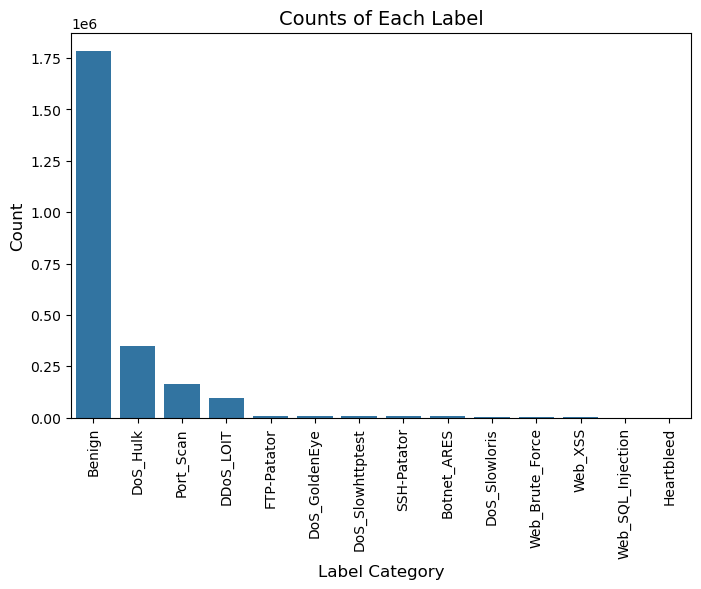

In [68]:
category_counts = data_reduced['label'].value_counts()
plt.figure(figsize=(8, 5))
sns.barplot(x=category_counts.index, y=category_counts.values)
plt.xlabel('Label Category', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.title('Counts of Each Label', fontsize=14)
plt.xticks(fontsize=10, rotation=90)
plt.yticks(fontsize=10)
plt.show()

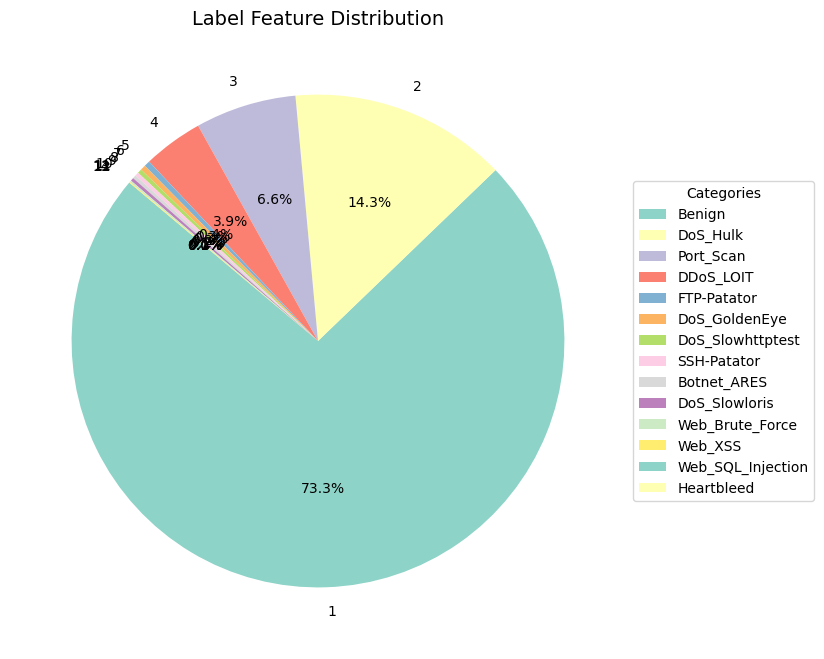

In [69]:
plt.figure(figsize=(8, 8))
wedges, texts, autotexts = plt.pie(
    category_counts.values,
    labels=range(1, len(category_counts) + 1),  # Use numbers as labels
    autopct='%1.1f%%',
    startangle=140,
    colors=plt.cm.Set3.colors
)
plt.title('Label Feature Distribution', fontsize=14)
# Add a legend mapping numbers to categories
plt.legend(
    wedges,  # Use pie chart wedges for the legend
    category_counts.index,  # Map to actual categories
    title="Categories",
    loc="center left",
    bbox_to_anchor=(1, 0, 0.5, 1)  # Position legend outside the chart
)

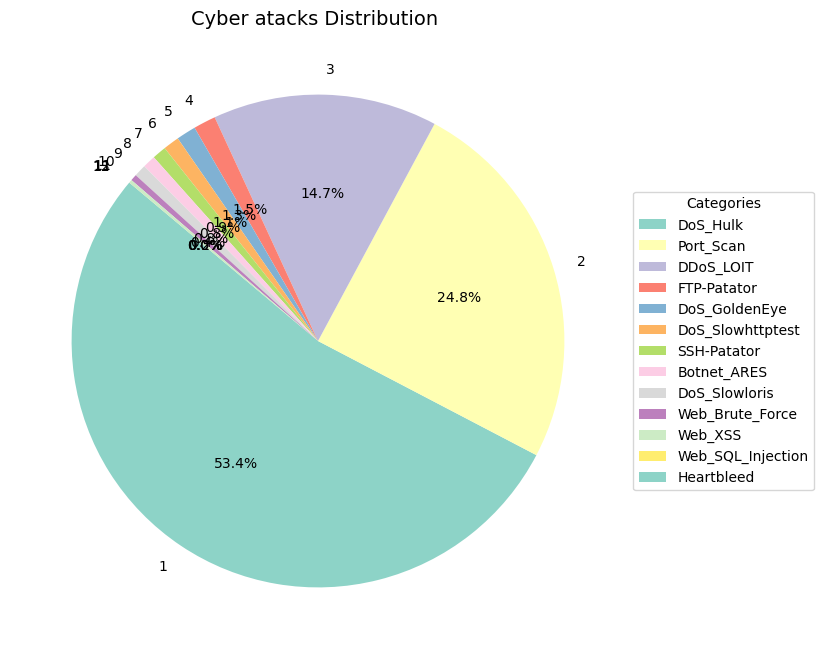

In [70]:
data_attack = data_reduced[data_reduced['label']!='Benign']
category_counts = data_attack['label'].value_counts()

plt.figure(figsize=(8, 8))
wedges, texts, autotexts = plt.pie(
    category_counts.values,
    labels=range(1, len(category_counts) + 1),  # Use numbers as labels
    autopct='%1.1f%%',
    startangle=140,
    colors=plt.cm.Set3.colors
)
plt.title('Cyber atacks Distribution ', fontsize=14)
# Add a legend mapping numbers to categories
plt.legend(
    wedges,  # Use pie chart wedges for the legend
    category_counts.index,  # Map to actual categories
    title="Categories",
    loc="center left",
    bbox_to_anchor=(1, 0, 0.5, 1)  # Position legend outside the chart
)


As the 73.3% of the data corresponds to the categorie "Benign", the EDA will be splitted in two sections: "Benign" and "Cyber-attack" data.

## Benign Data Exploration<a id='benign-data-exploration'></a>

In [71]:
data_benign = data_reduced[data_reduced['label']=='Benign']

### Categorical Data

In [72]:
group1_columns = ['flow_id', 'timestamp', 'src_ip', 'src_port', 'dst_ip', 'dst_port','protocol']
data_categorical = data_benign[group1_columns]

for col in data_categorical:
    print(f"Value counts for {col}:")
    print(data_categorical[col].value_counts())
    print("\n")

Value counts for flow_id:
flow_id
192.168.10.14_58468_192.168.10.3_53_UDP_2017-07-04 08:09:58.890741       1
192.168.10.3_61927_192.168.10.1_53_UDP_2017-07-03 11:52:01.372405        1
192.168.10.5_60986_173.241.242.143_443_TCP_2017-07-03 11:00:06.820525    1
192.168.10.3_61526_192.168.10.1_53_UDP_2017-07-03 11:55:13.856156        1
192.168.10.5_60959_173.241.242.143_443_TCP_2017-07-03 11:00:06.820450    1
                                                                        ..
192.168.10.14_53640_54.192.37.73_80_TCP_2017-07-05 11:12:04.072923       1
192.168.10.12_32938_52.206.53.179_443_TCP_2017-07-05 13:10:15.439954     1
192.168.10.14_53634_54.192.37.73_80_TCP_2017-07-05 11:12:04.072893       1
192.168.10.12_44624_107.22.249.166_443_TCP_2017-07-05 13:10:15.552085    1
23.10.108.151_443_192.168.10.14_59111_TCP_2017-07-07 16:02:41.005391     1
Name: count, Length: 1784954, dtype: int64


Value counts for timestamp:
timestamp
2017-07-05 10:13:29.892018    3
2017-07-05 07:43:22.809355

/var/folders/jx/psp7f4jd6yj35lm7000kqtph0000gn/T/ipykernel_16509/4030348696.py:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=unique_counts_df, x='Feature', y='Unique Count', palette='coolwarm')


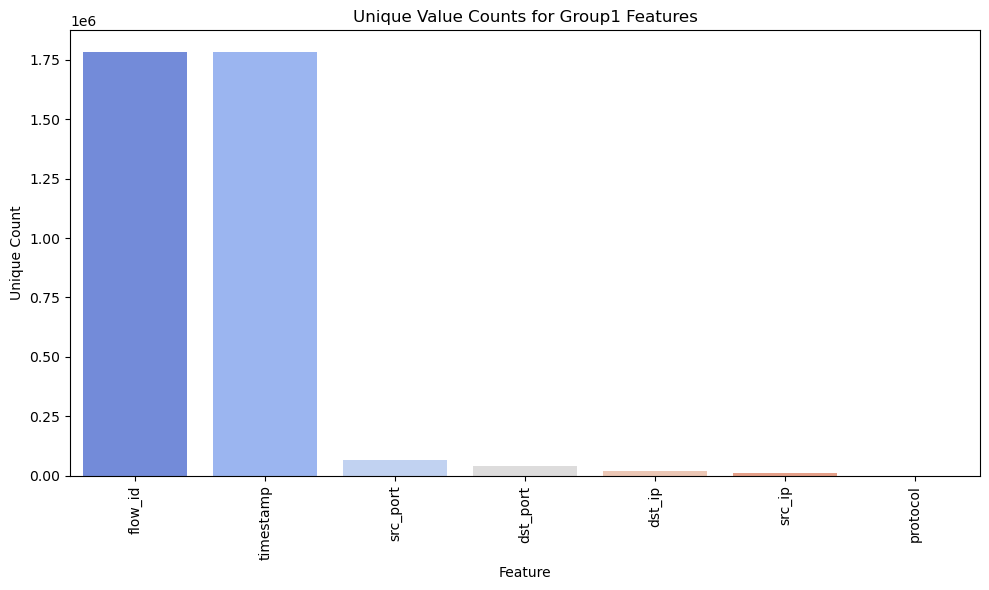

In [73]:
group1_columns = ['flow_id', 'timestamp', 'src_ip', 'src_port', 'dst_ip', 'dst_port', 'protocol']

# Create a DataFrame to store the counts of unique values
unique_counts = {col: data_benign[col].nunique() for col in group1_columns}

# Convert the dictionary to a DataFrame
unique_counts_df = pd.DataFrame(list(unique_counts.items()), columns=['Feature', 'Unique Count'])

# Sort the DataFrame for better visualization
unique_counts_df.sort_values(by='Unique Count', ascending=False, inplace=True)

# Create a bar plot
plt.figure(figsize=(10, 6))
sns.barplot(data=unique_counts_df, x='Feature', y='Unique Count', palette='coolwarm')

# Customize the plot
plt.title('Unique Value Counts for Group1 Features')
plt.xlabel('Feature')
plt.ylabel('Unique Count')
plt.xticks(rotation=90)  # Rotate x-axis labels for readability
plt.tight_layout()

# Show the plot
plt.show()

/var/folders/jx/psp7f4jd6yj35lm7000kqtph0000gn/T/ipykernel_16509/1319022096.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data_categorical, x=col, palette="coolwarm")


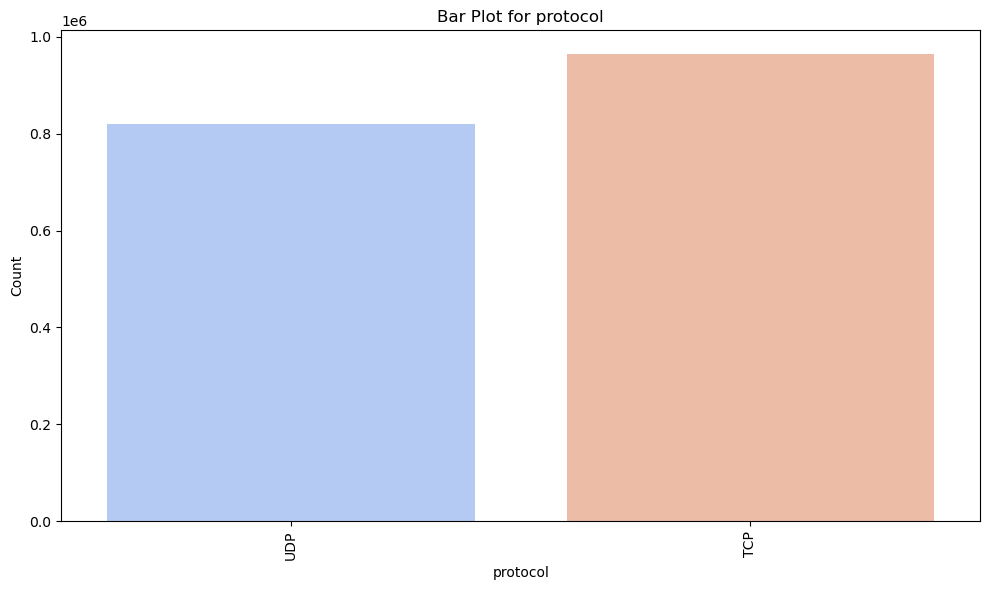

In [74]:
group1_columns = ['protocol']
data_categorical = data_benign[group1_columns]

# Create bar plots for each column
for col in data_categorical:
    plt.figure(figsize=(10, 6))
    sns.countplot(data=data_categorical, x=col, palette="coolwarm")
    
    # Customize the plot
    plt.title(f'Bar Plot for {col}')
    plt.xlabel(col)
    plt.ylabel('Count')
    plt.xticks(rotation=90)  # Rotate x-axis labels for readability
    
    # Show the plot
    plt.tight_layout()
    plt.show()

In [75]:
data_benign['src_dst_combo'] = data_benign['src_ip'] + ' -> ' + data_benign['dst_ip']

# Group by the src_dst_combo and protocol, then count the occurrences
protocol_distribution = data_benign.groupby(['src_dst_combo', 'protocol']).size().reset_index(name='Count')

protocol_unique_combos = data_benign.groupby('protocol')['src_dst_combo'].nunique().reset_index(name='Unique Combinations')

# Display the result
print(protocol_unique_combos)

/var/folders/jx/psp7f4jd6yj35lm7000kqtph0000gn/T/ipykernel_16509/3819807327.py:1: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_benign['src_dst_combo'] = data_benign['src_ip'] + ' -> ' + data_benign['dst_ip']
/var/folders/jx/psp7f4jd6yj35lm7000kqtph0000gn/T/ipykernel_16509/3819807327.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_benign['src_dst_combo'] = data_benign['src_ip'] + ' -> ' + data_benign['dst_ip']


  protocol  Unique Combinations
0      TCP                88305
1      UDP                 1228


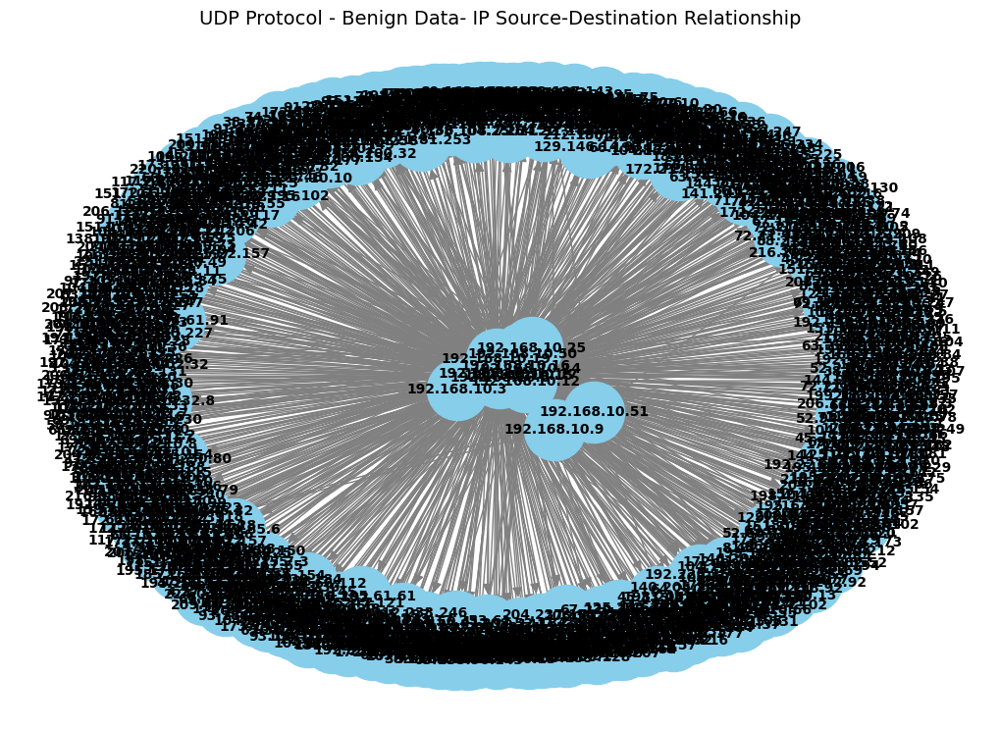

In [76]:
data_ipplot_UDP = data_benign[data_benign['protocol']=='UDP']

# Create a graph
G = nx.DiGraph()  # Directed graph (use nx.Graph() for undirected)

# Add edges (Source -> Destination)
for index, row in data_ipplot_UDP.iterrows():
    G.add_edge(row['src_ip'], row['dst_ip'])

# Draw the graph
plt.figure(figsize=(10, 7))
pos = nx.spring_layout(G)  # Position the nodes using the spring layout algorithm
nx.draw(
    G, pos, with_labels=True, node_color='skyblue', edge_color='gray', 
    node_size=2000, font_size=10, font_weight='bold', arrowsize=15
)
plt.title('UDP Protocol - Benign Data- IP Source-Destination Relationship', fontsize=14)
plt.show()

In [77]:
data_ipplot_UDP['src_ip'].value_counts()

src_ip
192.168.10.3     216257
192.168.10.9      71630
192.168.10.5      68620
192.168.10.8      67933
192.168.10.15     65994
192.168.10.12     63046
192.168.10.14     61561
192.168.10.17     50081
192.168.10.19     47210
192.168.10.16     46153
192.168.10.51     21440
192.168.10.50     20948
192.168.10.25     18872
Name: count, dtype: int64

In [78]:
data_ipplot_UDP['dst_ip'].value_counts()

dst_ip
192.168.10.3       589914
192.168.10.1       215718
192.168.10.255       3774
192.168.10.25         951
224.0.0.251           383
                    ...  
5.134.212.32            1
141.202.253.195         1
72.5.72.15              1
151.101.192.175         1
151.101.209.5           1
Name: count, Length: 943, dtype: int64

In [79]:
data_ipplot_TCP = data_benign[data_benign['protocol']=='TCP']

In [80]:
data_ipplot_TCP['src_ip'].value_counts()

src_ip
192.168.10.25     112453
192.168.10.5       90600
192.168.10.12      73618
192.168.10.9       69161
192.168.10.15      66608
                   ...  
91.192.149.17          1
172.217.29.195         1
34.202.25.97           1
54.192.36.208          1
23.211.102.137         1
Name: count, Length: 11965, dtype: int64

In [81]:
data_ipplot_TCP['dst_ip'].value_counts()

dst_ip
192.168.10.25      36170
192.168.10.16      27800
192.168.10.5       23651
192.168.10.12      19691
192.168.10.8       17063
                   ...  
217.156.250.230        1
176.34.185.170         1
54.231.50.4            1
69.147.64.36           1
52.3.60.18             1
Name: count, Length: 17930, dtype: int64

### Numerical Data

#### Univariable Analysis

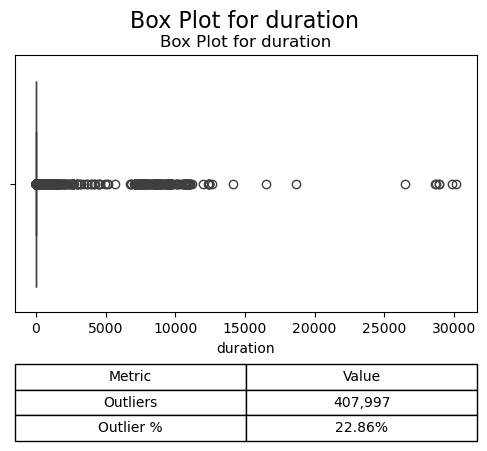

In [82]:
variable = 'duration'

# Calculate IQR and outliers for 'duration'
Q1 = data_benign[variable].quantile(0.25)
Q3 = data_benign[variable].quantile(0.75)
IQR = Q3 - Q1
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR
outliers = data_benign[(data_benign[variable] < lower_bound) | (data_benign[variable] > upper_bound)]
n_outliers = len(outliers)
outlier_percentage = (n_outliers / len(data_benign)) * 100

# Create subplots with the same layout
fig, ax = plt.subplots(1, 1, figsize=(5, 5))  # Single subplot

# Create boxplot for 'duration'
sns.boxplot(x=data_benign[variable], ax=ax)
ax.set_title(f'Box Plot for {variable}')

# Add table with outlier information
table_data = [
    ['Outliers',f'{n_outliers:,}'],
    ['Outlier %', f'{outlier_percentage:.2f}%']
]
table = ax.table(cellText=table_data, colLabels=['Metric', 'Value'], cellLoc='center',
                 loc='bottom', bbox=[0, -0.5, 1, 0.3])  # Adjust bbox for table

# Adjust layout
plt.tight_layout()
plt.suptitle(f'Box Plot for {variable}', y=1.02, fontsize=16)  # Add a title for the figure
plt.subplots_adjust(hspace=0.7)  # Add space for the table
plt.show()

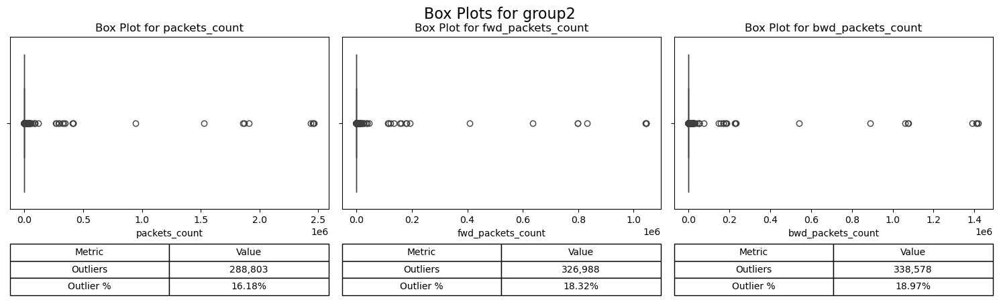

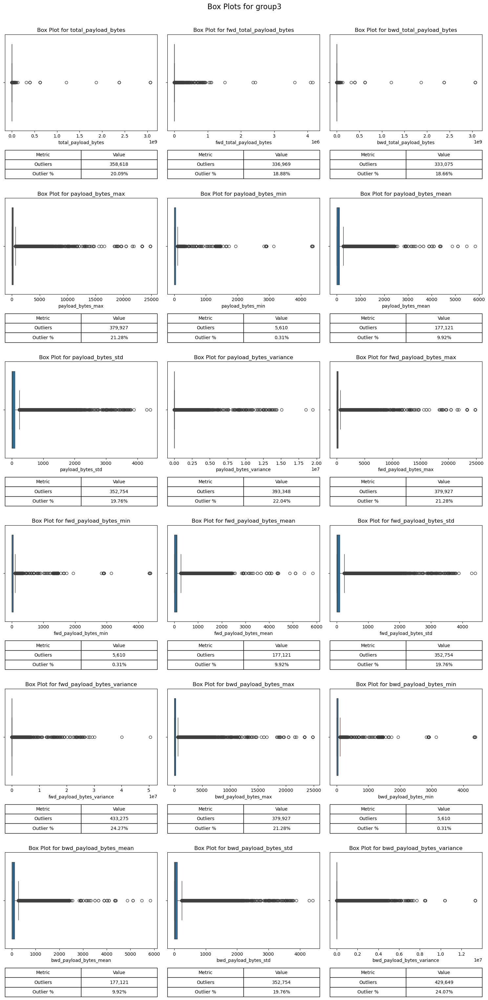

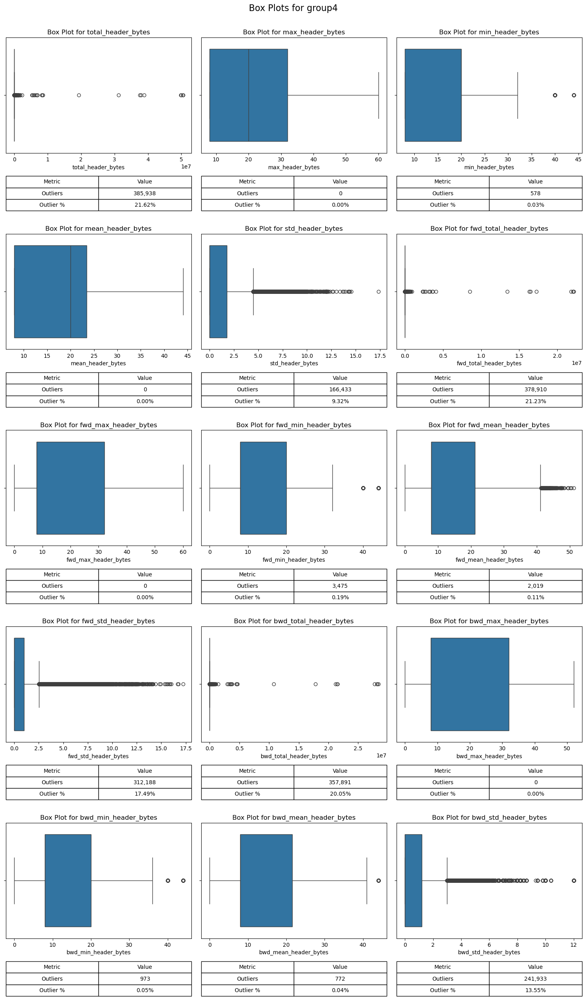

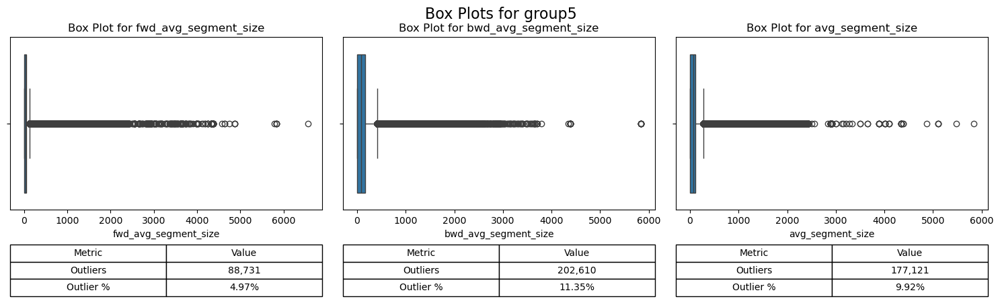

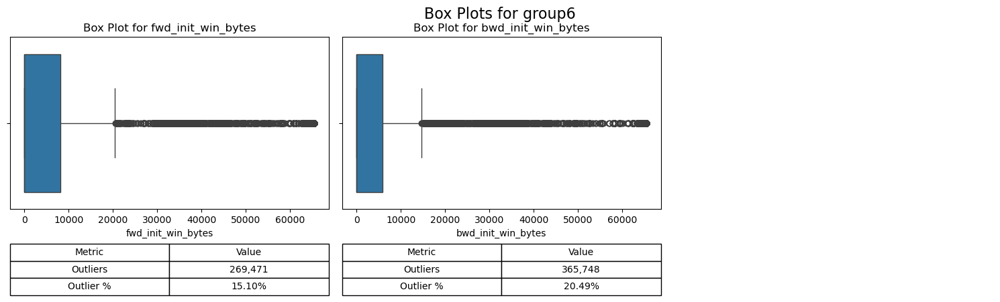

...

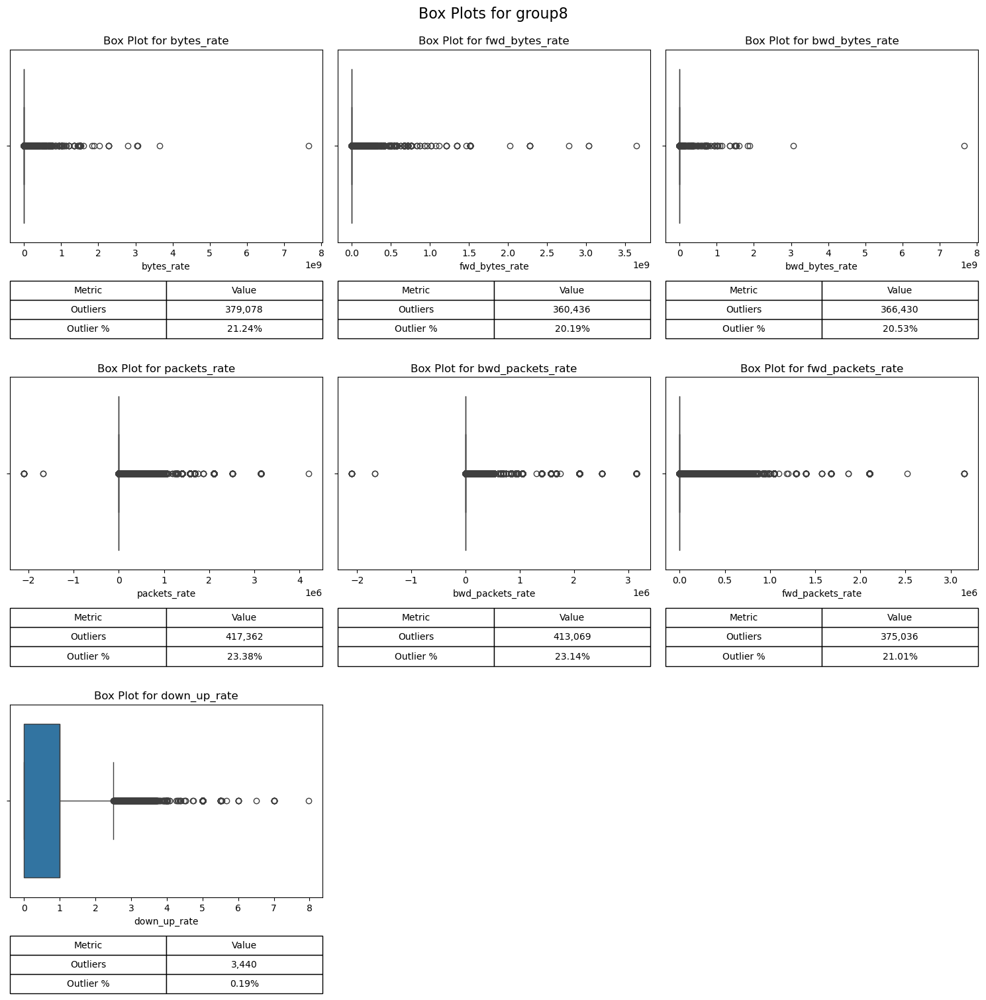

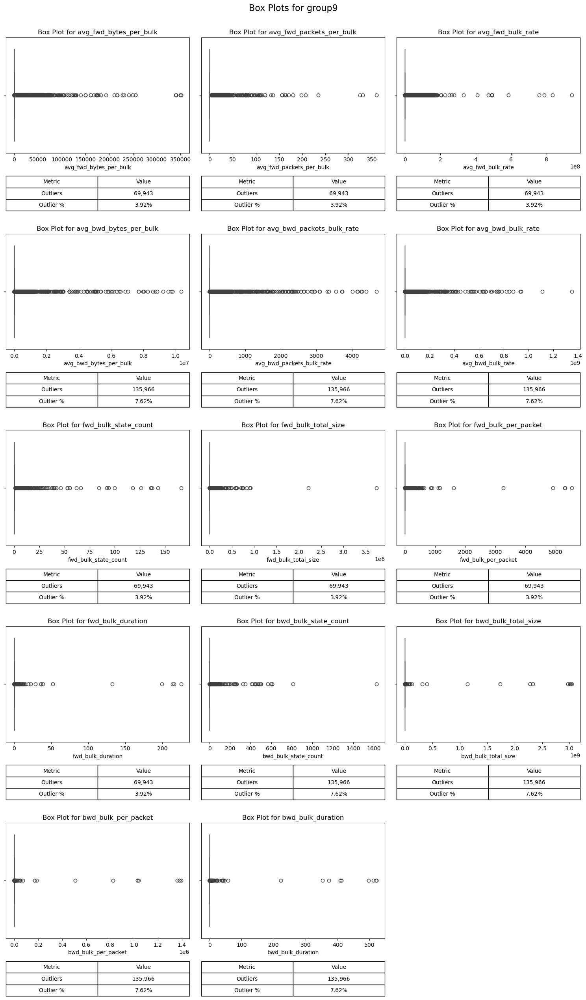

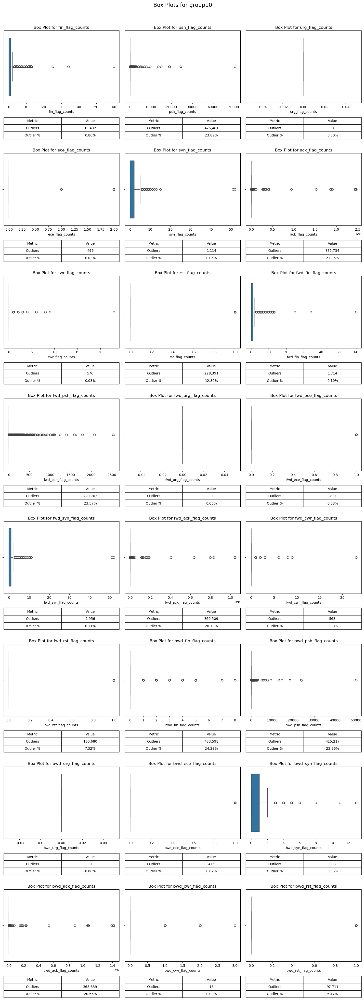

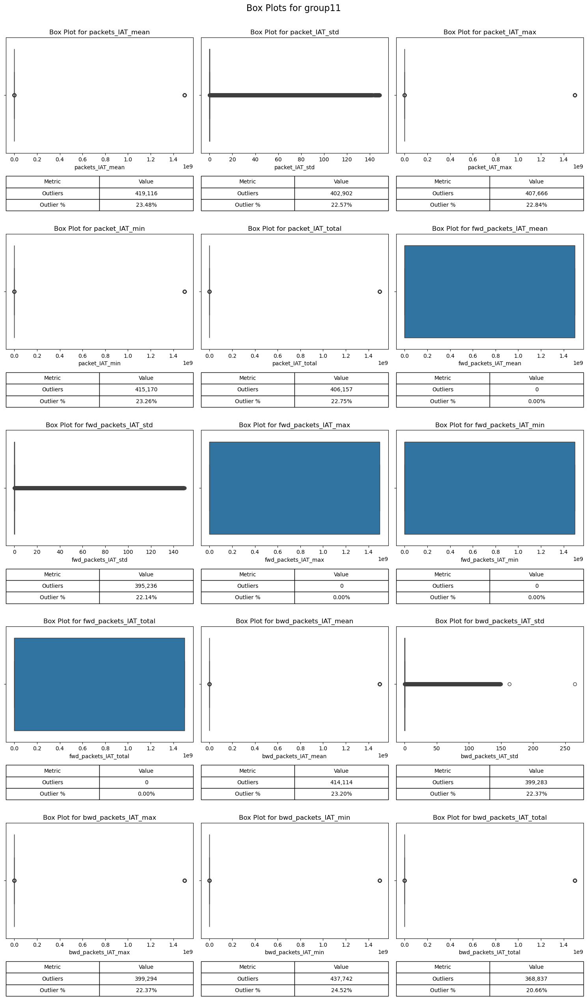

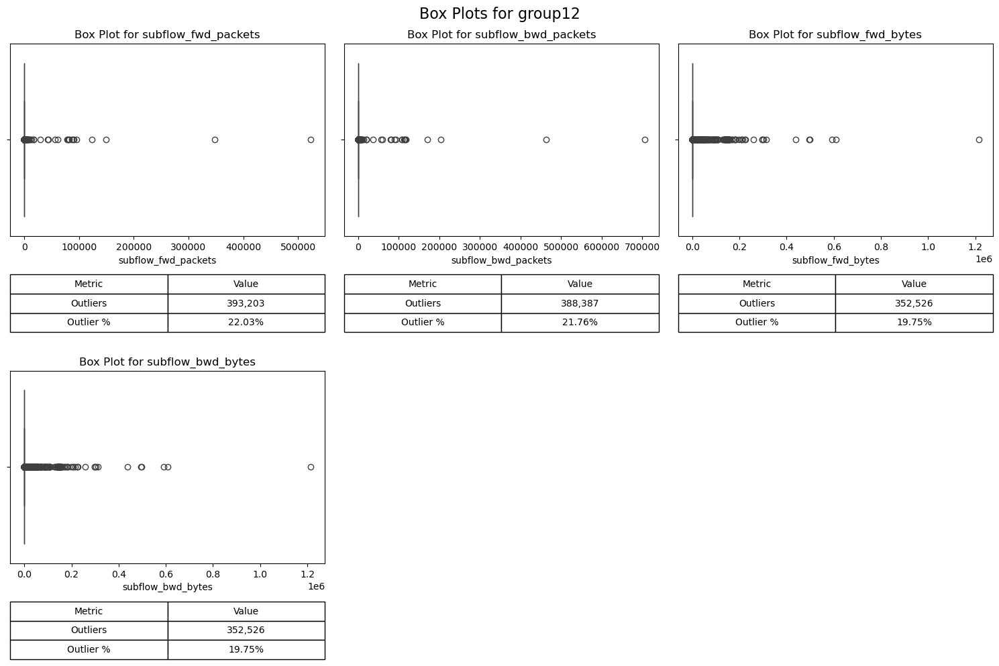

In [83]:
for group_number in range(2, 13):
    # Dynamically set the group variable (e.g., group2, group3, ..., group12)
    group_name = f"group{group_number}"  
    chosen_variables = eval(group_name).columns.tolist()  # Get the column names for the group

    # Calculate the number of rows and columns for subplots
    n_vars = len(chosen_variables)
    n_cols = 3  # Number of columns per row
    n_rows = math.ceil(n_vars / n_cols)  # Calculate rows dynamically

    # Create subplots
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(5 * n_cols, 5 * n_rows))  # Adjust figure size
    axes = axes.flatten()  # Flatten axes for easier iteration

    # Plot boxplots for each variable in the group
    for i, var in enumerate(chosen_variables):
        # Calculate IQR and outliers
        Q1 = data_benign[var].quantile(0.25)
        Q3 = data_benign[var].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        outliers = data_benign[(data_benign[var] < lower_bound) | (data_benign[var] > upper_bound)]
        n_outliers = len(outliers)
        outlier_percentage = (n_outliers / len(data_benign)) * 100

        # Create boxplot
        sns.boxplot(x=data_benign[var], ax=axes[i])  # Create the boxplot
        axes[i].set_title(f'Box Plot for {var}')  # Add title

        # Add table with outlier information
        table_data = [
            ['Outliers', f'{n_outliers:,}'],
            ['Outlier %', f'{outlier_percentage:.2f}%']
        ]
        table = axes[i].table(cellText=table_data, colLabels=['Metric', 'Value'], cellLoc='center',
                              loc='bottom', bbox=[0, -0.5, 1, 0.3])  # Position the table

    # Turn off unused subplots
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    # Adjust layout
    plt.tight_layout()
    plt.suptitle(f'Box Plots for {group_name}', y=1.02, fontsize=16)  # Add a title for the entire figure
    plt.subplots_adjust(hspace=0.7)  # Add space for tables
    plt.show()

#### Multivariable Analysis

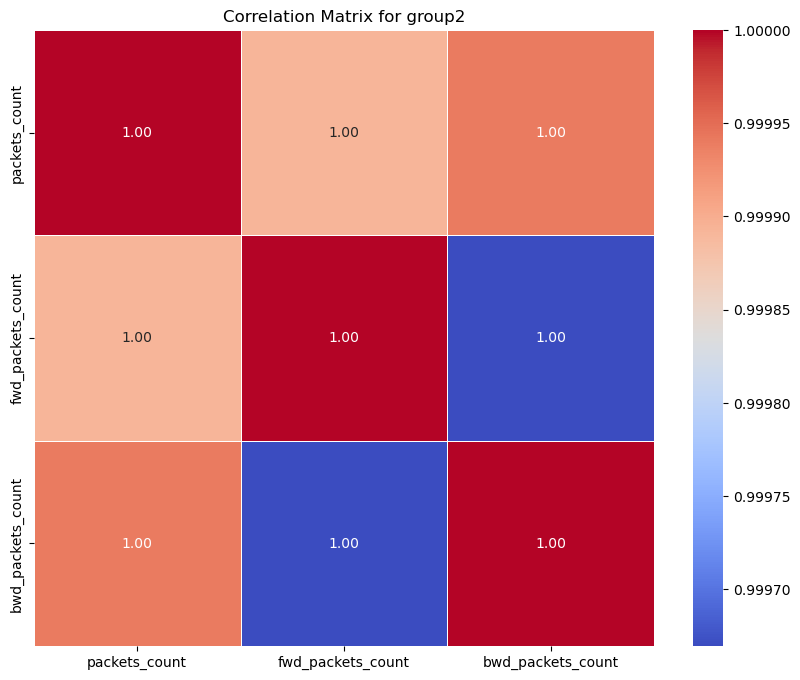

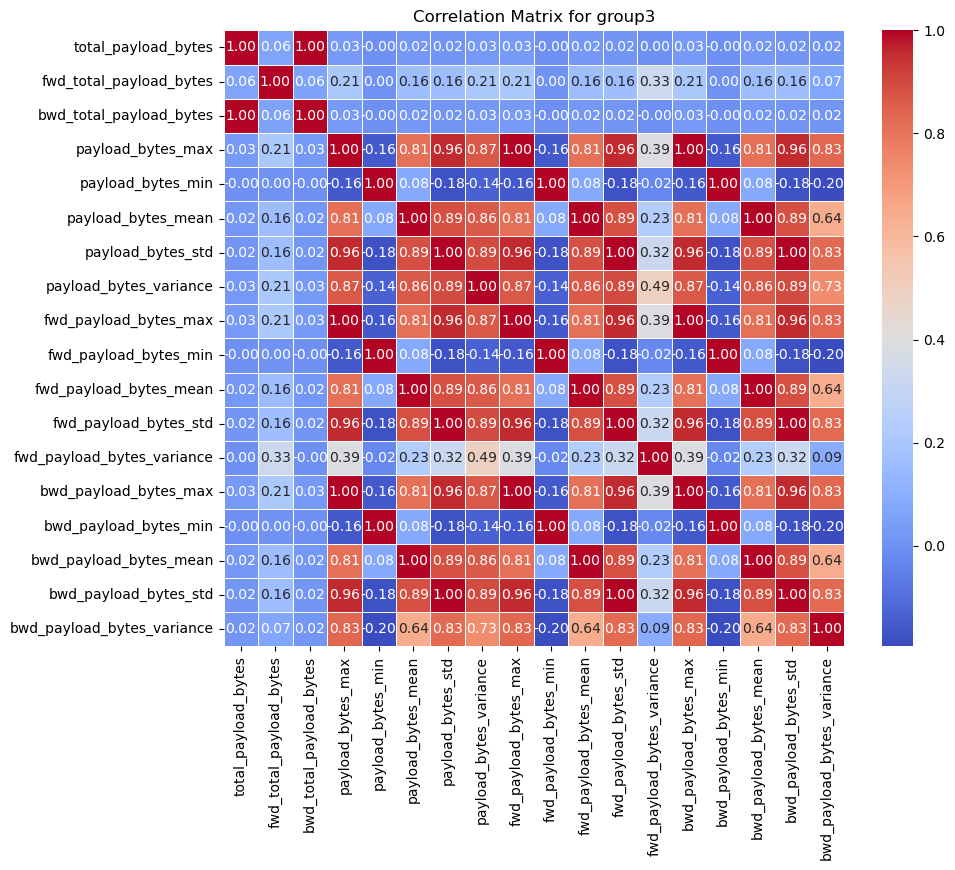

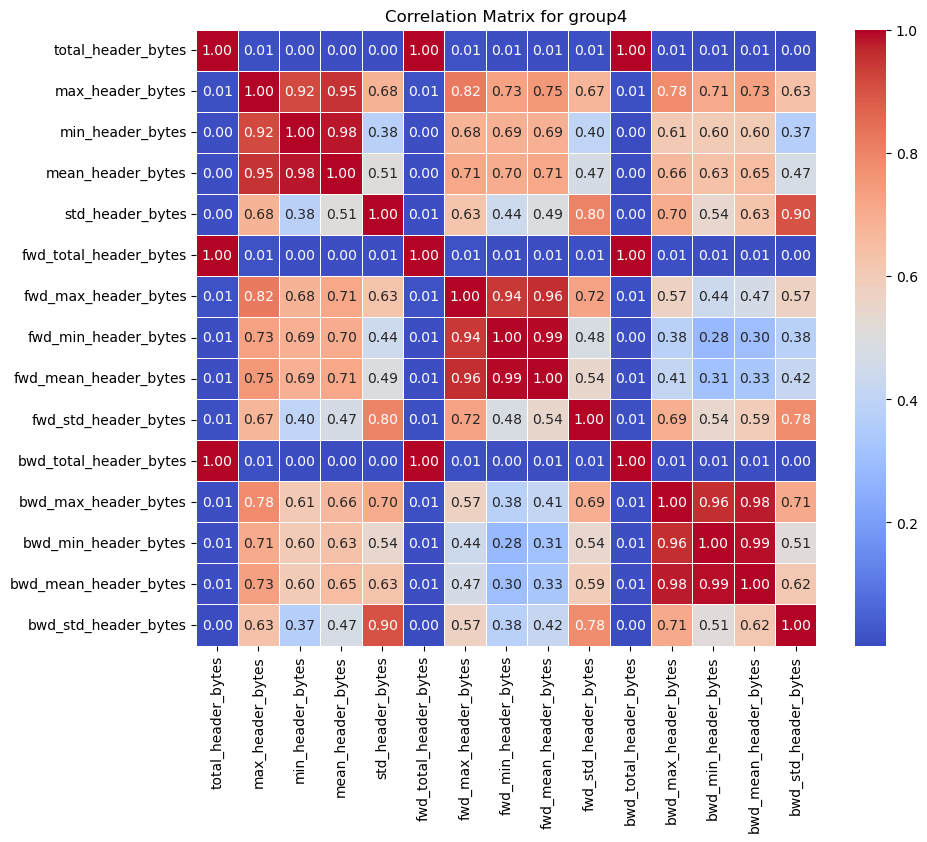

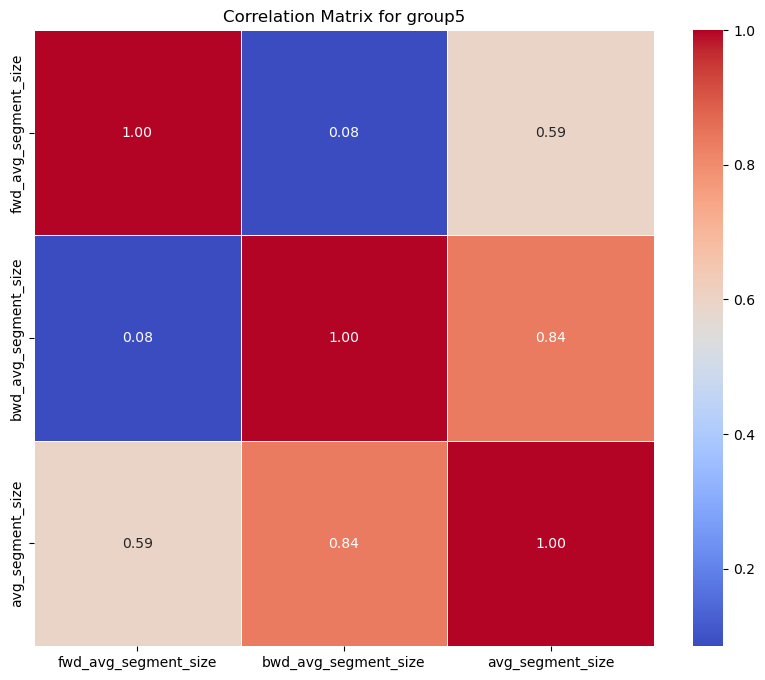

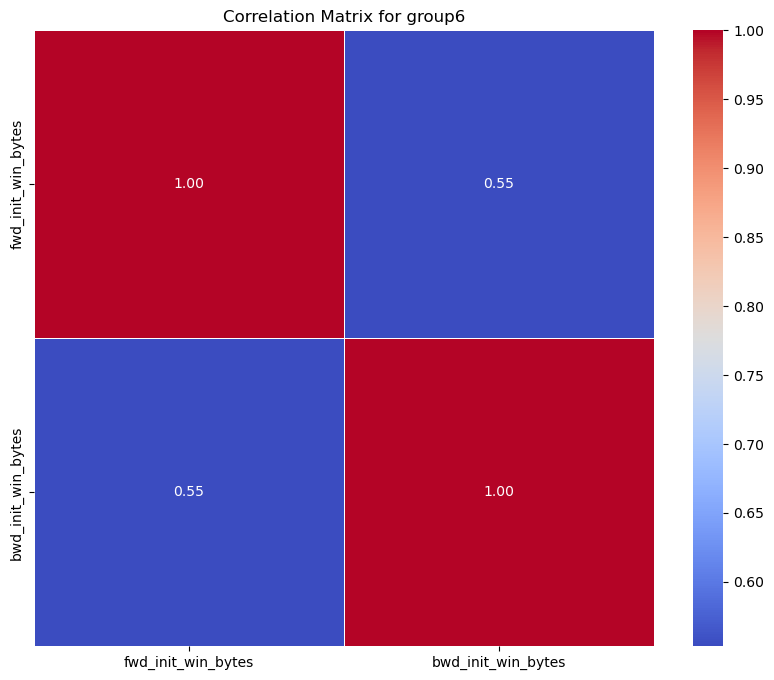

...

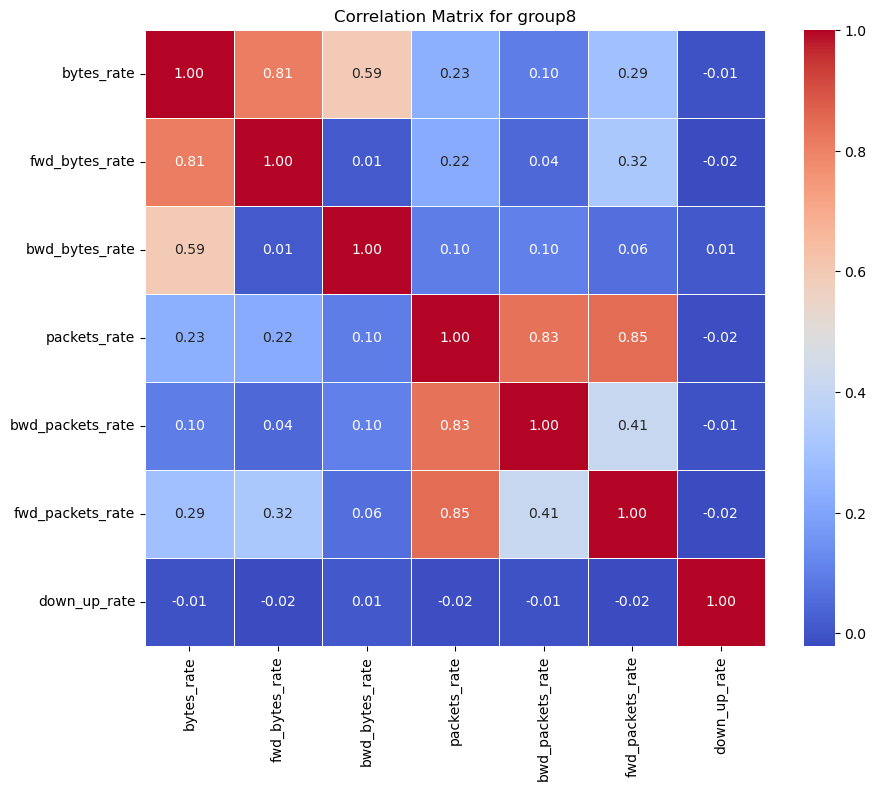

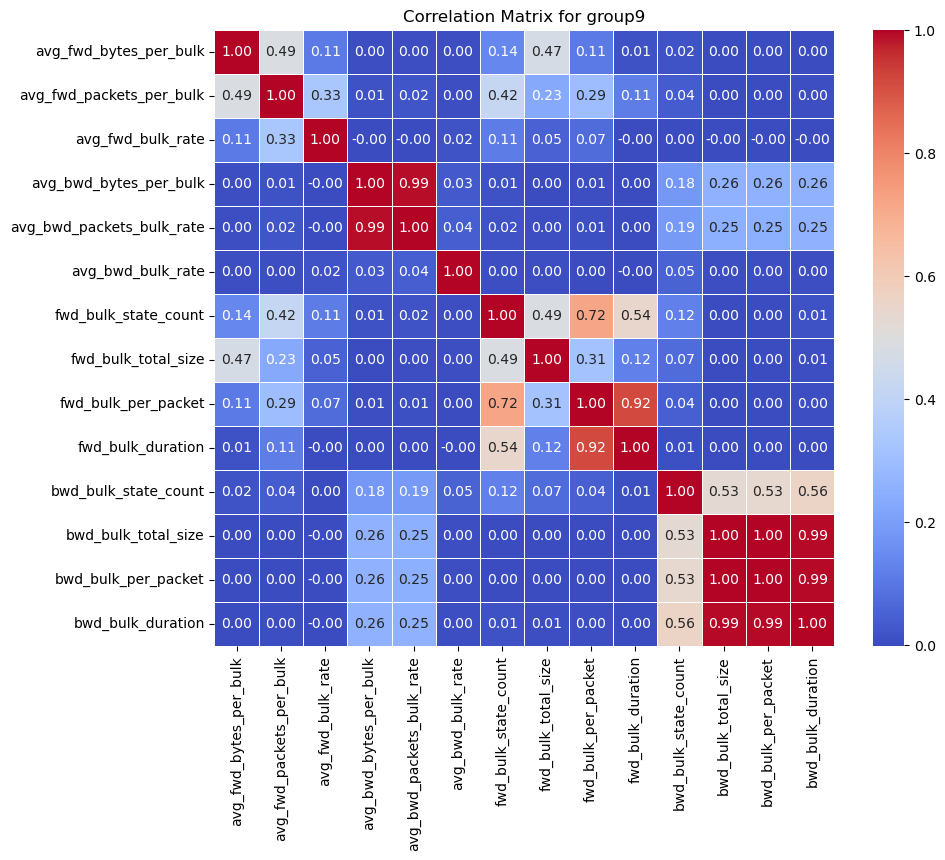

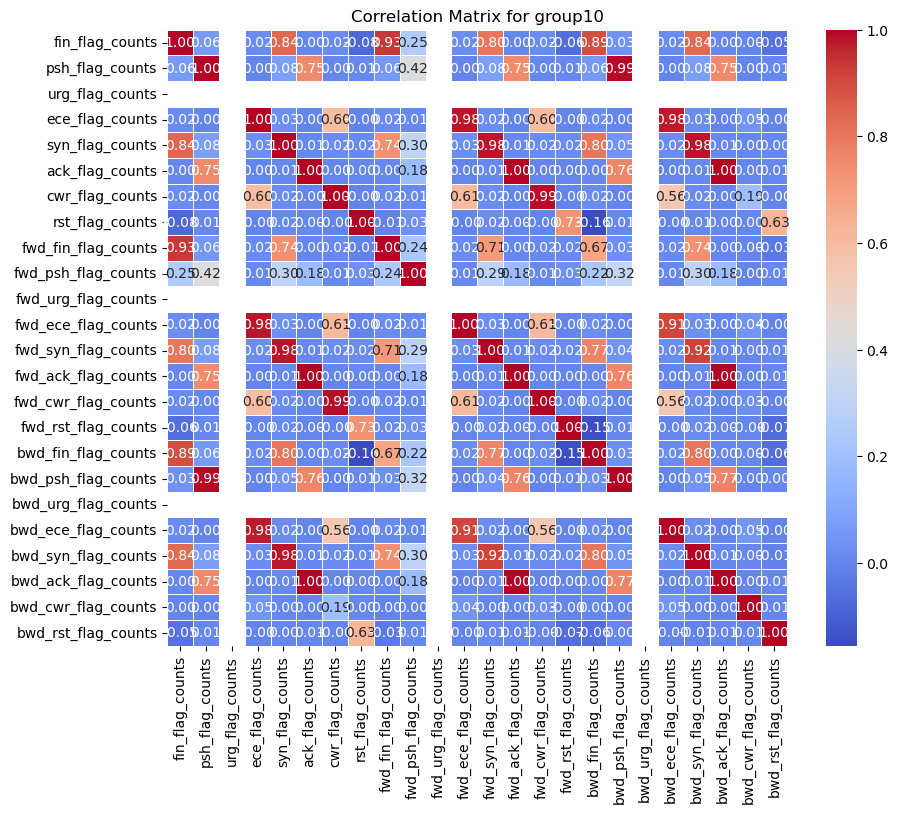

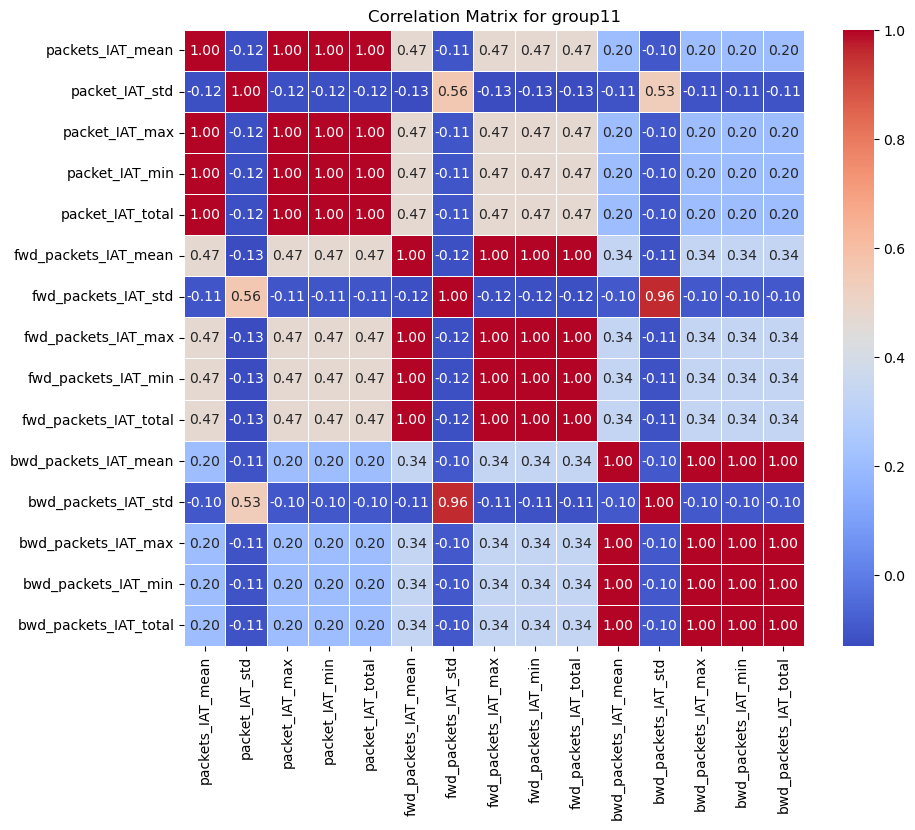

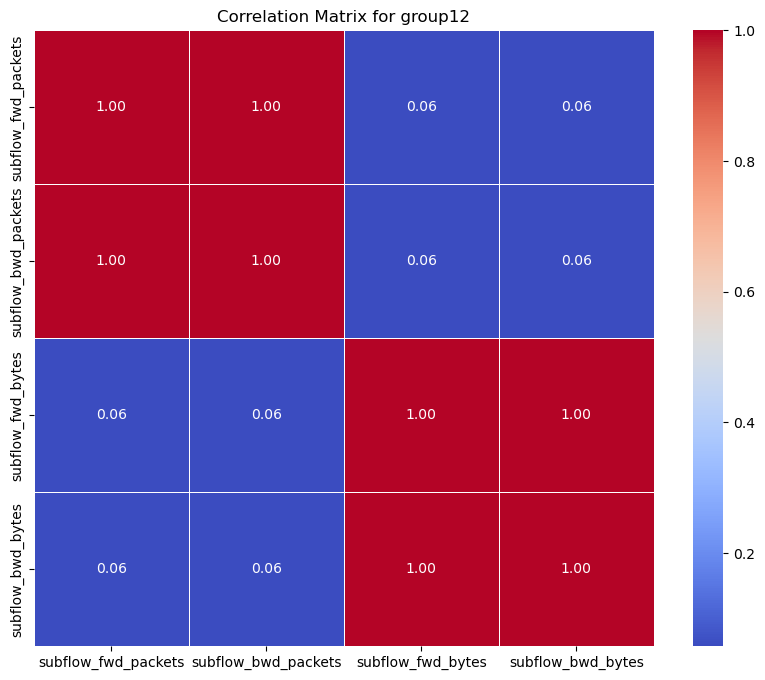

In [84]:
for group_number in range(2, 13):
    # Dynamically set the group variable (e.g., group2, group3, ..., group12)
    group_name = f"group{group_number}"  
    chosen_variables = eval(group_name).columns.tolist()  # Get the column names for the group

    # Calculate the correlation matrix for the chosen variables
    correlation_matrix = data_benign[chosen_variables].corr()

    # Create a heatmap for the correlation matrix
    plt.figure(figsize=(10, 8))
    sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
    plt.title(f'Correlation Matrix for {group_name}')
    plt.show()

#### Time Stamp

/var/folders/jx/psp7f4jd6yj35lm7000kqtph0000gn/T/ipykernel_16509/1350353114.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_benign['timestamp'] = pd.to_datetime(data_benign['timestamp'], errors='coerce')


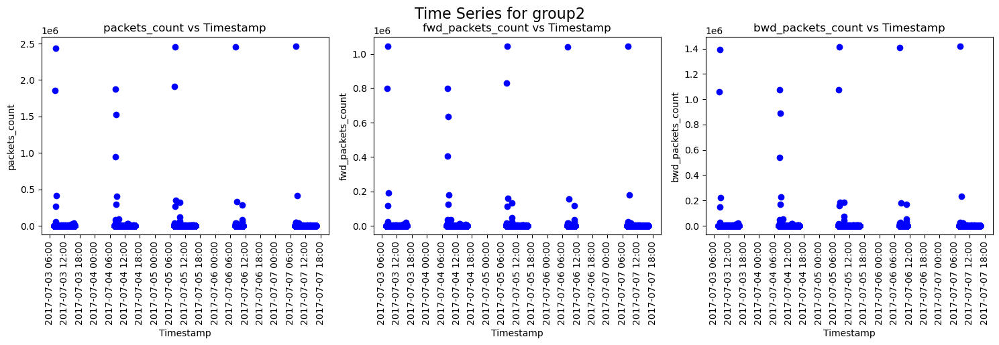

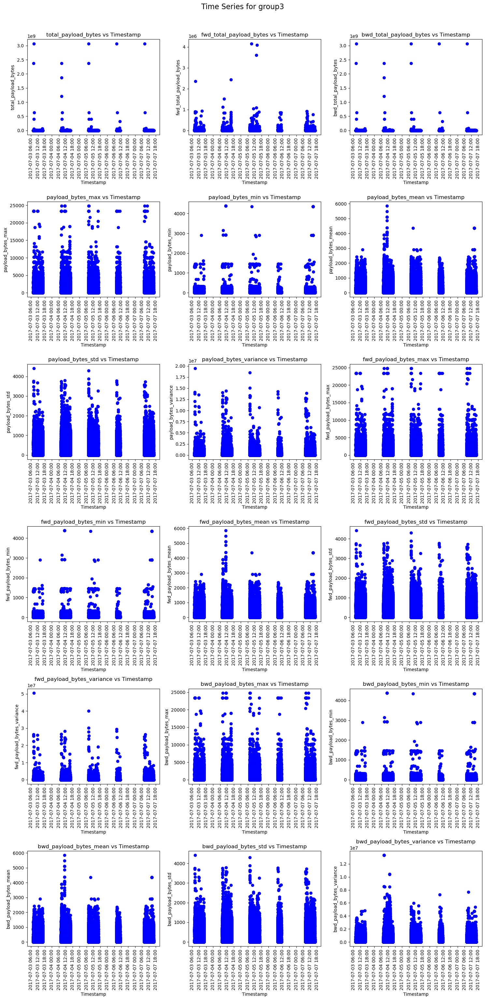

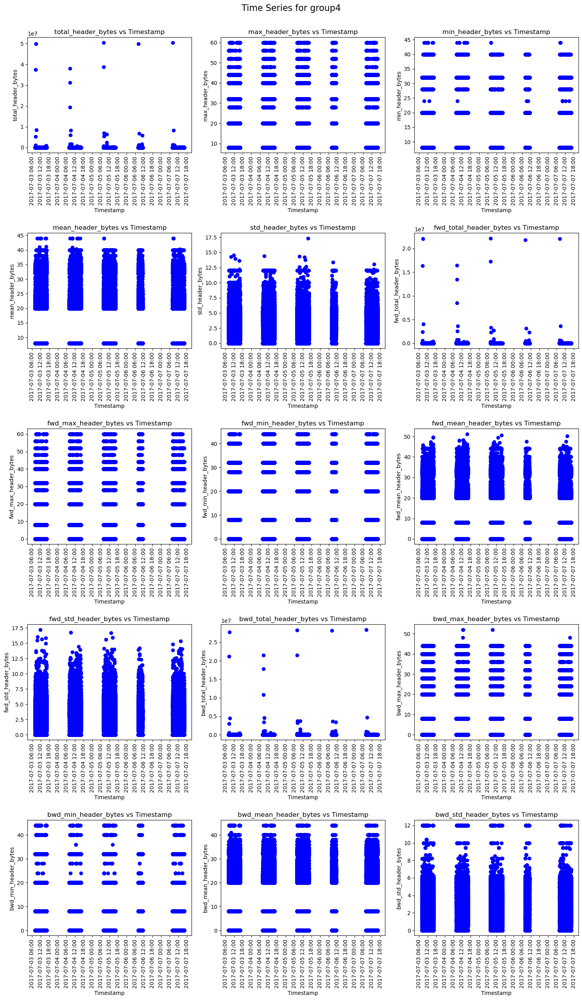

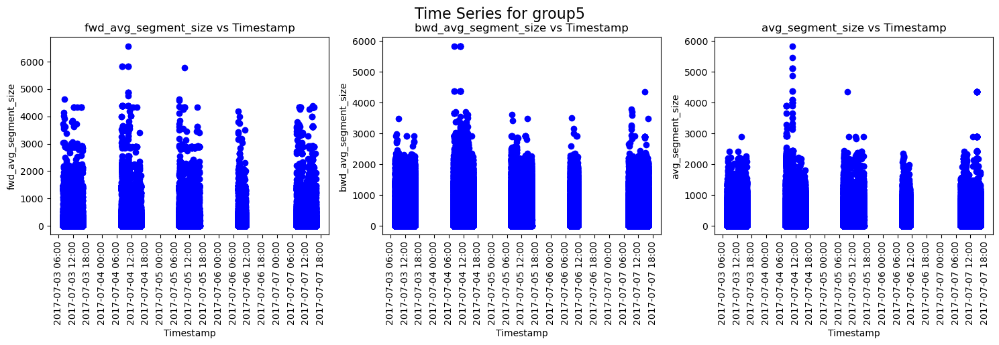

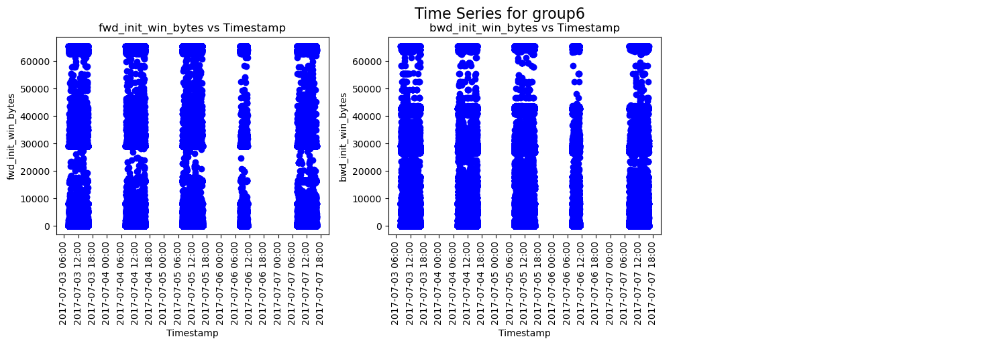

...

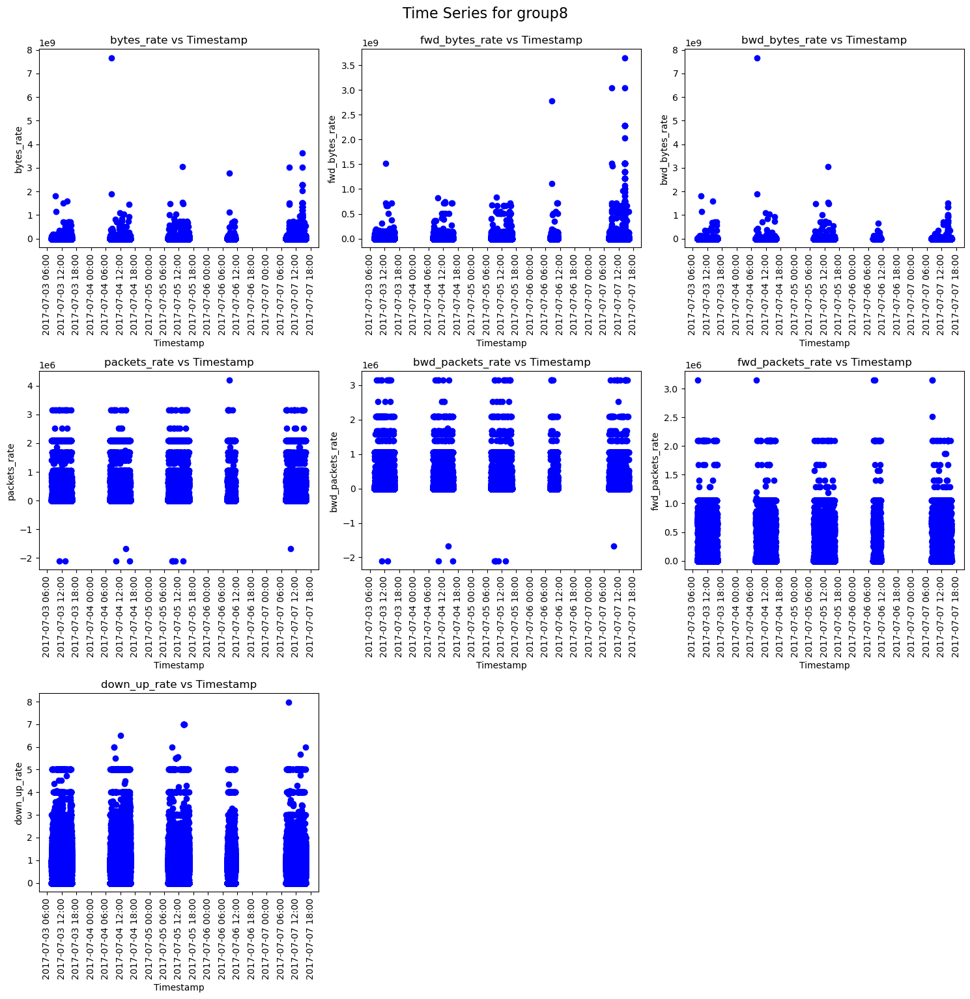

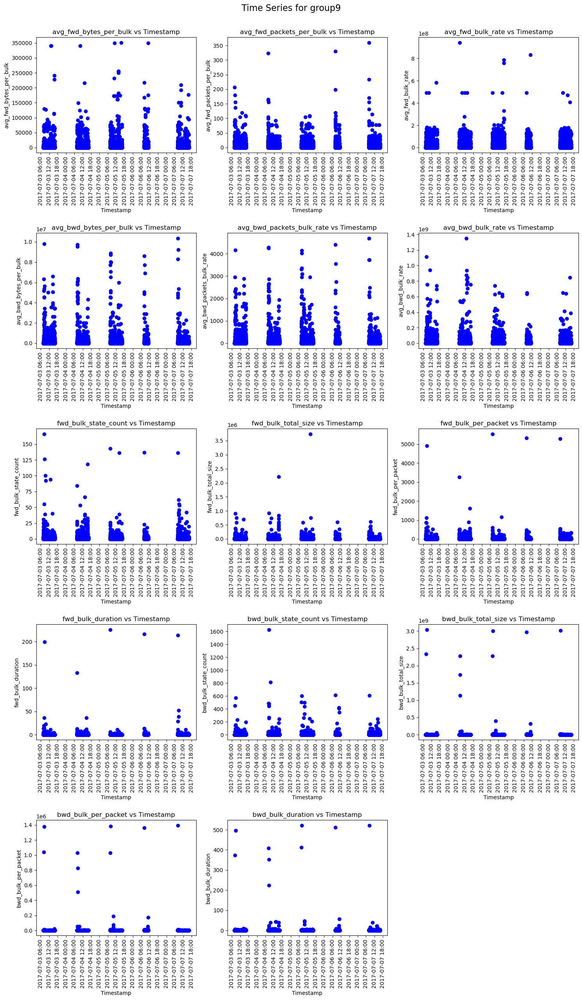

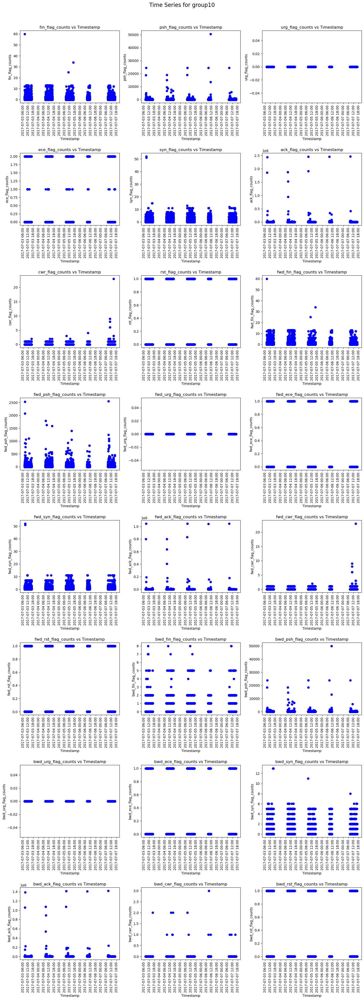

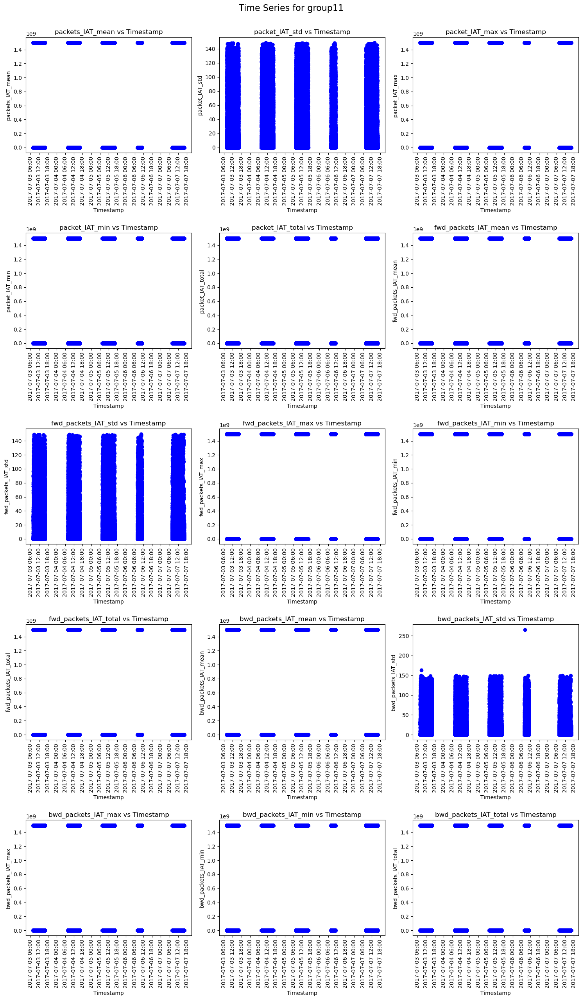

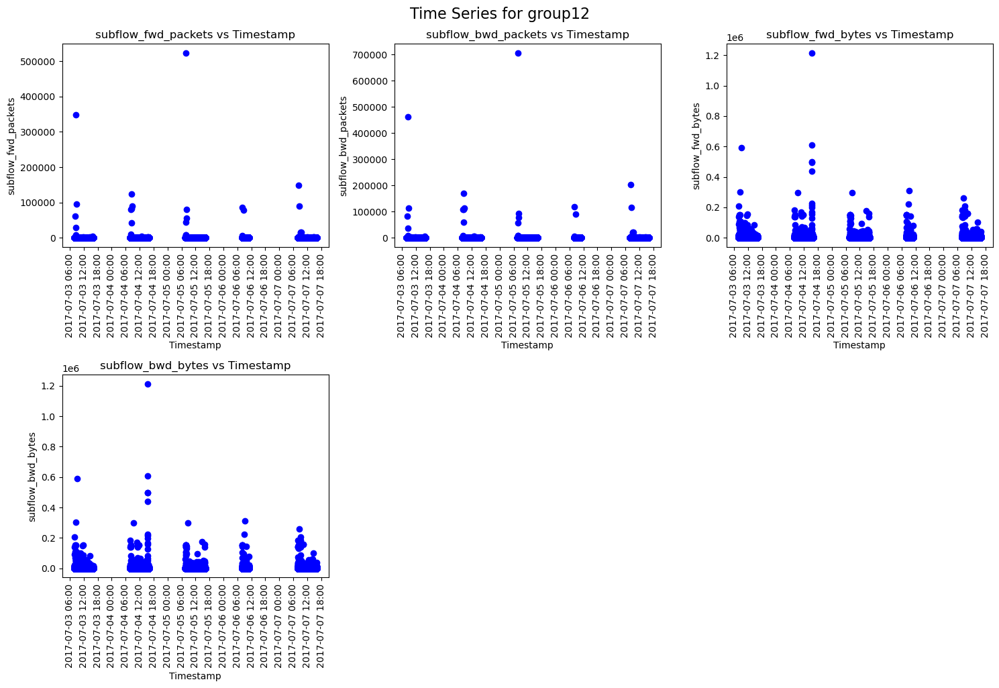

In [85]:
# Ensure the timestamp column is parsed as datetime
data_benign['timestamp'] = pd.to_datetime(data_benign['timestamp'], errors='coerce')

# Adjust the agg chunksize for large plots
mpl.rcParams['agg.path.chunksize'] = 10_000

# Iterate through the groups
for group_number in range(2, 13):  # Adjust the range based on the group numbers
    # Dynamically set the group variable (e.g., group2, group3, ..., group12)
    group_name = f"group{group_number}"  
    chosen_variables = eval(group_name).columns.tolist()  # Get the column names for the group

    # Calculate the number of rows and columns for subplots
    n_vars = len(chosen_variables)
    n_cols = 3  # You can change this based on how many columns you want
    n_rows = math.ceil(n_vars / n_cols)  # Calculate rows dynamically

    # Create subplots
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(5 * n_cols, 5 * n_rows))  # Adjust figure size
    axes = axes.flatten()  # Flatten axes for easier iteration

    # Plot time-series for each variable in the group
    for i, var in enumerate(chosen_variables):
        axes[i].plot(data_benign['timestamp'], data_benign[var], marker='o', linestyle='', color='b')
        axes[i].set_title(f'{var} vs Timestamp')  # Add title
        axes[i].set_xlabel('Timestamp')  # X-axis label
        axes[i].set_ylabel(var)  # Y-axis label
        axes[i].tick_params(axis='x', rotation=90)

        # Set x-axis locator and formatter for timestamps
        axes[i].xaxis.set_major_locator(mdates.AutoDateLocator(minticks=10, maxticks=20))  # Adjust tick frequency
        axes[i].xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d %H:%M'))  # Format datetime

    # Turn off unused subplots
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    # Adjust layout
    plt.tight_layout()
    plt.suptitle(f'Time Series for {group_name}', y=1.02, fontsize=16)  # Add a title for the entire figure
    plt.show()

## Cyber-Attack Data Exploration<a id='cyber-attack-data-exploration'></a>

In [99]:
data_attack = data_reduced[data_reduced['label']!='Benign']

### Categorical Data

In [100]:
group1_columns = ['flow_id', 'timestamp', 'src_ip', 'src_port', 'dst_ip', 'dst_port','protocol']
data_categorical = data_attack[group1_columns]

for col in data_categorical:
    print(f"Value counts for {col}:")
    print(data_categorical[col].value_counts())
    print("\n")

Value counts for flow_id:
flow_id
172.16.0.1_60744_192.168.10.50_21_TCP_2017-07-07 13:14:05.497800     1
192.168.10.50_80_172.16.0.1_46808_TCP_2017-07-05 09:49:14.446409     1
172.16.0.1_49032_192.168.10.50_80_TCP_2017-07-05 09:49:30.597816     1
172.16.0.1_49030_192.168.10.50_80_TCP_2017-07-05 09:49:30.606849     1
172.16.0.1_49034_192.168.10.50_80_TCP_2017-07-05 09:49:30.503884     1
                                                                    ..
172.16.0.1_58274_192.168.10.50_80_TCP_2017-07-07 15:01:57.566400     1
172.16.0.1_58273_192.168.10.50_80_TCP_2017-07-07 15:01:57.566399     1
172.16.0.1_55741_192.168.10.50_80_TCP_2017-07-07 15:08:56.925257     1
172.16.0.1_55742_192.168.10.50_80_TCP_2017-07-07 15:08:57.284915     1
172.16.0.1_443_192.168.10.51_48059_TCP_2017-07-05 09:13:54.669225    1
Name: count, Length: 649915, dtype: int64


Value counts for timestamp:
timestamp
2017-07-05 10:00:06.097907    7
2017-07-07 15:06:52.396036    7
2017-07-05 09:57:35.715151    6
2017-07

/var/folders/jx/psp7f4jd6yj35lm7000kqtph0000gn/T/ipykernel_16509/3289551102.py:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=unique_counts_df, x='Feature', y='Unique Count', palette='coolwarm')


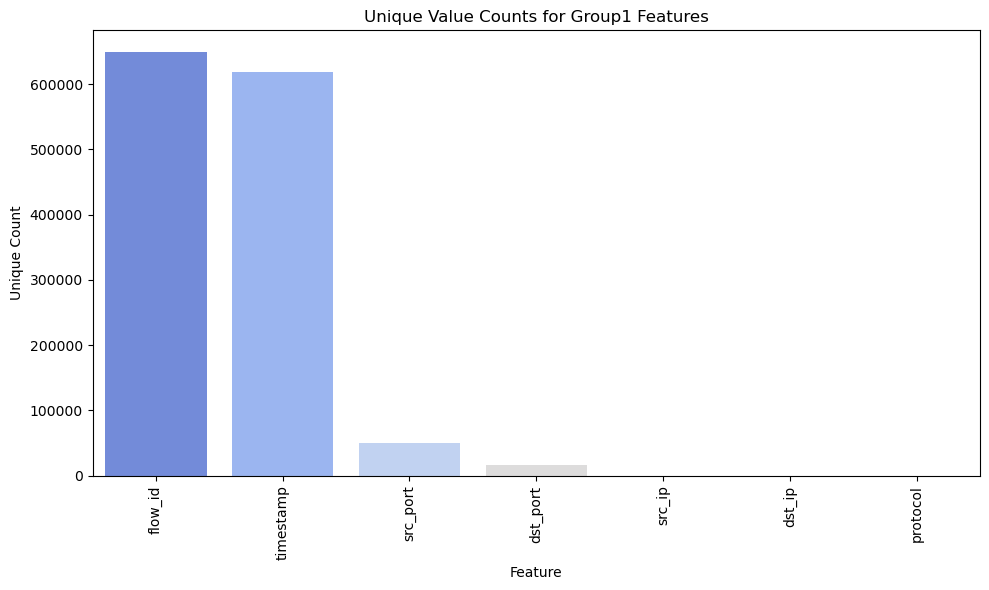

In [101]:
group1_columns = ['flow_id', 'timestamp', 'src_ip', 'src_port', 'dst_ip', 'dst_port', 'protocol']

# Create a DataFrame to store the counts of unique values
unique_counts = {col: data_attack[col].nunique() for col in group1_columns}

# Convert the dictionary to a DataFrame
unique_counts_df = pd.DataFrame(list(unique_counts.items()), columns=['Feature', 'Unique Count'])

# Sort the DataFrame for better visualization
unique_counts_df.sort_values(by='Unique Count', ascending=False, inplace=True)

# Create a bar plot
plt.figure(figsize=(10, 6))
sns.barplot(data=unique_counts_df, x='Feature', y='Unique Count', palette='coolwarm')

# Customize the plot
plt.title('Unique Value Counts for Group1 Features')
plt.xlabel('Feature')
plt.ylabel('Unique Count')
plt.xticks(rotation=90)  # Rotate x-axis labels for readability
plt.tight_layout()

# Show the plot
plt.show()

/var/folders/jx/psp7f4jd6yj35lm7000kqtph0000gn/T/ipykernel_16509/2535638743.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data_categorical, x=col, palette="coolwarm")


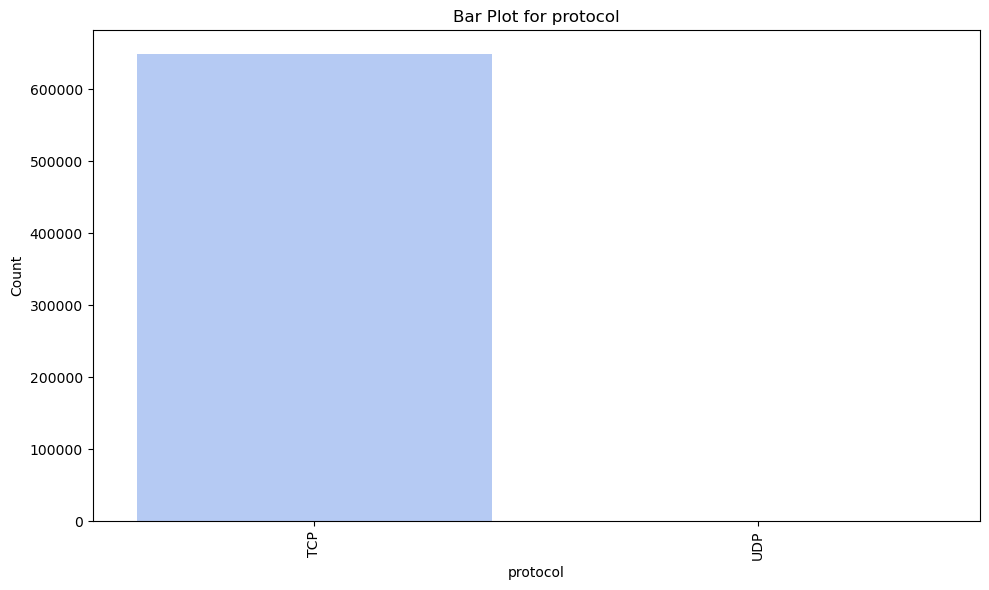

In [102]:
group1_columns = ['protocol']
data_categorical = data_attack[group1_columns]

# Create bar plots for each column
for col in data_categorical:
    plt.figure(figsize=(10, 6))
    sns.countplot(data=data_categorical, x=col, palette="coolwarm")
    
    # Customize the plot
    plt.title(f'Bar Plot for {col}')
    plt.xlabel(col)
    plt.ylabel('Count')
    plt.xticks(rotation=90)  # Rotate x-axis labels for readability
    
    # Show the plot
    plt.tight_layout()
    plt.show()

In [103]:
data_attack['src_dst_combo'] = data_attack['src_ip'] + ' -> ' + data_attack['dst_ip']

# Group by the src_dst_combo and protocol, then count the occurrences
protocol_distribution = data_attack.groupby(['src_dst_combo', 'protocol']).size().reset_index(name='Count')

protocol_unique_combos = data_attack.groupby('protocol')['src_dst_combo'].nunique().reset_index(name='Unique Combinations')

# Display the result
print(protocol_unique_combos)

  protocol  Unique Combinations
0      TCP                   10
1      UDP                    1


/var/folders/jx/psp7f4jd6yj35lm7000kqtph0000gn/T/ipykernel_16509/2445058060.py:1: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_attack['src_dst_combo'] = data_attack['src_ip'] + ' -> ' + data_attack['dst_ip']
/var/folders/jx/psp7f4jd6yj35lm7000kqtph0000gn/T/ipykernel_16509/2445058060.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_attack['src_dst_combo'] = data_attack['src_ip'] + ' -> ' + data_attack['dst_ip']


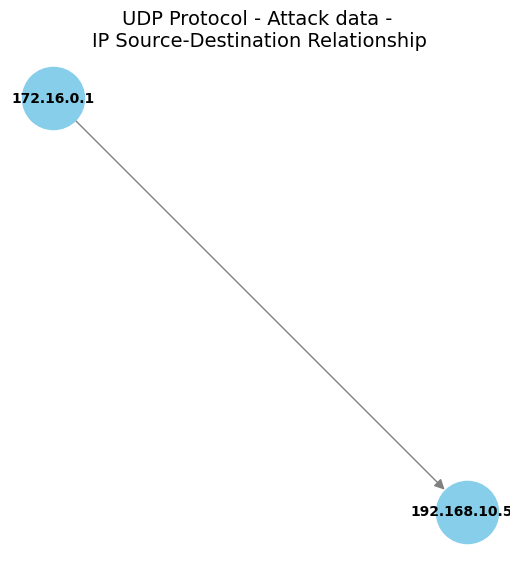

In [104]:
data_ipplot_UDP = data_attack[data_attack['protocol']=='UDP']

# Create a graph
G = nx.DiGraph()  # Directed graph (use nx.Graph() for undirected)

# Add edges (Source -> Destination)
for index, row in data_ipplot_UDP.iterrows():
    G.add_edge(row['src_ip'], row['dst_ip'])

# Draw the graph
plt.figure(figsize=(5, 5))
pos = nx.spring_layout(G)  # Position the nodes using the spring layout algorithm
nx.draw(
    G, pos, with_labels=True, node_color='skyblue', edge_color='gray', 
    node_size=2000, font_size=10, font_weight='bold', arrowsize=15
)
plt.title('UDP Protocol - Attack data - \nIP Source-Destination Relationship', fontsize=14)
plt.show()

In [105]:
data_ipplot_UDP['src_ip'].value_counts()

src_ip
172.16.0.1    268
Name: count, dtype: int64

In [106]:
data_ipplot_UDP['dst_ip'].value_counts()

dst_ip
192.168.10.50    268
Name: count, dtype: int64

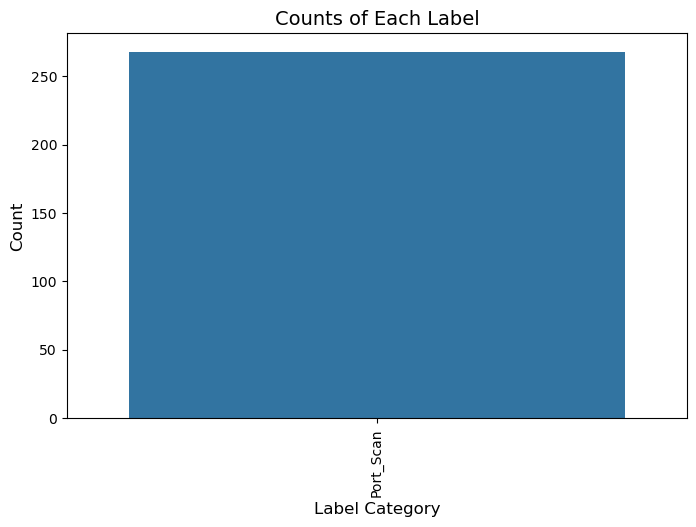

In [107]:
category_counts = data_ipplot_UDP['label'].value_counts()
plt.figure(figsize=(8, 5))
sns.barplot(x=category_counts.index, y=category_counts.values)
plt.xlabel('Label Category', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.title('Counts of Each Label', fontsize=14)
plt.xticks(fontsize=10, rotation=90)
plt.yticks(fontsize=10)
plt.show()

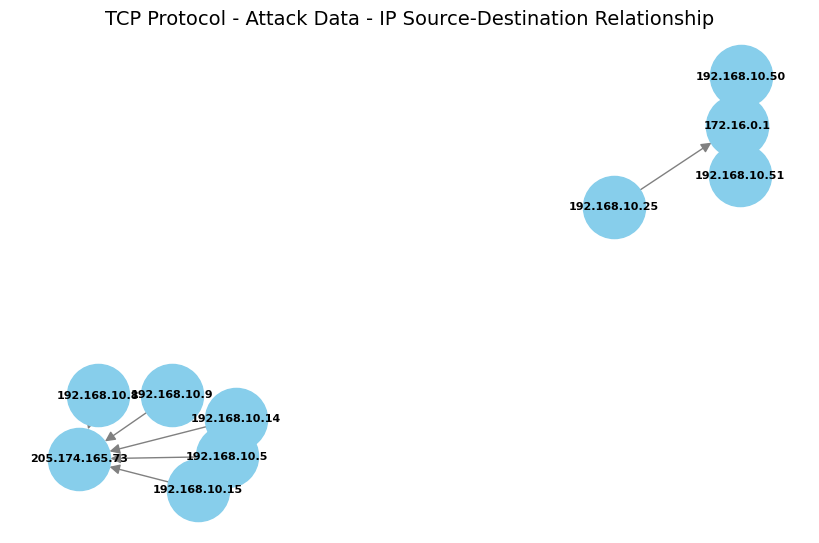

In [108]:
data_ipplot_TCP = data_attack[data_attack['protocol']=='TCP']

# Create a graph
G = nx.DiGraph()  # Directed graph (use nx.Graph() for undirected)

# Add edges (Source -> Destination)
for index, row in data_ipplot_TCP.iterrows():
    G.add_edge(row['src_ip'], row['dst_ip'])

# Draw the graph
plt.figure(figsize=(8, 5))
pos = nx.spring_layout(G)  # Position the nodes using the spring layout algorithm
nx.draw(
    G, pos, with_labels=True, node_color='skyblue', edge_color='gray', 
    node_size=2000, font_size=8, font_weight='bold', arrowsize=15
)
plt.title('TCP Protocol - Attack Data - IP Source-Destination Relationship', fontsize=14)
plt.show()

In [109]:
data_ipplot_TCP['src_ip'].value_counts()

src_ip
172.16.0.1       569962
192.168.10.50     72968
192.168.10.15      1591
192.168.10.8       1382
192.168.10.51      1204
192.168.10.9        878
192.168.10.14       859
192.168.10.5        798
192.168.10.25         5
Name: count, dtype: int64

In [110]:
data_ipplot_TCP['dst_ip'].value_counts()

dst_ip
192.168.10.50     567758
172.16.0.1         74177
205.174.165.73      5508
192.168.10.51       2204
Name: count, dtype: int64

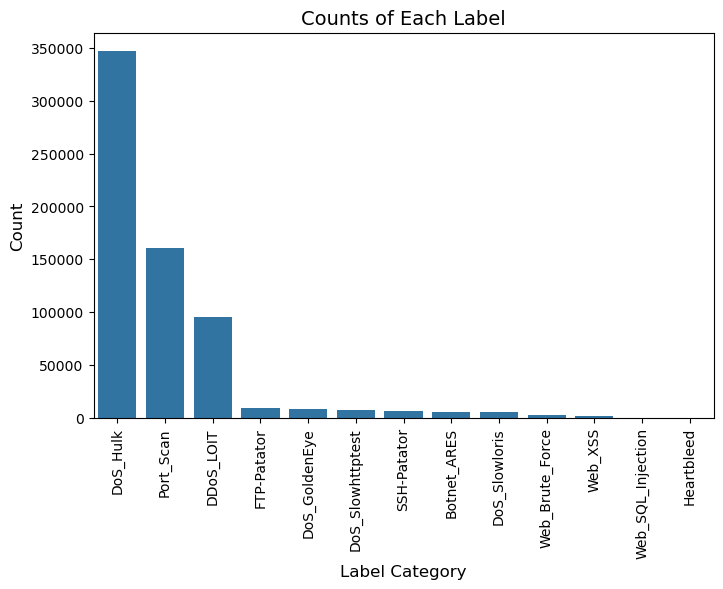

In [111]:
category_counts = data_ipplot_TCP['label'].value_counts()
plt.figure(figsize=(8, 5))
sns.barplot(x=category_counts.index, y=category_counts.values)
plt.xlabel('Label Category', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.title('Counts of Each Label', fontsize=14)
plt.xticks(fontsize=10, rotation=90)
plt.yticks(fontsize=10)
plt.show()

### Numerical Data

#### Univariate Analysis

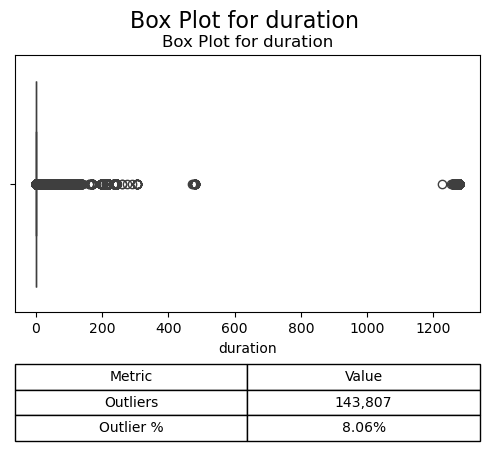

In [112]:
variable = 'duration'

# Calculate IQR and outliers for 'duration'
Q1 = data_attack[variable].quantile(0.25)
Q3 = data_attack[variable].quantile(0.75)
IQR = Q3 - Q1
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR
outliers = data_attack[(data_attack[variable] < lower_bound) | (data_attack[variable] > upper_bound)]
n_outliers = len(outliers)
outlier_percentage = (n_outliers / len(data_benign)) * 100

# Create subplots with the same layout
fig, ax = plt.subplots(1, 1, figsize=(5, 5))  # Single subplot

# Create boxplot for 'duration'
sns.boxplot(x=data_attack[variable], ax=ax)
ax.set_title(f'Box Plot for {variable}')

# Add table with outlier information
table_data = [
    ['Outliers',f'{n_outliers:,}'],
    ['Outlier %', f'{outlier_percentage:.2f}%']
]
table = ax.table(cellText=table_data, colLabels=['Metric', 'Value'], cellLoc='center',
                 loc='bottom', bbox=[0, -0.5, 1, 0.3])  # Adjust bbox for table

# Adjust layout
plt.tight_layout()
plt.suptitle(f'Box Plot for {variable}', y=1.02, fontsize=16)  # Add a title for the figure
plt.subplots_adjust(hspace=0.7)  # Add space for the table
plt.show()

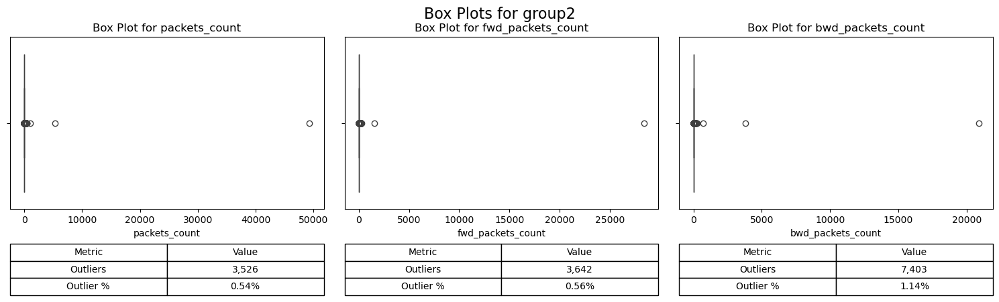

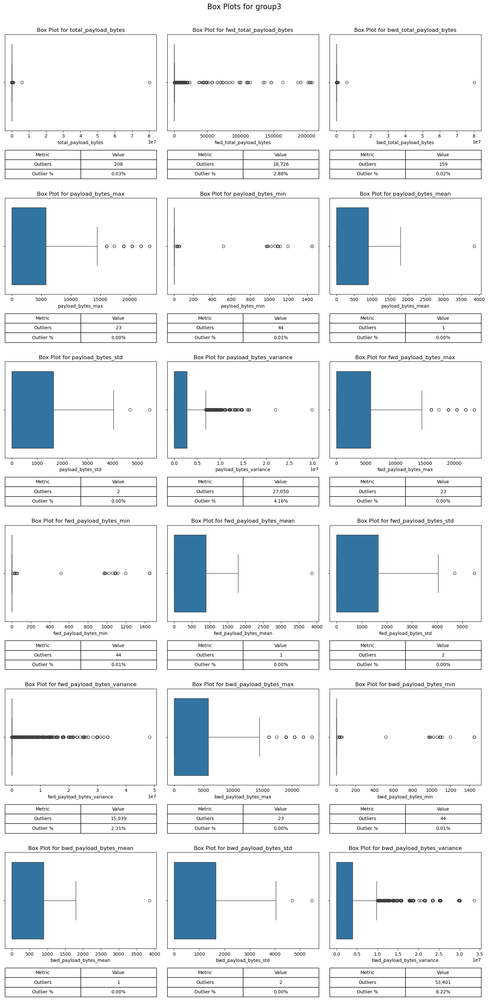

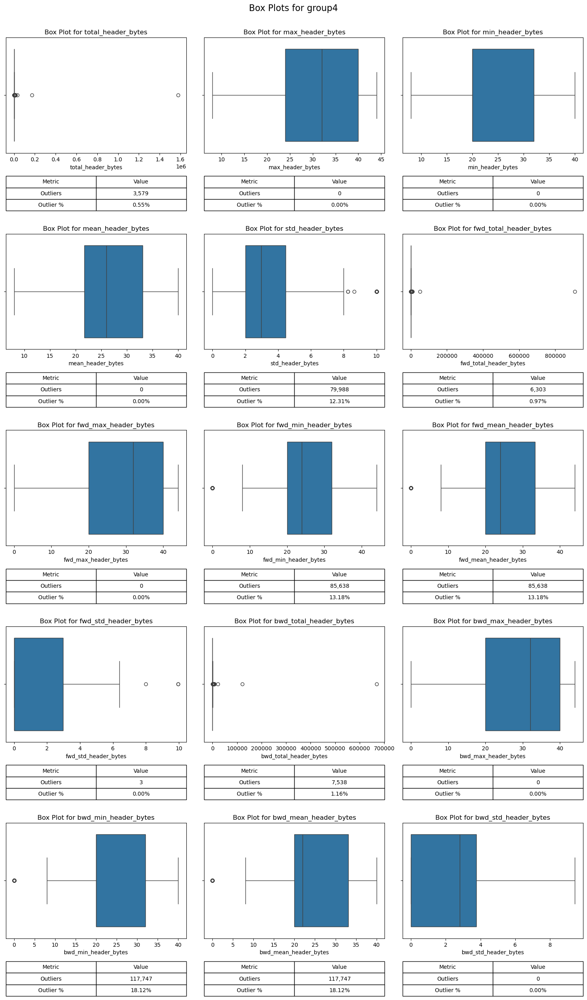

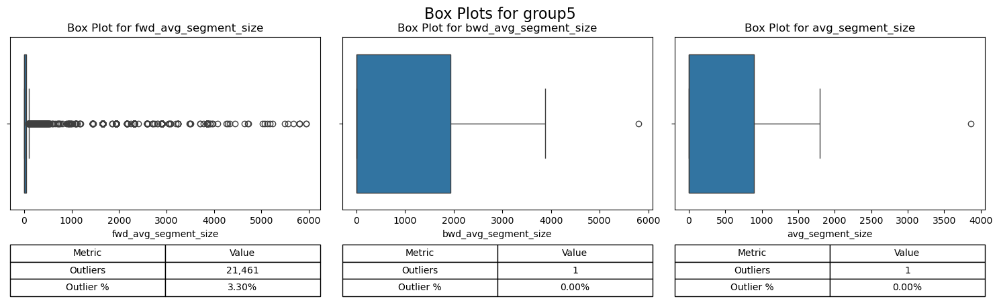

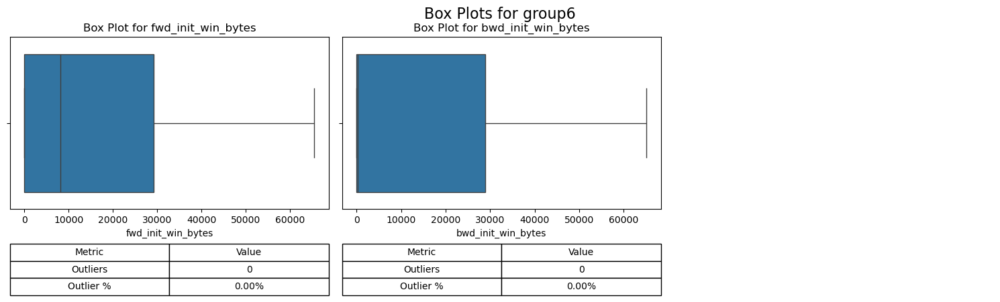

...

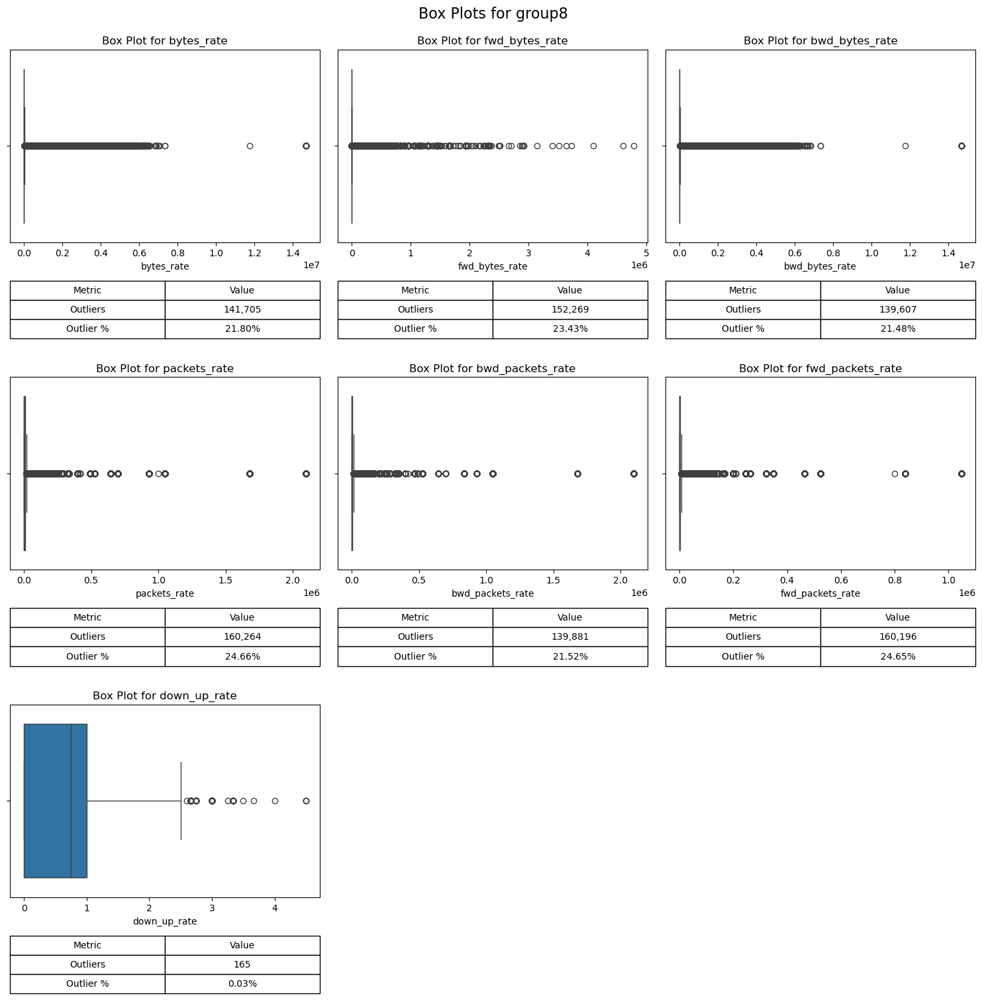

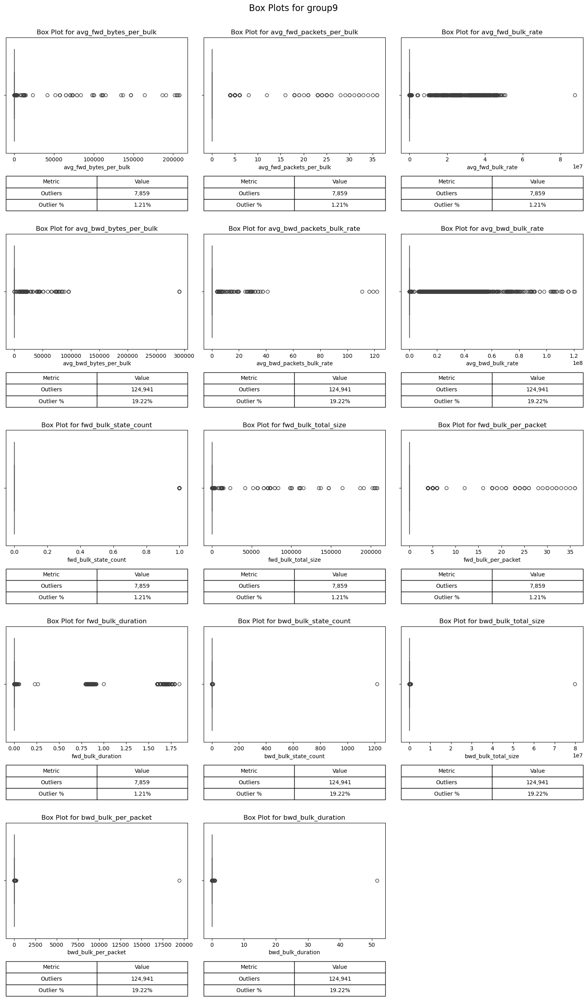

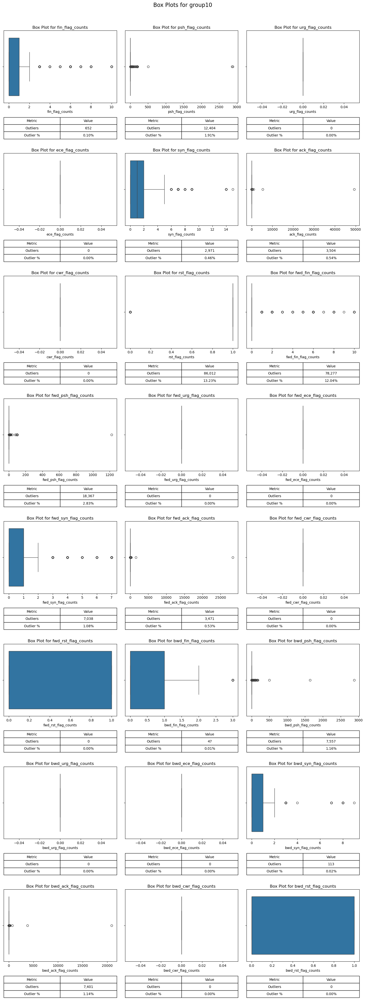

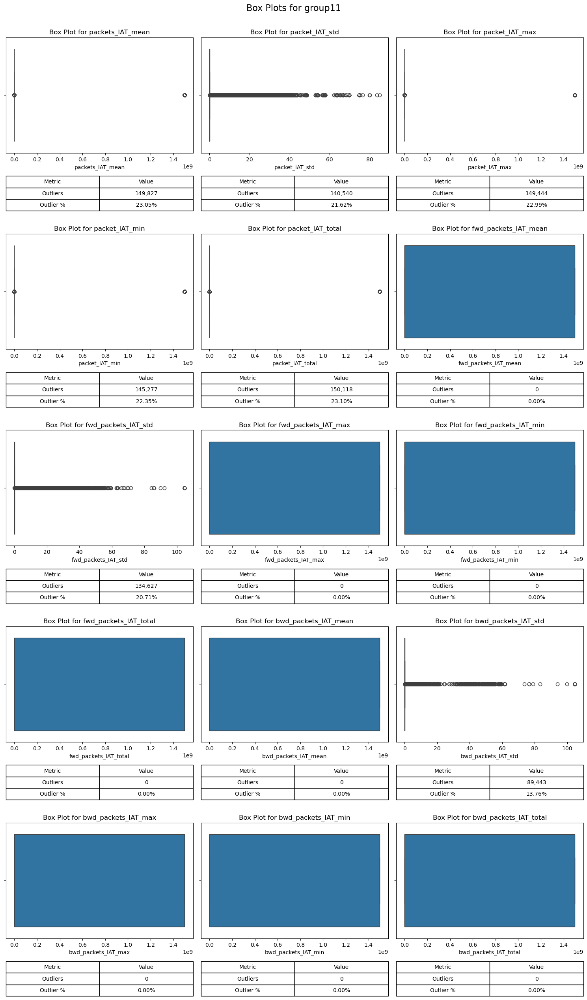

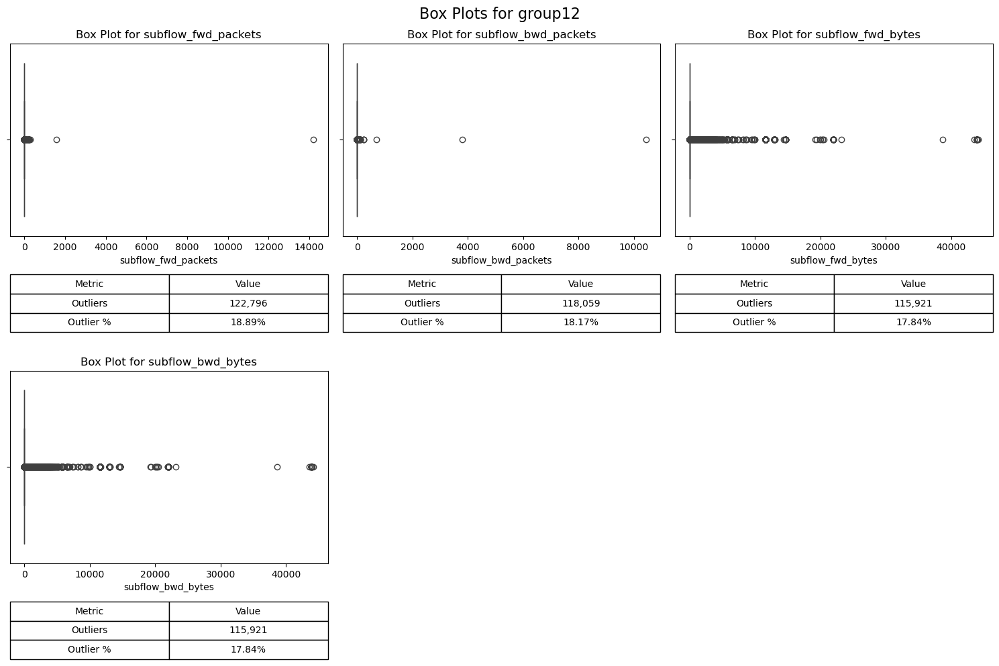

In [113]:
for group_number in range(2, 13):
    # Dynamically set the group variable (e.g., group2, group3, ..., group12)
    group_name = f"group{group_number}"  
    chosen_variables = eval(group_name).columns.tolist()  # Get the column names for the group

    # Calculate the number of rows and columns for subplots
    n_vars = len(chosen_variables)
    n_cols = 3  # Number of columns per row
    n_rows = math.ceil(n_vars / n_cols)  # Calculate rows dynamically

    # Create subplots
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(5 * n_cols, 5 * n_rows))  # Adjust figure size
    axes = axes.flatten()  # Flatten axes for easier iteration

    # Plot boxplots for each variable in the group
    for i, var in enumerate(chosen_variables):
        # Calculate IQR and outliers
        Q1 = data_attack[var].quantile(0.25)
        Q3 = data_attack[var].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        outliers = data_attack[(data_attack[var] < lower_bound) | (data_attack[var] > upper_bound)]
        n_outliers = len(outliers)
        outlier_percentage = (n_outliers / len(data_attack)) * 100

        # Create boxplot
        sns.boxplot(x=data_attack[var], ax=axes[i])  # Create the boxplot
        axes[i].set_title(f'Box Plot for {var}')  # Add title

        # Add table with outlier information
        table_data = [
            ['Outliers', f'{n_outliers:,}'],
            ['Outlier %', f'{outlier_percentage:.2f}%']
        ]
        table = axes[i].table(cellText=table_data, colLabels=['Metric', 'Value'], cellLoc='center',
                              loc='bottom', bbox=[0, -0.5, 1, 0.3])  # Position the table

    # Turn off unused subplots
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    # Adjust layout
    plt.tight_layout()
    plt.suptitle(f'Box Plots for {group_name}', y=1.02, fontsize=16)  # Add a title for the entire figure
    plt.subplots_adjust(hspace=0.7)  # Add space for tables
    plt.show()

#### Multivariable Analysis

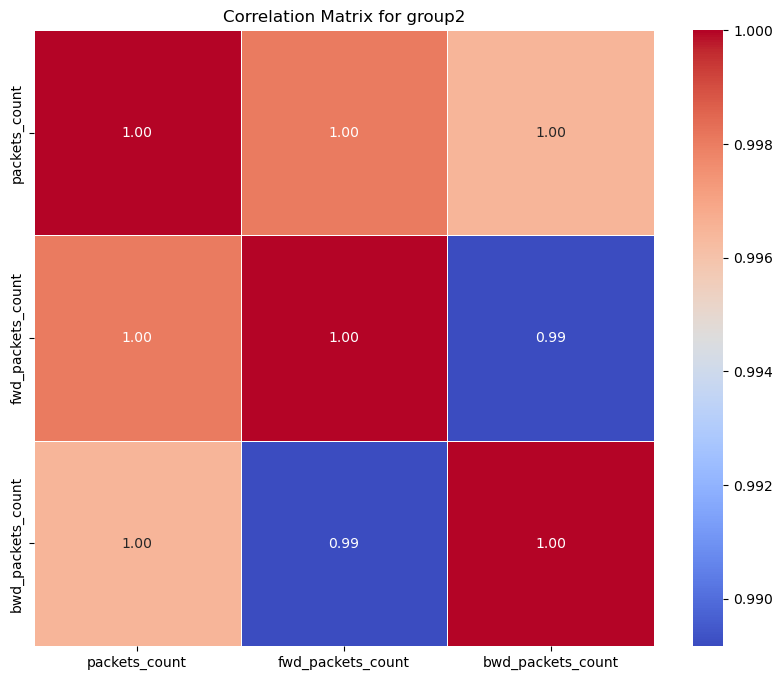

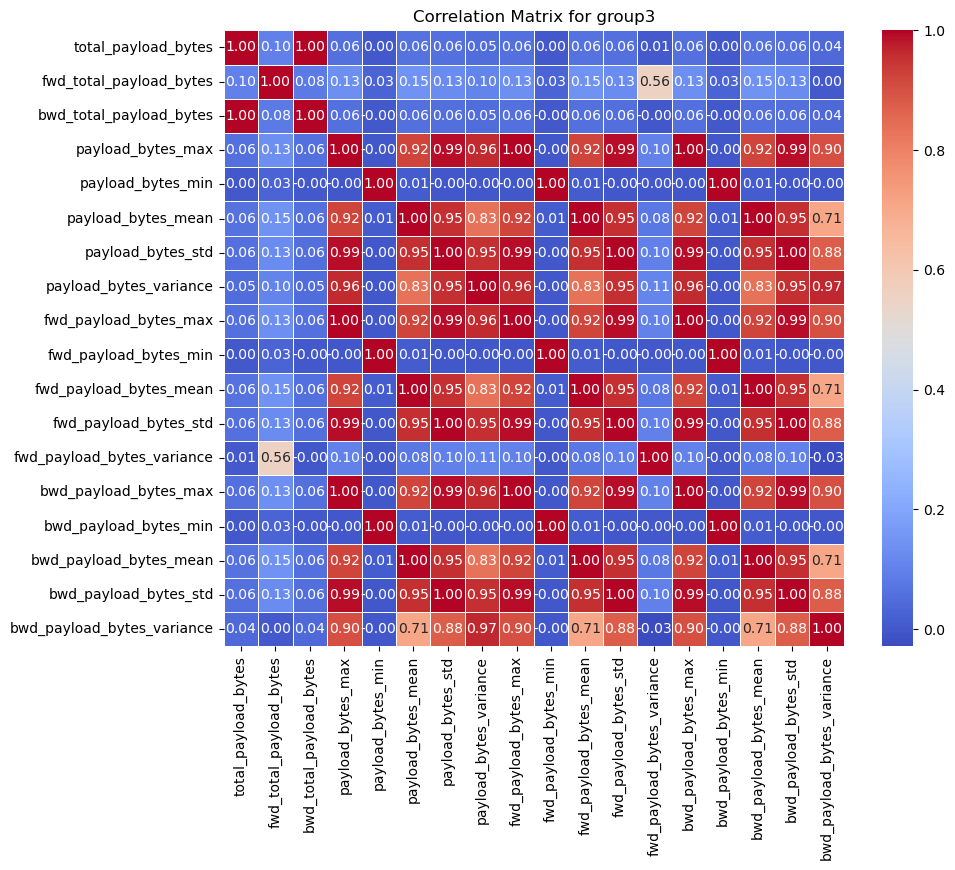

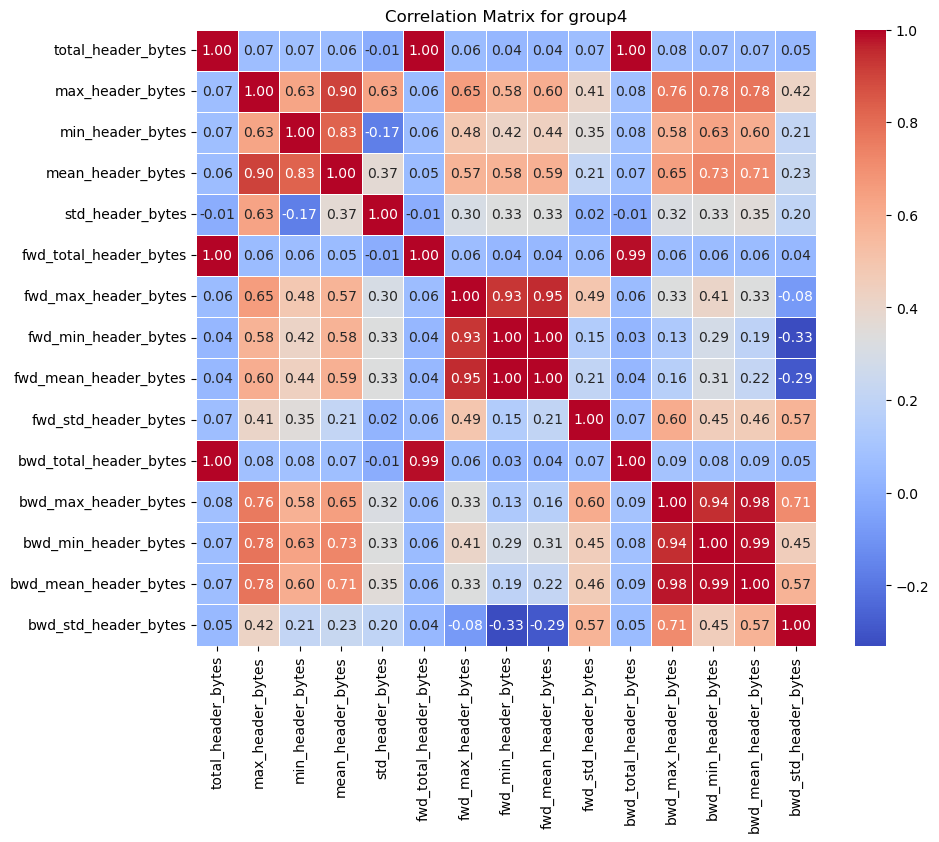

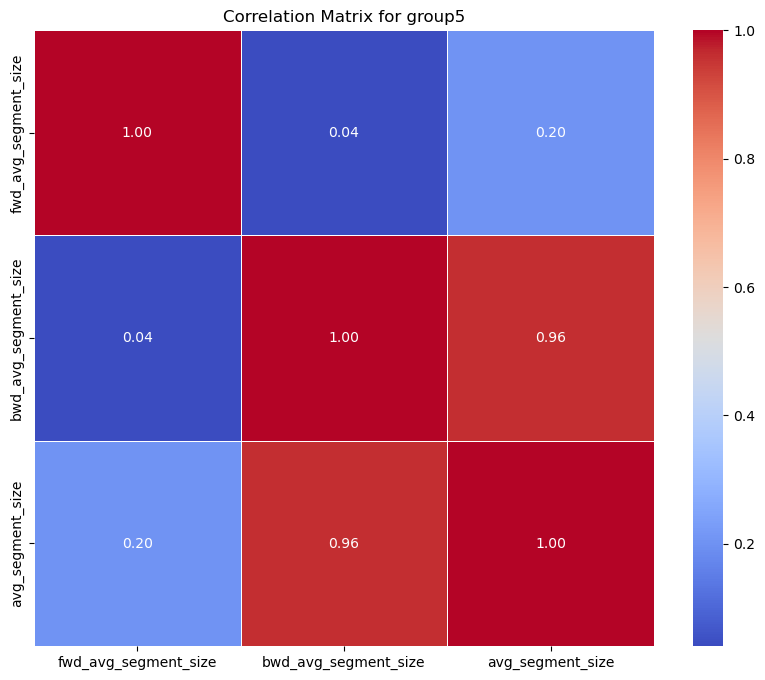

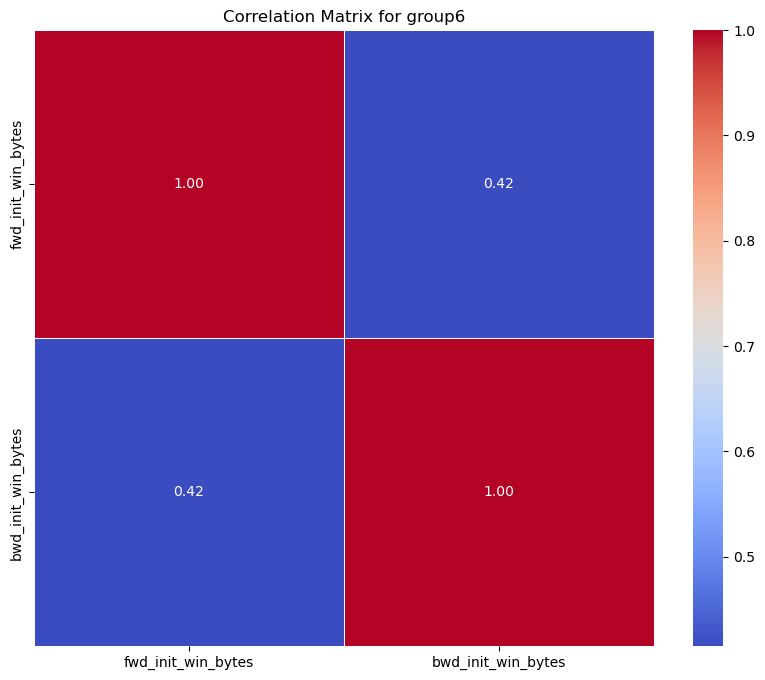

...

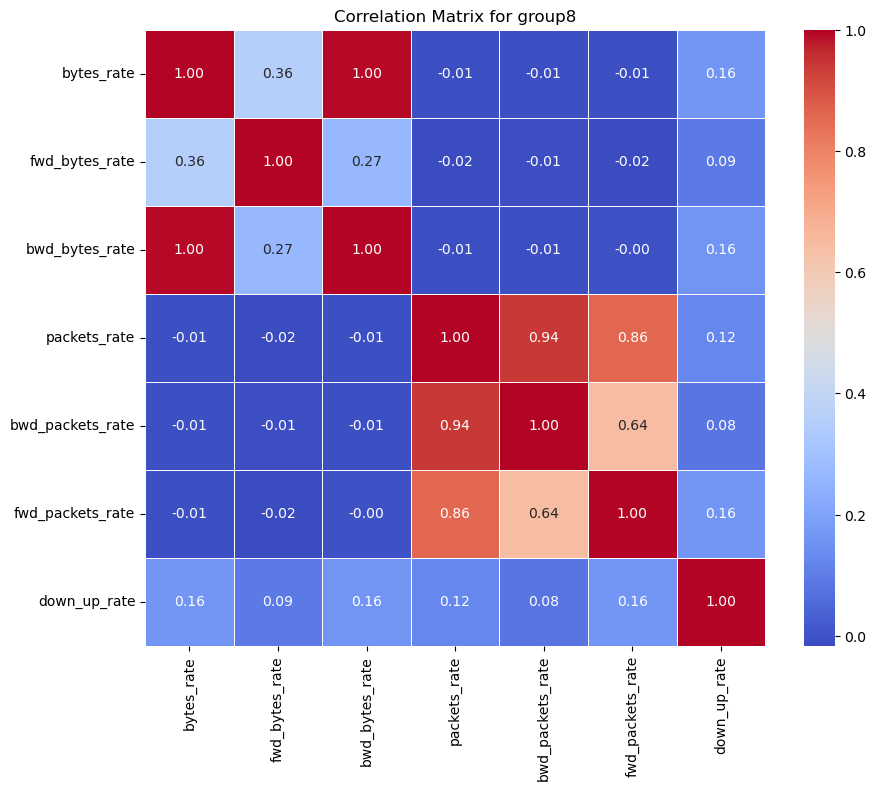

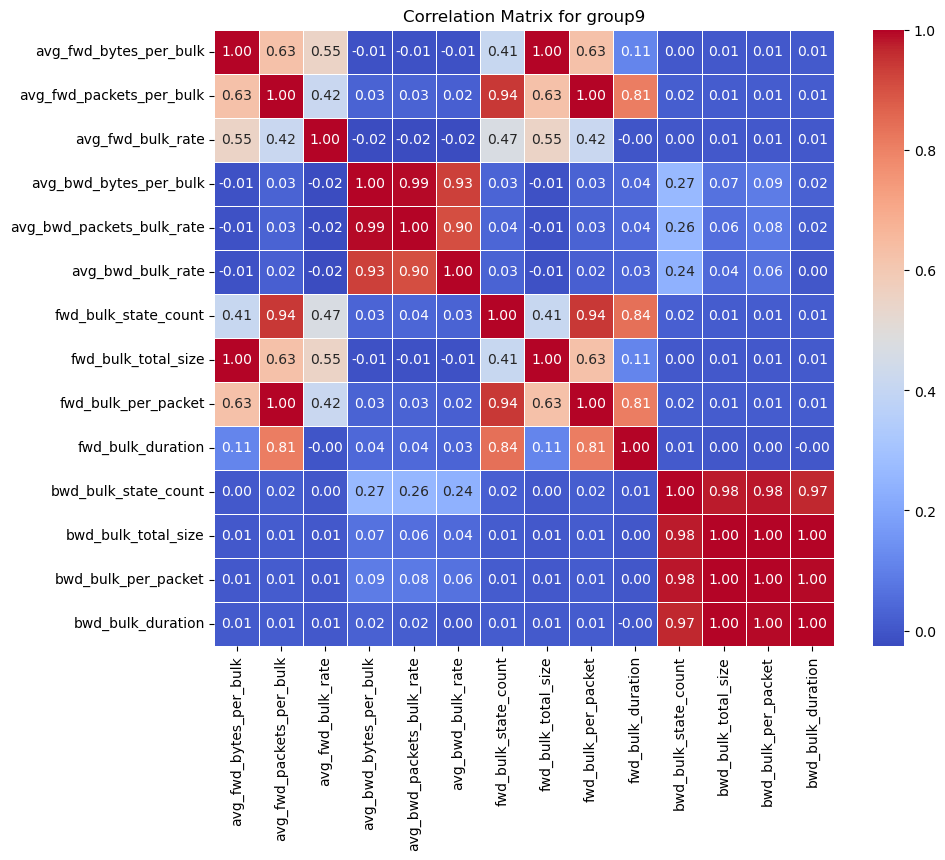

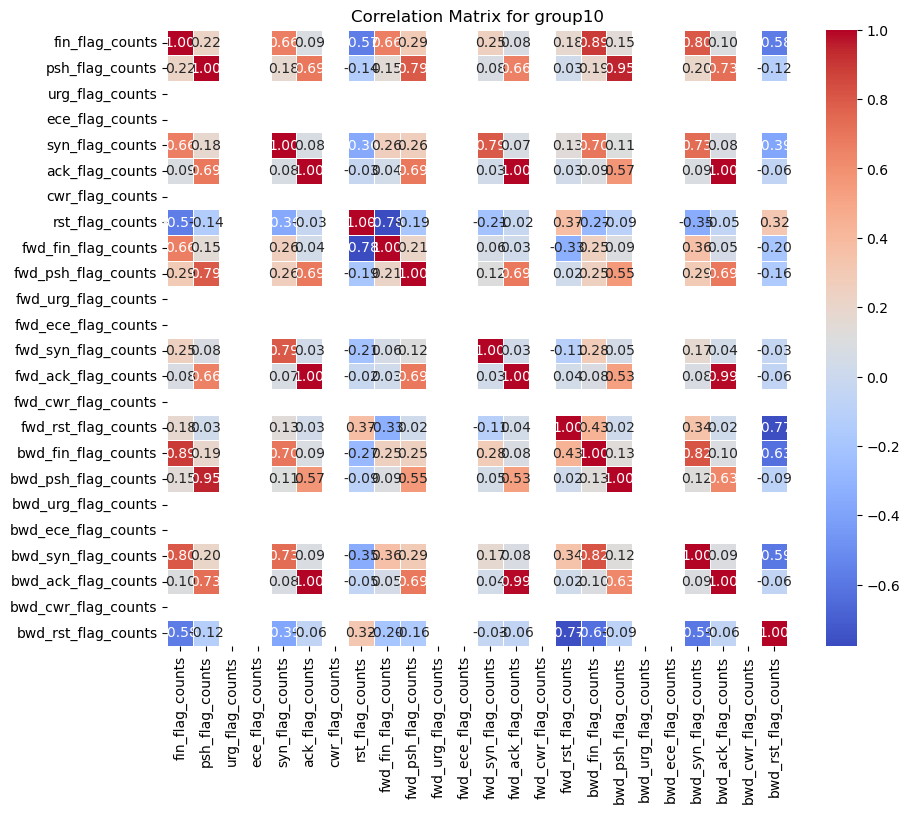

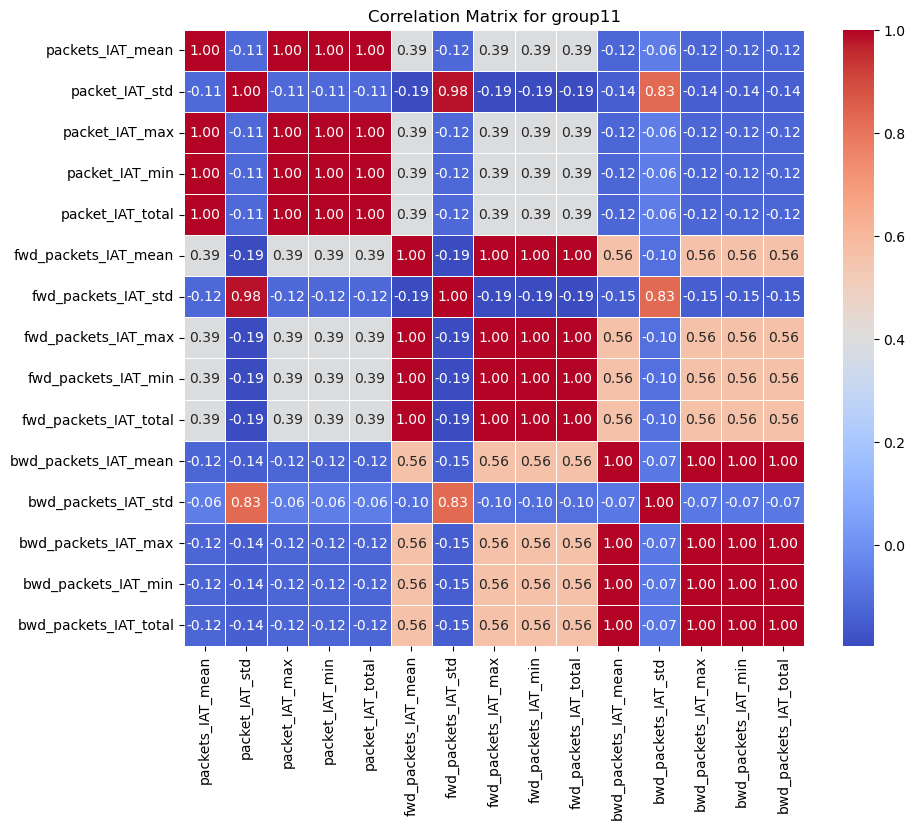

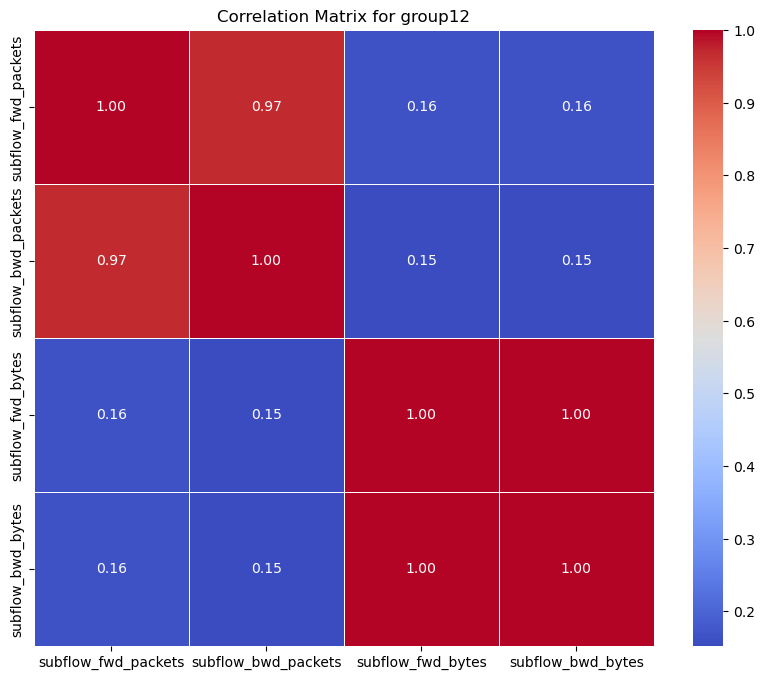

In [114]:
for group_number in range(2, 13):
    # Dynamically set the group variable (e.g., group2, group3, ..., group12)
    group_name = f"group{group_number}"  
    chosen_variables = eval(group_name).columns.tolist()  # Get the column names for the group

    # Calculate the correlation matrix for the chosen variables
    correlation_matrix = data_attack[chosen_variables].corr()

    # Create a heatmap for the correlation matrix
    plt.figure(figsize=(10, 8))
    sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
    plt.title(f'Correlation Matrix for {group_name}')
    plt.show()

#### Time Stamp

/var/folders/jx/psp7f4jd6yj35lm7000kqtph0000gn/T/ipykernel_16509/2155319620.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_attack['timestamp'] = pd.to_datetime(data_attack['timestamp'], errors='coerce')


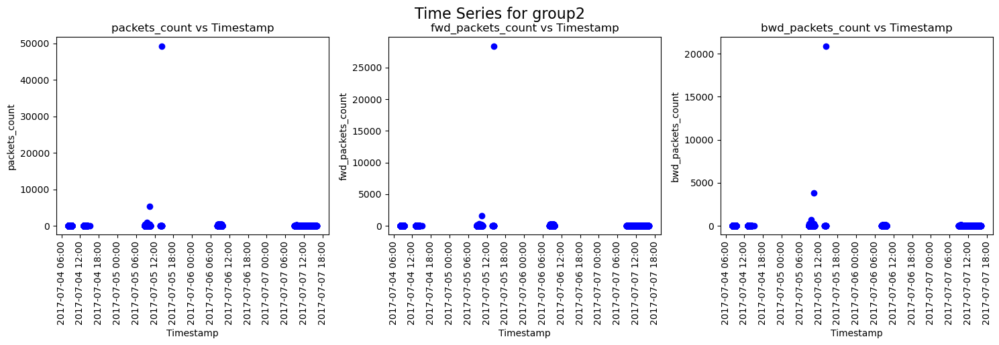

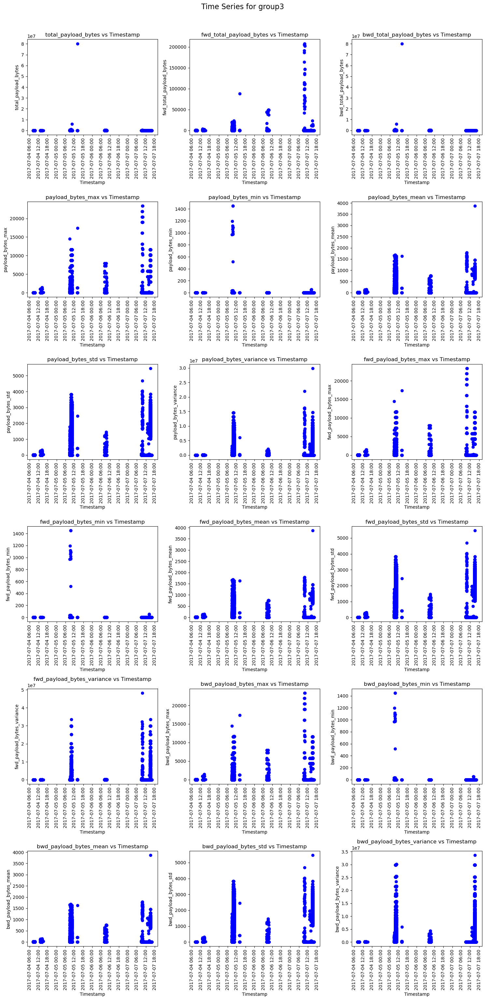

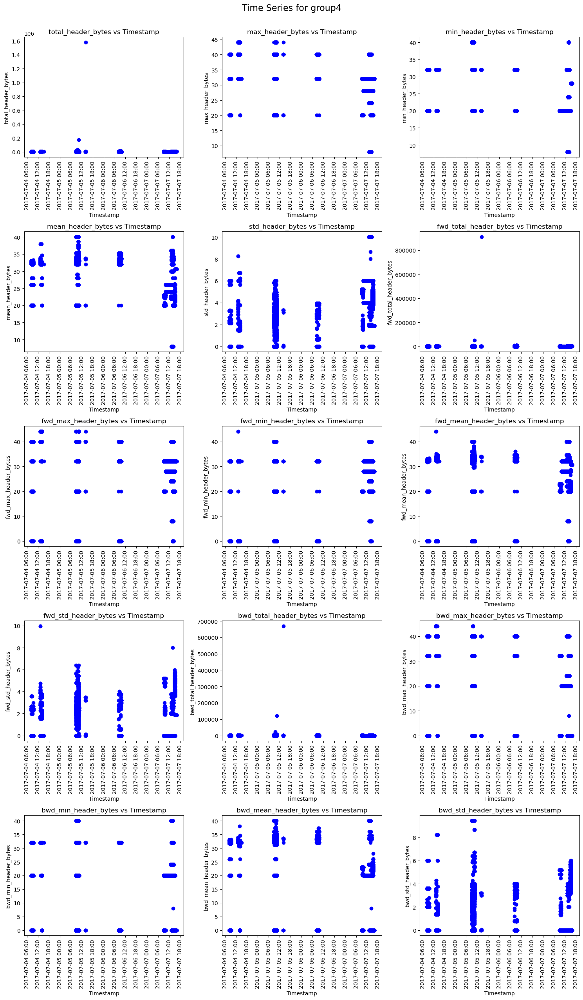

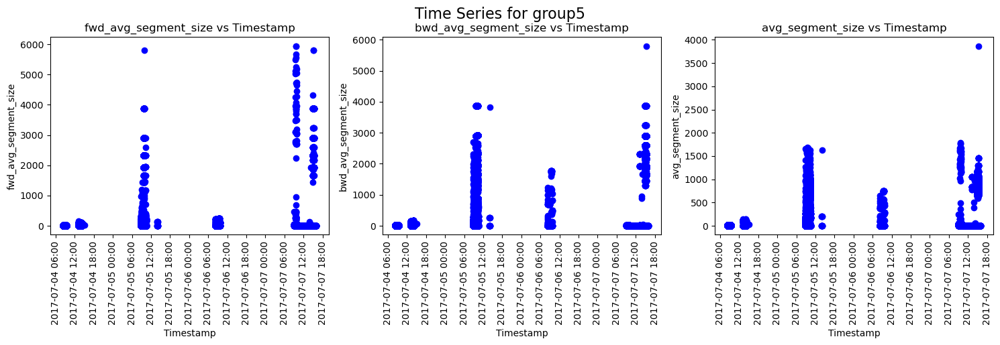

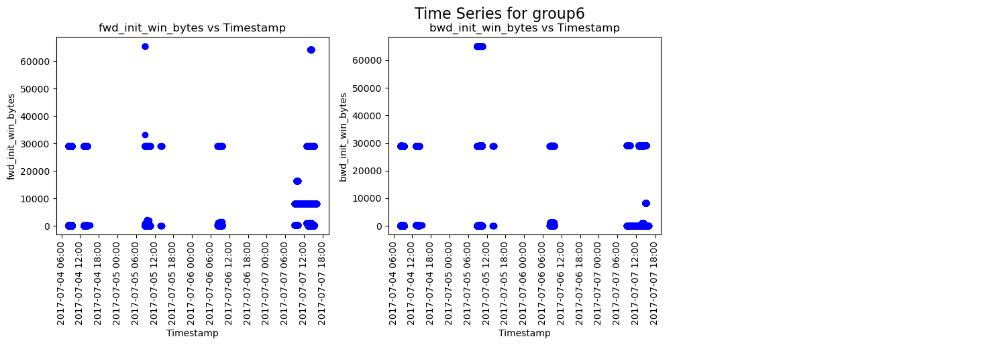

...

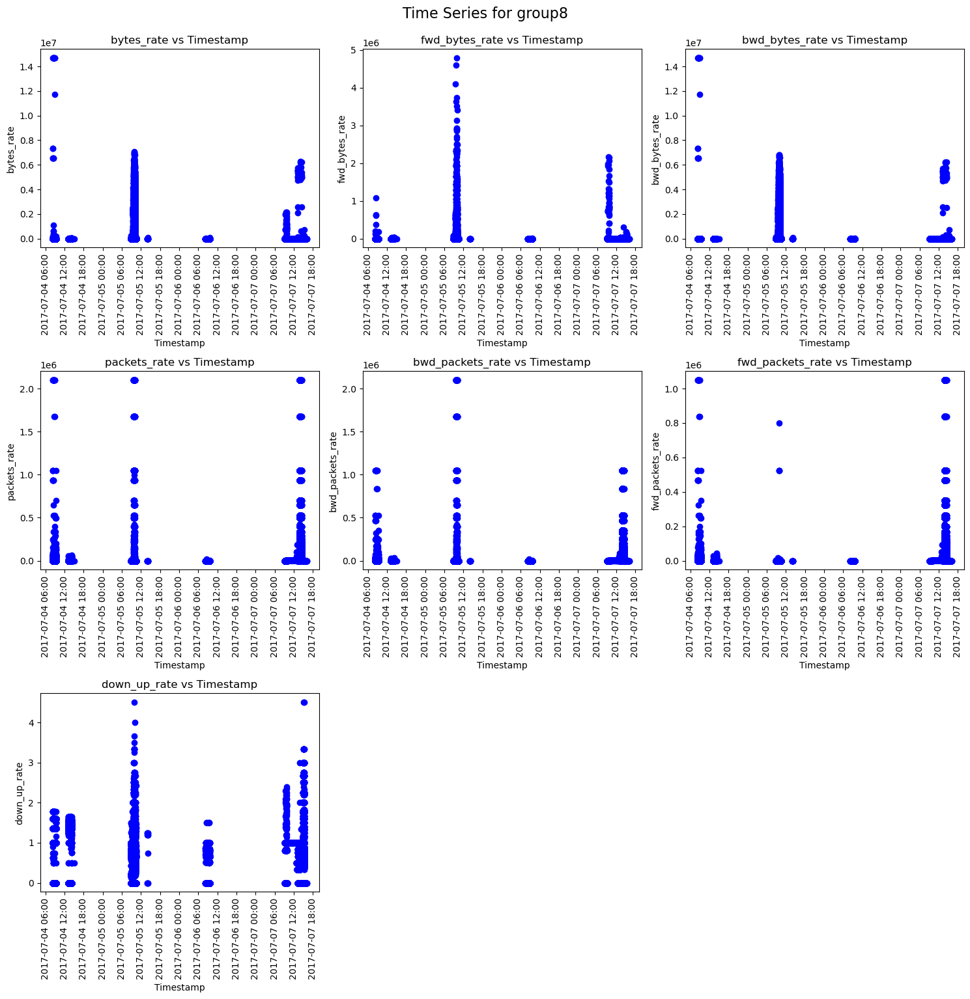

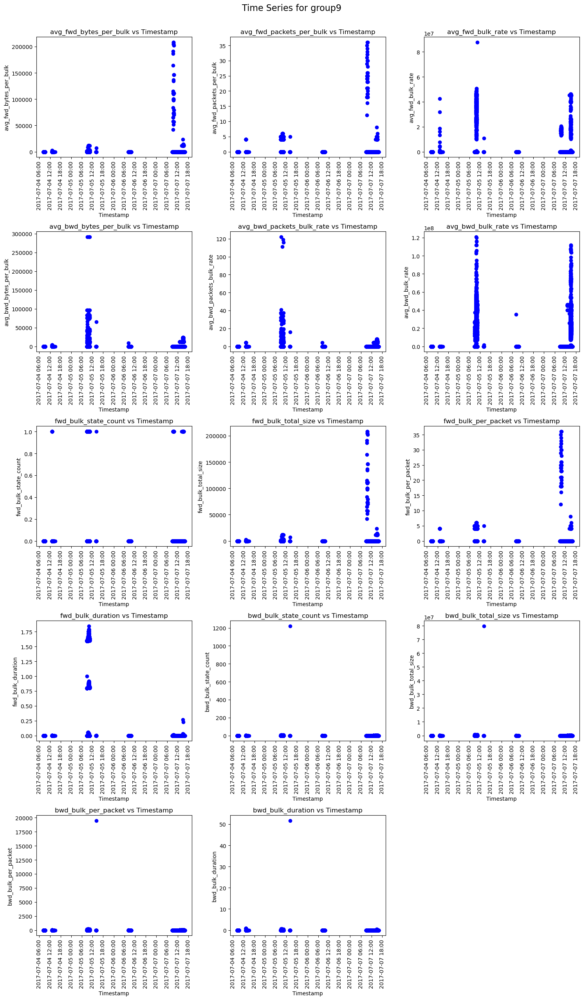

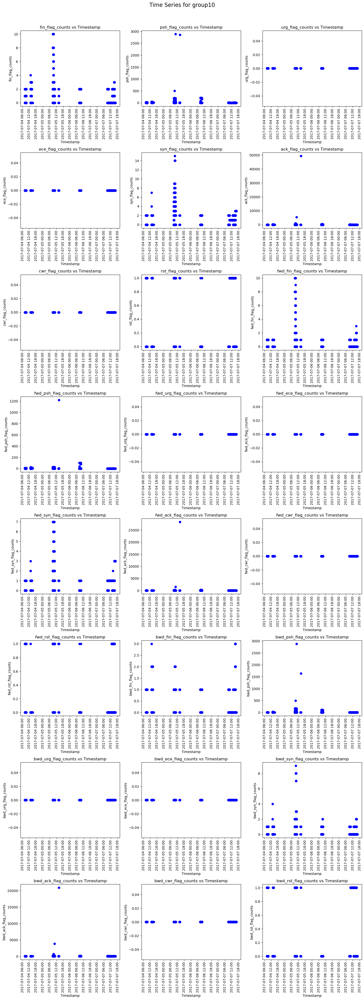

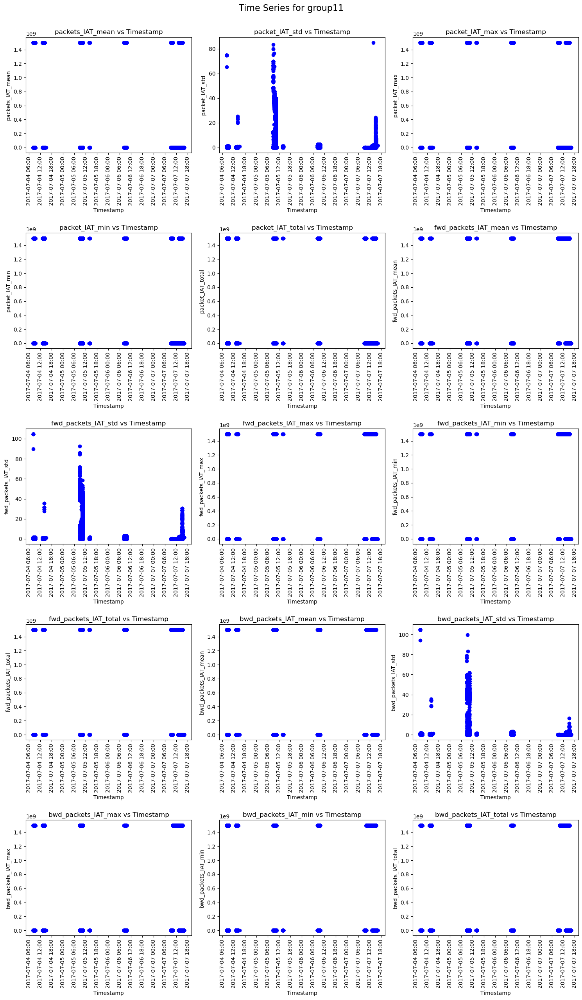

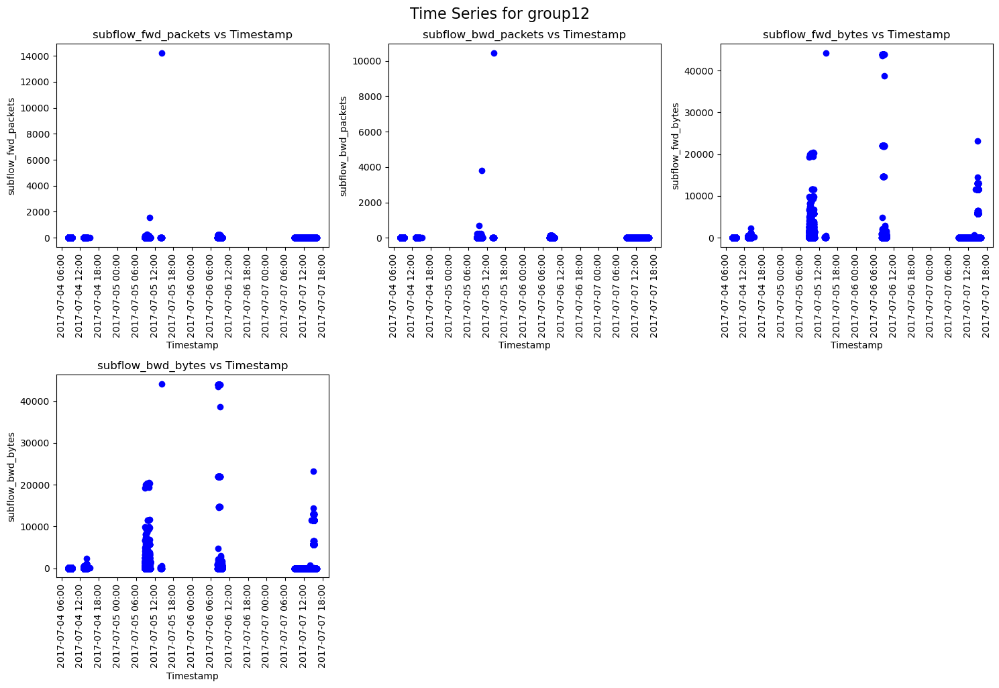

In [115]:
# Ensure the timestamp column is parsed as datetime
data_attack['timestamp'] = pd.to_datetime(data_attack['timestamp'], errors='coerce')

# Adjust the agg chunksize for large plots
mpl.rcParams['agg.path.chunksize'] = 10_000

# Iterate through the groups
for group_number in range(2, 13):  # Adjust the range based on the group numbers
    # Dynamically set the group variable (e.g., group2, group3, ..., group12)
    group_name = f"group{group_number}"  
    chosen_variables = eval(group_name).columns.tolist()  # Get the column names for the group

    # Calculate the number of rows and columns for subplots
    n_vars = len(chosen_variables)
    n_cols = 3  # You can change this based on how many columns you want
    n_rows = math.ceil(n_vars / n_cols)  # Calculate rows dynamically

    # Create subplots
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(5 * n_cols, 5 * n_rows))  # Adjust figure size
    axes = axes.flatten()  # Flatten axes for easier iteration

    # Plot time-series for each variable in the group
    for i, var in enumerate(chosen_variables):
        axes[i].plot(data_attack['timestamp'], data_attack[var], marker='o', linestyle='', color='b')
        axes[i].set_title(f'{var} vs Timestamp')  # Add title
        axes[i].set_xlabel('Timestamp')  # X-axis label
        axes[i].set_ylabel(var)  # Y-axis label
        axes[i].tick_params(axis='x', rotation=90)

        # Set x-axis locator and formatter for timestamps
        axes[i].xaxis.set_major_locator(mdates.AutoDateLocator(minticks=10, maxticks=20))  # Adjust tick frequency
        axes[i].xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d %H:%M'))  # Format datetime

    # Turn off unused subplots
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    # Adjust layout
    plt.tight_layout()
    plt.suptitle(f'Time Series for {group_name}', y=1.02, fontsize=16)  # Add a title for the entire figure
    plt.show()

## EDA Insights<a id='eda-insights'></a>

**Variables Summary**

- **flow_id**  
  * Benign Data: has 1.784 million unique values. One for each row (connection).  
  * Attack Data: has 649,915 unique values.  

- **timestamp**  
  * Benign Data: has 1.782 million unique values, the difference with flow_id counts is probably because more than one connection with different Ips were registered at the same time. The information was recorded since 6AM to 6PM from the 3 to the 7 of July in the same schedule.  
  * Attack Data: The timestamp has 619297 unique values. Attacks were registered only from the 4 to the 7 of July.  

- **src_ip / dst_ip.**  
  * Benign Data: There are 11,965 unique src_ip and 18,090 unique dst_ip  
  * Attack Data: There are 9 unique src_ip and 4 unique dst_ip.  

- **Protocol**  
  * Benign Data: The protocol variable has only 2 levels, TCP and UDP. TCP with 965,209 unique values and UDP with 819,745, a relationship of 54% to 46%.  
  * Attack Data: TCP has 649,647 unique values and UDP has 268, a relationship of 99.96% to 0.04%, which means that the observations are mainly TCP. The 268 rows correspond to only one kind of attack: Port_Scan. The TCP observations have all 13 types of attack including Port_Scan.  

- **connections**  
  * Benign Data: There are 88,305 unique connections (src_ip + dst_ip) for TCP and 1,228 for UDP a relationship 98.6% to 1.4%. This does not make UDP insignificant, this represent that more ip’s participate in the TCP protocol.  
  * Attack Data: There are 10 unique connections (src_ip + dst_ip) for TCP and 1 for UDP a relationship 91% to 9%.  

- **Duration**  
  * Benign Data: there are 407 thousand outliers, 22.86% of the benign data. The five days have picks beyond the 25000 microseconds.  
  * Attack Data: there are 143 thousand outliers, 8.06% of the attack data. The only day with picks over the 600 microseconds was July-5th.  

- **Group 2 Packet count**  
  * Benign Data: All features are 100% correlated. The packet_count is the sum of fwd_packet and bwd_packet. The outliers for the packet count are 288,803 a 16% of the data.  
  * Attack Data: The outliers for the packet count are 3,526 a 0,54%% of the data, and is highly correlated to the other two.  

- **Group 3 Payload_Bytes**  
  * Benign Data: the total_payload_bytes is the sum of the forward and backward.  The mean_payload_byte is the one with the least outliers, 177,121 which represent a 9.92%, and is highly correlated to the mean_payload for fwd and bwd.  
  * Attack Data: The mean_payload_byte is 0, and is highly correlated to the mean_payload for fwd and bwd.  

- **Group 4 Header_bytes**  
  * Benign Data: The total header is the sum of fwd and bwd. Mean_header_bytes has 0 outliers and is highly correlated to fwd and bwd means.  
  * Attack Data: Mean_header_bytes has 0 outliers and has a normal distribution. It is correlated to fwd and bwd means.  

- **Group 5 Average_segment_size**  
  * Benign Data: The average segment size is the one most correlated to fwd and bwd and has 177,121 outliers, 16% of the data.  
  * Attack Data: Average segment size is correlated to bwd, and has 1 outlier, while is not the case to the fwd.  

- **Group 6 Init window**  
  * Benign Data: Both fwd and bwd have a correlation of 0.55 and have outliers of 15% and 20.49% respectively.  
  * Attack Data: Both fwd and bwd have a correlation of 0.42 and have no outliers.  

- **Group 7 Active Idle information**  
  * Benign Data: Active_mean and Idle_mean are the most correlated to its correspondent max and min variables. Both have similar number of outliers: 49,062 and 2.75%.  
  * Attack Data: Active_mean and Idle_mean are the most correlated to its correspondent max and min variables. Both have similar number of outliers: 1966 and 0.30%.  

- **Group 8 Rates**  
  * Benign Data: Down_up rate is the feature with the least outliers, only 0.19%, nevertheless is not correlated to any of the other variables. Packet rate is correlated to fwd and bwd rate.  
  * Attack Data: Down_up rate is the feature with the least outliers, only 0.03%, nevertheless is not correlated to any of the other variables. Packet rate is correlated to fwd and bwd rate.  

- **Group 9 Bulk**  
  * Benign Data: All the data related to fwd has 69,943 outliers which represent 3.92%. All the data related to bwd has 135.966 outliers with 7.62%.  Bwd_bulk_per_packet is correlated to bwd bulk duration and total size. While fwd_bulk_per_packet is correlated just to bulk duration.  
  * Attack Data: All the data related to fwd has 7,859 outliers which represent 1.21%. All the data related to bwd has 124,941 outliers with 19.22%. Bwd_bulk_per_packet is correlated to bwd bulk duration and total size. While fwd_bulk_per_packet is correlated just to bulk duration and bulk_state_count.  

- **Group 10 Flags**  
  * Benign Data: There are 8 kind of flags, each has the distribution of the fwd and bwd, which increase the number of feature in this group to 24. There are no urg flags. Each flag is correlated to their corresponding fwd and bwd. The greatest number of flags with outliers are: rst with 12.80%, ack with 21.05% and psh with 23.89%.  
  * Attack Data: There are no urg, ece, and cwr flags. Each flag is correlated to their corresponding fwd and bwd. The greatest number of flags with outliers are: rst with 13.23%, fwd_fin_flag with 12.04%.  

- **Group 11 IAT**  
  * Benign Data: The IAT is distributed among fwd and bwd and each has max, min, mean, sd and total. The packet_IAT_total take the highest value between fwd_packets and bwd_packets. And each is correlated to each of its similar variables. fwd_packet _IAT has 0 outliers while bwd_packet_IAT has 368,837 20.6%.  
  * Attack Data: Each variable, total, fwd, bwd is correlated to its similar variables, ex: min, max, mean. fwd_packet _IAT_total and bwd_packet_IAT_total have 0 outliers.  

- **Group 12 Subflow Packets**  
  * Benign Data: The subflow has fwd and bwd measure in packets and bytes, each related to each other. The measurement in bytes has the least outliers, around 352,526 19.75%  
  * Attack Data: The subflow has fwd and bwd measure in packets and bytes, each related to each other. The measurement in bytes has the least outliers, around 115,921, corresponding to 17.84% of the data  

## Considerations for Modeling<a id='considerations-for-modeling'></a>

*   Cyber attack information has limited information in the UDP protocol, so perhaps for the model I can only consider TCP protocol in the benign data. This would reduce the data by almost half, which is not the worst case scenario considering that initially the proportion of benign and attack was 73% - 27%.

*   During the EDA surged some information important for the execution of the model and further analysis:
    
    *   There was not an attack on July 3, 2017, but an attack was observed in each of the other days.

    *   There is a difference in the distribution for segment size between the benign and attack data. In the attack data the fwd_avg_segment size has a great number of outliers, while the backward and total have only 1.

    *   There is a change in the pattern of flags between the benign and attack data. The fwd_fin_flag has one of the biggest number of outliers.

    *   In the attack data there are no outliers for the fwd_packet _IAT_total and bwd_packet_IAT_total features, which differs from the benign data.

*   Based on the EDA, the following features can be prioritized for the model:

    *   Group1: src_ip, dst_ip, label, time_stamp, protocol, duration. (discarded the port number as the protocol assign numbers randomly among a certain range)
    
    *   Group2: packets_count
    
    *   Groups3: payload_mean
    
    *   Group4: mean_header_byte
    
    *   Group5: average_segment_size
    
    *   Group6: fwd and bwd init_win_bytes.
    
    *   Group7: Active_mean and Idle_mean.
    
    *   Group8: Packet Rate.
    
    *   Group9: Bwd_bulk_per_packet and Fwd_bulk_per_packet
    
    *   Group10: rst_flag, fin_flag, ack_flag, psh_flag.
    
    *   Group11: fwd_packet _IAT, bwd_packet_IAT
    
    *   Group12: subflow_bwd_bytes, subflow_fwd_bytes

# Modeling

## Modeling Scope <a id='modeling-scope'></a>

1.  Based on the knowledge obtained in the EDA, a pre processing stage of the data will focus on: 
    
    * The distribution of the variable Protocol.
    * The multicollinearity found in the data through the VIF score.

2.  Feature selection (FS) algorithms will be used to reduce the number of variables.
    
    * The algorithms used will be Chi-Square, Anova, Mutual Information, and Random Forrest.
    * The threshols to drop 20%, 40% and 60% of features will be used to compare the FS.

3.  A ramdom forrest classifier will be used to predict the probability of a ciber attacks in the data. The variable Label will be encoded into the variable Class with only two levels: benign and attack. The classifier will be fitted with:
    
    * All the data set to obtain a base line result.
    * The data set resulted from the FS algorithms.
    * The PCA components to evaluate the accuracy of feature extraction.


## Data pre-processing<a id='data-pre-processing'></a>

In [116]:
data = data17_clean # Final cleaned data set

### Protocol Analysis

*   During the EDA was identified a difference in the amount of observations in the protocol class. In this section I will explore that difference specially between the benign and attack data.

*   This analysis is important as there are technical differences between TCP and UDP, so the attacks might also be different for the two protocols.

*   Depending on this analysis it will be decided wether to separate the data or not.

In [117]:
data['label'].value_counts()

label
Benign               1295298
DoS_Hulk              205329
Port_Scan             159018
DDoS_LOIT              89477
DoS_GoldenEye           6962
FTP-Patator             6395
Botnet_ARES             4765
DoS_Slowhttptest        4078
DoS_Slowloris           3896
SSH-Patator             2992
Web_Brute_Force         1368
Web_XSS                  679
Web_SQL_Injection         13
Heartbleed                 6
Name: count, dtype: int64

*   I will group the cyberattack categories in only one categoy "attack" which simplify the analysis and satisifies the objective of detecting an intrusion.

In [118]:
data['Class'] = data['label'].apply(lambda x: 'Attack' if x != 'Benign' else x)

/var/folders/jx/psp7f4jd6yj35lm7000kqtph0000gn/T/ipykernel_16509/2866599548.py:1: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data['Class'] = data['label'].apply(lambda x: 'Attack' if x != 'Benign' else x)
/var/folders/jx/psp7f4jd6yj35lm7000kqtph0000gn/T/ipykernel_16509/2866599548.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['Class'] = data['label'].apply(lambda x: 'Attack' if x != 'Benign' else x)


In [119]:
data['Class'].value_counts()

Class
Benign    1295298
Attack     484978
Name: count, dtype: int64

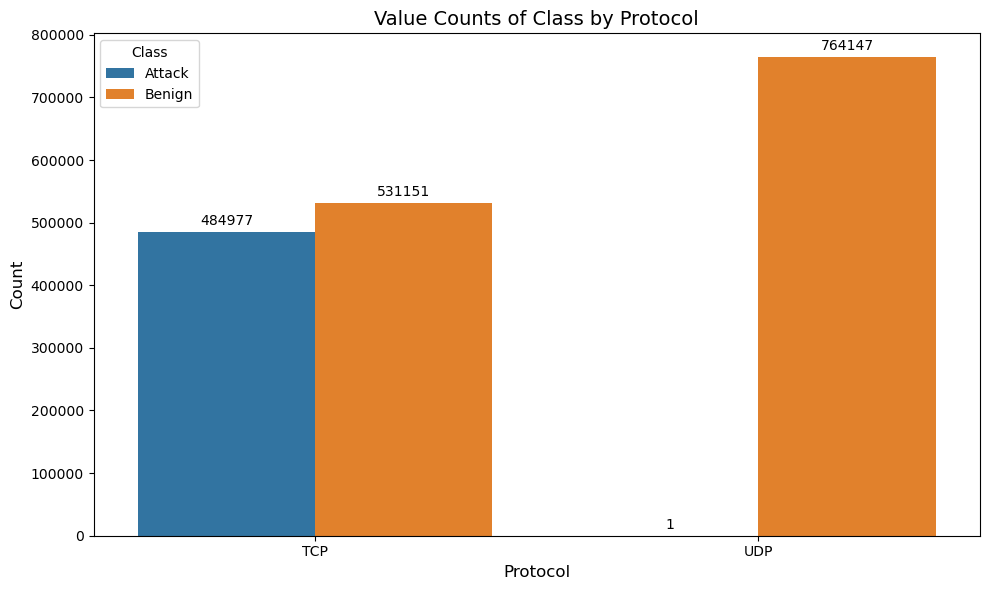

In [120]:
counts = data.groupby(['protocol', 'Class']).size().reset_index(name='counts')

# Plot the data
plt.figure(figsize=(10, 6))
ax = sns.barplot(x='protocol', y='counts', hue='Class', data=counts)

for container in ax.containers:
    ax.bar_label(container, fmt='%d', label_type='edge', fontsize=10, padding=3)

# Customize the plot
plt.title('Value Counts of Class by Protocol', fontsize=14)
plt.xlabel('Protocol', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.legend(title='Class', fontsize=10)
plt.tight_layout()
plt.show()

In [121]:
counts['percentage'] = counts.groupby('protocol')['counts'].transform(lambda x: (x / x.sum()) * 100)

# Format the percentage for display
counts['percentage'] = counts['percentage'].round(2)
counts

,protocol,Class,counts,percentage
0,TCP,Attack,484977,47.73
1,TCP,Benign,531151,52.27
2,UDP,Attack,1,0.00
3,UDP,Benign,764147,100.00


*   There is only 1 row in the attack group for UDP protocol, so there is no point in using it to train the model to detect attacks in the UDP protocol, so only TCP data will be considered. 

*   As only TCP data will be considered, there will be no differentiation between the kind of attacks, so all of them will be grouped in the 'attack' category in the 'Class' variable.

*   Dropping the UDP data left a more balance data between benign and attack, 52% to 47% and 1,016,128 observations.

In [122]:
data_TCP = data[data['protocol']=='TCP']
data_TCP.info()
len(data_TCP)

<class 'pandas.core.frame.DataFrame'>
Index: 1016128 entries, 0 to 2434848
Columns: 123 entries, flow_id to Class
dtypes: float32(31), float64(30), int16(10), int32(18), int64(3), int8(24), object(7)
memory usage: 550.4+ MB


1016128

### Multicollinearity Analysis

*   I will perform a multicollinearity analysis through similar variables which I grouped in 12 groups based on their name. The purpose of this analysis is to identify the level of relationship among the variables; similar to what was done in the EDA.

In [123]:
substring = 'packets_count'
group1 = [col for col in data.columns if substring in col.lower()] 

group1 = data_TCP[group1]

df_VIF = group1
vif = pd.DataFrame()
vif["feature"] = df_VIF.columns
vif["VIF"] = [variance_inflation_factor(df_VIF.values, i) for i in range(df_VIF.shape[1])]
display(vif)

/opt/anaconda3/envs/LabMacEnviroment/lib/python3.10/site-packages/statsmodels/stats/outliers_influence.py:197: RuntimeWarning: divide by zero encountered in scalar divide
  vif = 1. / (1. - r_squared_i)


,feature,VIF
0,packets_count,inf
1,fwd_packets_count,inf
2,bwd_packets_count,inf


In [124]:
substring = 'payload_bytes'
group2 = [col for col in data.columns if substring in col.lower()] 

group2 = data_TCP[group2]

df_VIF = group2
vif = pd.DataFrame()
vif["feature"] = df_VIF.columns
vif["VIF"] = [variance_inflation_factor(df_VIF.values, i) for i in range(df_VIF.shape[1])]
vif["VIF"] = vif["VIF"].round(2).sort_values(ascending=False)
display(vif)

/opt/anaconda3/envs/LabMacEnviroment/lib/python3.10/site-packages/statsmodels/stats/outliers_influence.py:197: RuntimeWarning: divide by zero encountered in scalar divide
  vif = 1. / (1. - r_squared_i)


,feature,VIF
0,total_payload_bytes,inf
1,fwd_total_payload_bytes,inf
2,bwd_total_payload_bytes,inf
3,payload_bytes_max,8.619329e+12
4,payload_bytes_min,inf
5,payload_bytes_mean,8.918019e+13
6,payload_bytes_std,8.188363e+14
7,payload_bytes_variance,9.163000e+01
8,fwd_payload_bytes_max,1.286743e+15
9,fwd_payload_bytes_min,inf


In [125]:
substring = 'header_bytes'
group3 = [col for col in data.columns if substring in col.lower()] 

group3 = data_TCP[group3]

df_VIF = group3
vif = pd.DataFrame()
vif["feature"] = df_VIF.columns
vif["VIF"] = [variance_inflation_factor(df_VIF.values, i) for i in range(df_VIF.shape[1])]
vif["VIF"] = vif["VIF"].round(2).sort_values(ascending=False)
display(vif)

/opt/anaconda3/envs/LabMacEnviroment/lib/python3.10/site-packages/statsmodels/stats/outliers_influence.py:197: RuntimeWarning: divide by zero encountered in scalar divide
  vif = 1. / (1. - r_squared_i)


,feature,VIF
0,total_header_bytes,inf
1,max_header_bytes,1097.57
2,min_header_bytes,1574.04
3,mean_header_bytes,2604.61
4,std_header_bytes,80.29
5,fwd_total_header_bytes,inf
6,fwd_max_header_bytes,805.44
7,fwd_min_header_bytes,2708.04
8,fwd_mean_header_bytes,3271.84
9,fwd_std_header_bytes,38.92


In [127]:
substring = 'segment_size'
group4 = [col for col in data.columns if substring in col.lower()] 

group4 = data_TCP[group4]

df_VIF = group4
vif = pd.DataFrame()
vif["feature"] = df_VIF.columns
vif["VIF"] = [variance_inflation_factor(df_VIF.values, i) for i in range(df_VIF.shape[1])]
vif["VIF"] = vif["VIF"].round(2).sort_values(ascending=False)
display(vif)

,feature,VIF
0,fwd_avg_segment_size,3.570000
1,bwd_avg_segment_size,27.540001
2,avg_segment_size,32.160000


In [130]:
substring = 'win_bytes'
group5 = [col for col in data.columns if substring in col.lower()] 

group5 = data_TCP[group5]

df_VIF = group5
vif = pd.DataFrame()
vif["feature"] = df_VIF.columns
vif["VIF"] = [variance_inflation_factor(df_VIF.values, i) for i in range(df_VIF.shape[1])]
vif["VIF"] = vif["VIF"].round(2).sort_values(ascending=False)
display(vif)

,feature,VIF
0,fwd_init_win_bytes,-0.0
1,bwd_init_win_bytes,-0.0


In [131]:
group6 = data_TCP.iloc[:,49:57]

df_VIF = group6
vif = pd.DataFrame()
vif["feature"] = df_VIF.columns
vif["VIF"] = [variance_inflation_factor(df_VIF.values, i) for i in range(df_VIF.shape[1])]
vif["VIF"] = vif["VIF"].round(2).sort_values(ascending=False)
display(vif)

/opt/anaconda3/envs/LabMacEnviroment/lib/python3.10/site-packages/statsmodels/regression/linear_model.py:1784: RuntimeWarning: invalid value encountered in scalar divide
  return 1 - self.ssr/self.uncentered_tss
/opt/anaconda3/envs/LabMacEnviroment/lib/python3.10/site-packages/statsmodels/stats/outliers_influence.py:197: RuntimeWarning: divide by zero encountered in scalar divide
  vif = 1. / (1. - r_squared_i)


,feature,VIF
0,active_min,NaN
1,active_max,NaN
2,active_mean,NaN
3,active_std,NaN
4,idle_min,inf
5,idle_max,inf
6,idle_mean,inf
7,idle_std,NaN


In [132]:
substring = 'rate'
group7 = [col for col in data.columns if substring in col.lower()] 

group7 = data_TCP[group7]

df_VIF = group7
vif = pd.DataFrame()
vif["feature"] = df_VIF.columns
vif["VIF"] = [variance_inflation_factor(df_VIF.values, i) for i in range(df_VIF.shape[1])]
vif["VIF"] = vif["VIF"].round(2).sort_values(ascending=False)
display(vif)

,feature,VIF
0,bytes_rate,3.002400e+15
1,fwd_bytes_rate,3.002400e+15
2,bwd_bytes_rate,4.503600e+15
3,packets_rate,4.331176e+10
4,bwd_packets_rate,3.432295e+10
5,fwd_packets_rate,4.309438e+10
6,down_up_rate,1.290000e+00
7,avg_fwd_bulk_rate,1.000000e+00
8,avg_bwd_packets_bulk_rate,1.110000e+00
9,avg_bwd_bulk_rate,1.170000e+00


In [133]:
substring = 'bulk'
group8 = [col for col in data.columns if substring in col.lower()] 

group8 = data_TCP[group8]

df_VIF = group8
vif = pd.DataFrame()
vif["feature"] = df_VIF.columns
vif["VIF"] = [variance_inflation_factor(df_VIF.values, i) for i in range(df_VIF.shape[1])]
vif["VIF"] = vif["VIF"].round(2).sort_values(ascending=False)
display(vif)

,feature,VIF
0,avg_fwd_bytes_per_bulk,8.53
1,avg_fwd_packets_per_bulk,6.17
2,avg_fwd_bulk_rate,1.11
3,avg_bwd_bytes_per_bulk,68.83
4,avg_bwd_packets_bulk_rate,65.35
5,avg_bwd_bulk_rate,1.66
6,fwd_bulk_state_count,7.96
7,fwd_bulk_total_size,5.12
8,fwd_bulk_per_packet,12.07
9,fwd_bulk_duration,1.42


In [134]:
substring = 'flag'
group9 = [col for col in data.columns if substring in col.lower()] 

group9 = data_TCP[group9]

df_VIF = group9
vif = pd.DataFrame()
vif["feature"] = df_VIF.columns
vif["VIF"] = [variance_inflation_factor(df_VIF.values, i) for i in range(df_VIF.shape[1])]
vif["VIF"] = vif["VIF"].round(2).sort_values(ascending=False)
display(vif)

/opt/anaconda3/envs/LabMacEnviroment/lib/python3.10/site-packages/statsmodels/regression/linear_model.py:1784: RuntimeWarning: invalid value encountered in scalar divide
  return 1 - self.ssr/self.uncentered_tss
/opt/anaconda3/envs/LabMacEnviroment/lib/python3.10/site-packages/statsmodels/stats/outliers_influence.py:197: RuntimeWarning: divide by zero encountered in scalar divide
  vif = 1. / (1. - r_squared_i)


,feature,VIF
0,fin_flag_counts,2.807624e+07
1,psh_flag_counts,7.146621e+08
2,urg_flag_counts,NaN
3,ece_flag_counts,inf
4,syn_flag_counts,2.652962e+05
5,ack_flag_counts,1.807193e+07
6,cwr_flag_counts,inf
7,rst_flag_counts,6.793421e+09
8,fwd_fin_flag_counts,2.708044e+06
9,fwd_psh_flag_counts,3.382403e+09


In [135]:
group10 = data_TCP.iloc[:,102:117]

df_VIF = group10
vif = pd.DataFrame()
vif["feature"] = df_VIF.columns
vif["VIF"] = [variance_inflation_factor(df_VIF.values, i) for i in range(df_VIF.shape[1])]
vif["VIF"] = vif["VIF"].round(2)
display(vif)

,feature,VIF
0,packets_IAT_mean,1.472400e+02
1,packet_IAT_std,9.528400e+02
2,packet_IAT_max,1.533100e+03
3,packet_IAT_min,8.130000e+00
4,packet_IAT_total,1.002828e+04
5,fwd_packets_IAT_mean,3.002400e+15
6,fwd_packets_IAT_std,5.930800e+02
7,fwd_packets_IAT_max,1.801440e+15
8,fwd_packets_IAT_min,1.801440e+15
9,fwd_packets_IAT_total,9.007199e+15


In [136]:
substring = 'subflow'
group11 = [col for col in data.columns if substring in col.lower()] 

group11 = data_TCP[group11]

df_VIF = group11
vif = pd.DataFrame()
vif["feature"] = df_VIF.columns
vif["VIF"] = [variance_inflation_factor(df_VIF.values, i) for i in range(df_VIF.shape[1])]
vif["VIF"] = vif["VIF"].round(2).sort_values(ascending=False)
display(vif)

/opt/anaconda3/envs/LabMacEnviroment/lib/python3.10/site-packages/statsmodels/stats/outliers_influence.py:197: RuntimeWarning: divide by zero encountered in scalar divide
  vif = 1. / (1. - r_squared_i)


,feature,VIF
0,subflow_fwd_packets,8.95
1,subflow_bwd_packets,8.70
2,subflow_fwd_bytes,inf
3,subflow_bwd_bytes,inf


* This analysis proved a high correlation among the variables inside the groups.

* There were "inf" and "NaN" values in the VIF calculations, which indicates perfect multicollinearity and variables filled with 0 respectively. In the cases of perfect multicollinearity, it was eliminated the distributed variables, for example, fwd_payload + bwd_payload = total_payload, so fwd and bwd payload were removed to prioritice variable reduction.

* Following is the list of such variables.

In [137]:
data_VIF= ['fwd_packets_count','bwd_packets_count','fwd_total_payload_bytes','bwd_total_payload_bytes',
                  'fwd_payload_bytes_min','bwd_payload_bytes_min','fwd_total_header_bytes','bwd_total_header_bytes',
                  'active_min','active_max','active_mean','active_std','idle_min','idle_max','idle_mean','idle_std',
                  'urg_flag_counts','fwd_urg_flag_counts','fwd_ece_flag_counts','fwd_cwr_flag_counts','bwd_urg_flag_counts',
                  'bwd_ece_flag_counts','bwd_cwr_flag_counts','subflow_fwd_bytes','subflow_bwd_bytes']

### Data for Modeling

* To perform the next steps, I will drop all the categorical variables that will not be considered in the analysis, and the variables identified in the VIF analisys.

In [138]:
data_categorical_drop = ['flow_id','timestamp','label','protocol','src_ip','src_port','dst_ip','dst_port']

data_drop = data_VIF + data_categorical_drop

data_model = data_TCP.drop(columns=data_drop)

y = data_model['Class']
y = y.map({'Attack': 1, 'Benign': 0})

X = data_model.drop(columns='Class')

print(f'The number of predictive features is: {X.shape[1]}')

The number of predictive features is: 89


## Feature Engineering: Chi-Square, Anova, Mutual Information, Random Forrest<a id='feature-engineering-chi-square-anova-mutual-information-random-forrest'></a>

### Chi-Square Test

In [139]:
# Apply the Chi-Square test
chi2_stats, p_values = chi2(X, y)

# Create a DataFrame to summarize results
chi2_results = pd.DataFrame({
    'Feature': X.columns,
    'Chi2 Stat': chi2_stats,
    'P-Value': p_values
})

# Filter significant features
selected_features = chi2_results[chi2_results['P-Value'] < 0.05]

selected_feature_names = selected_features['Feature'].tolist()
dropped_features_chi = list(set(X.columns) - set(selected_feature_names))

print(f"\nSelected Feature Names: {len(selected_feature_names)}")
print(selected_feature_names)

print(f"\nDropped Feature Names:{len(dropped_features_chi)}")
print(dropped_features_chi)


Selected Feature Names: 89
['duration', 'packets_count', 'total_payload_bytes', 'payload_bytes_max', 'payload_bytes_min', 'payload_bytes_mean', 'payload_bytes_std', 'payload_bytes_variance', 'fwd_payload_bytes_max', 'fwd_payload_bytes_mean', 'fwd_payload_bytes_std', 'fwd_payload_bytes_variance', 'bwd_payload_bytes_max', 'bwd_payload_bytes_mean', 'bwd_payload_bytes_std', 'bwd_payload_bytes_variance', 'total_header_bytes', 'max_header_bytes', 'min_header_bytes', 'mean_header_bytes', 'std_header_bytes', 'fwd_max_header_bytes', 'fwd_min_header_bytes', 'fwd_mean_header_bytes', 'fwd_std_header_bytes', 'bwd_max_header_bytes', 'bwd_min_header_bytes', 'bwd_mean_header_bytes', 'bwd_std_header_bytes', 'fwd_avg_segment_size', 'bwd_avg_segment_size', 'avg_segment_size', 'fwd_init_win_bytes', 'bwd_init_win_bytes', 'bytes_rate', 'fwd_bytes_rate', 'bwd_bytes_rate', 'packets_rate', 'bwd_packets_rate', 'fwd_packets_rate', 'down_up_rate', 'avg_fwd_bytes_per_bulk', 'avg_fwd_packets_per_bulk', 'avg_fwd_bu

*   This algorithm did not drop any feature.

### Anova Test

*   This method compares the means in each variable between the categorical response variable, and takes into consideration a normal distribution in the numerical data.

*   I will make boxplots to have an idea of the distribution of the variables per categorie. 

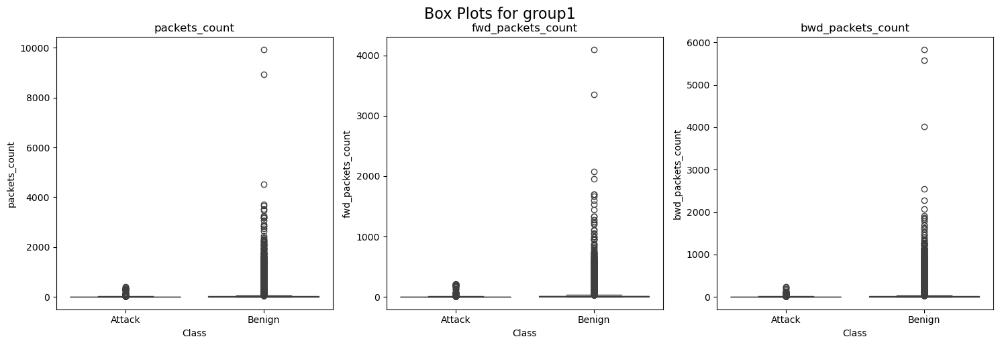

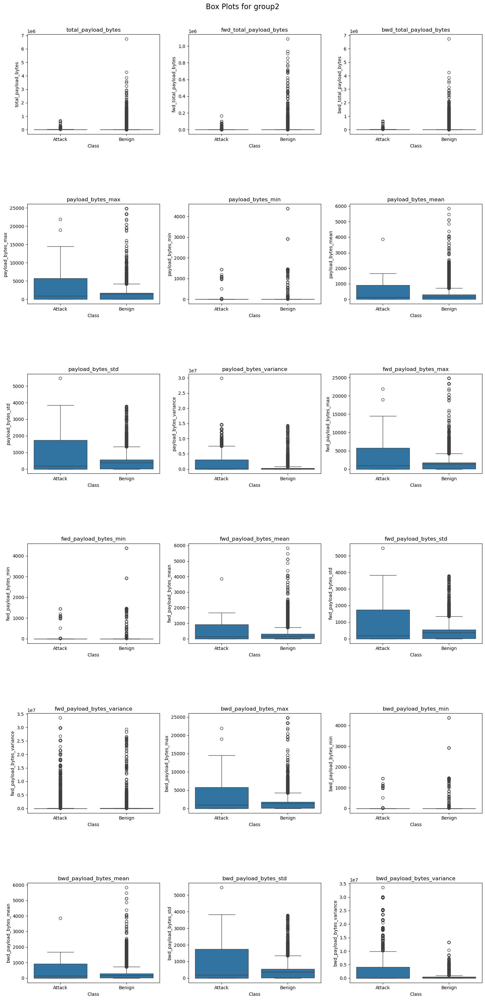

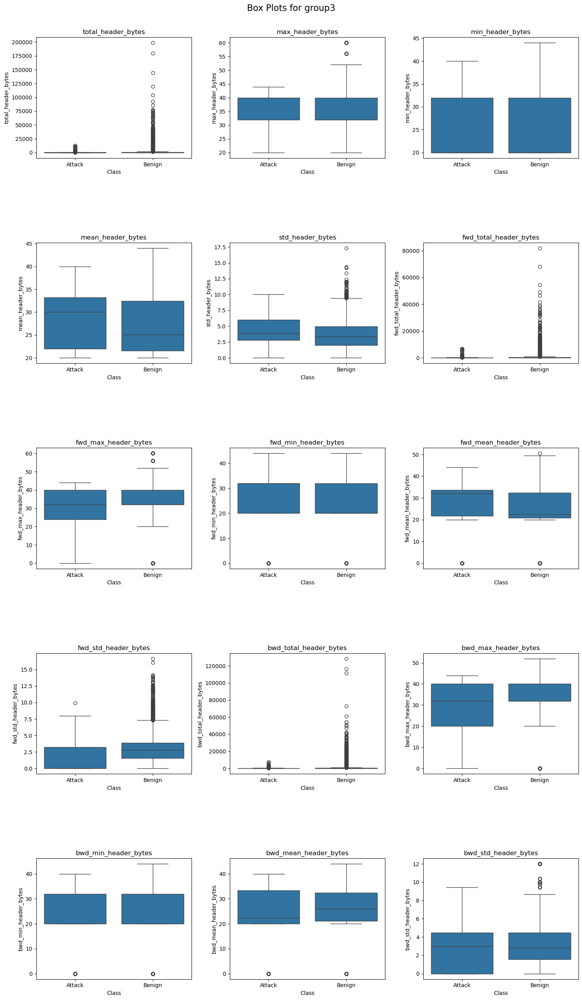

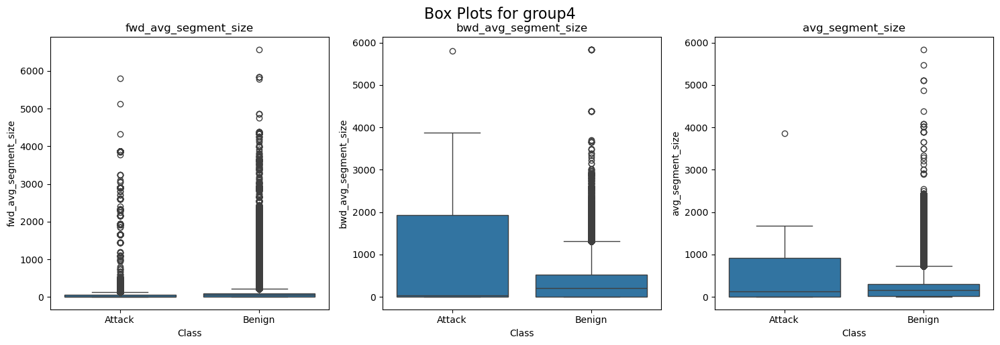

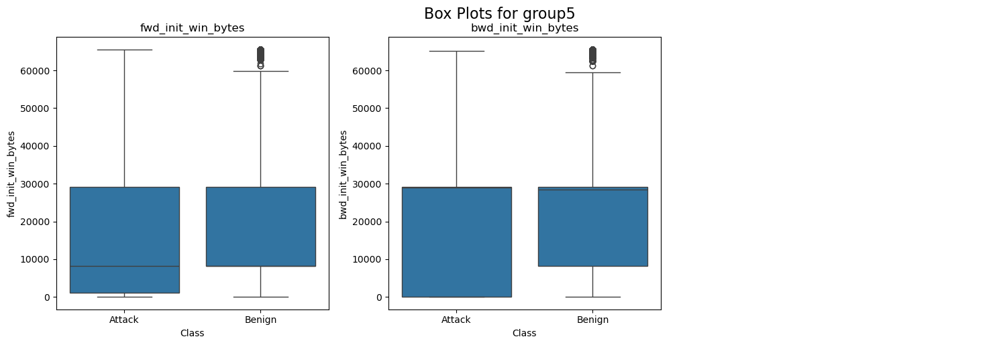

...

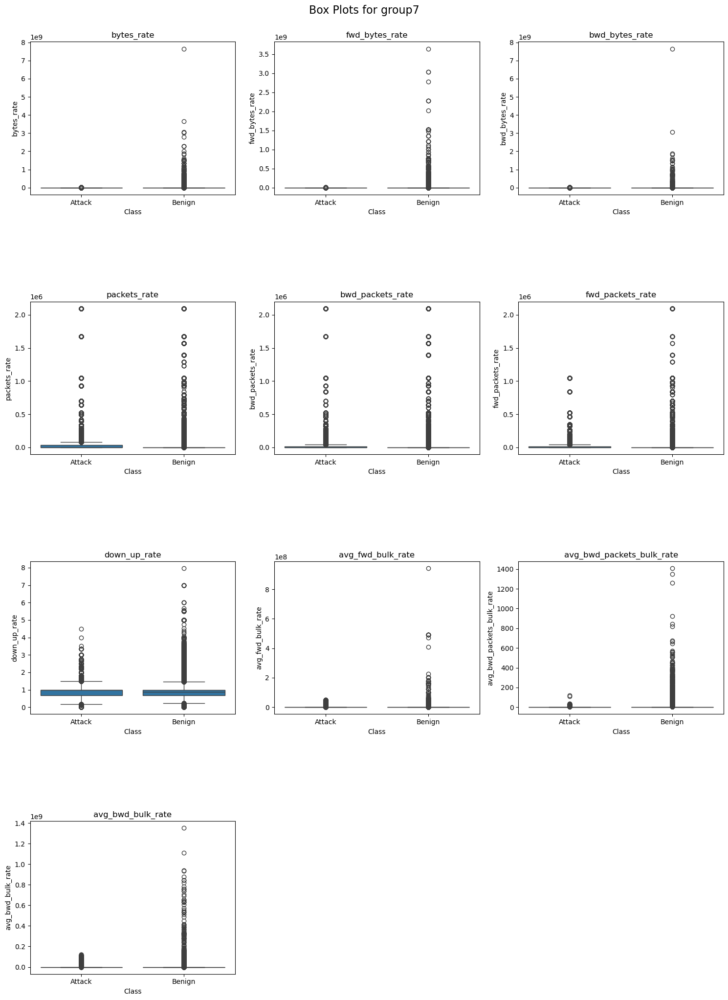

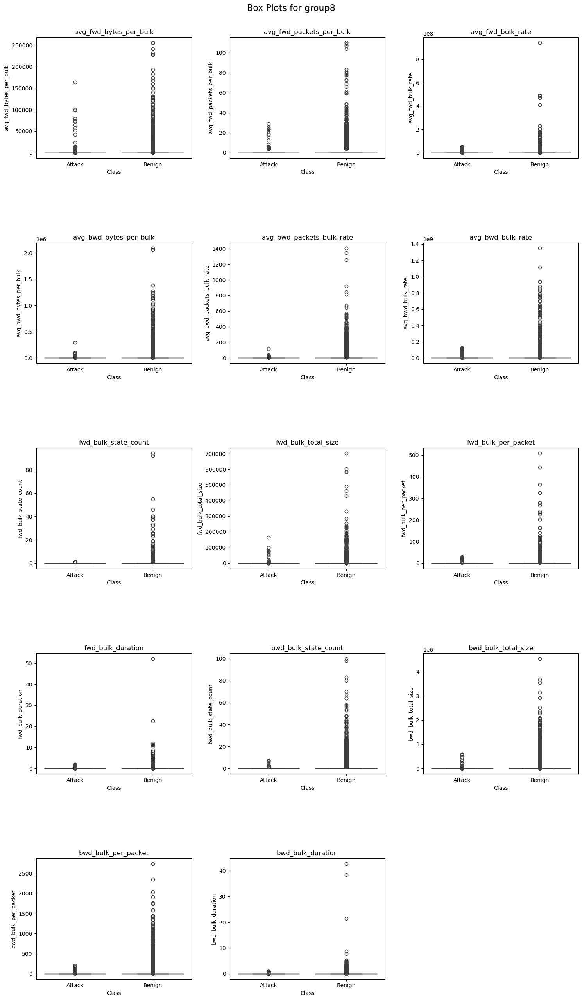

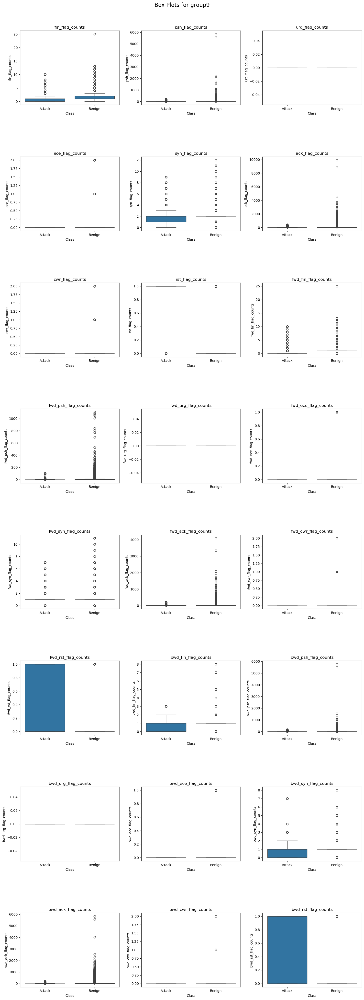

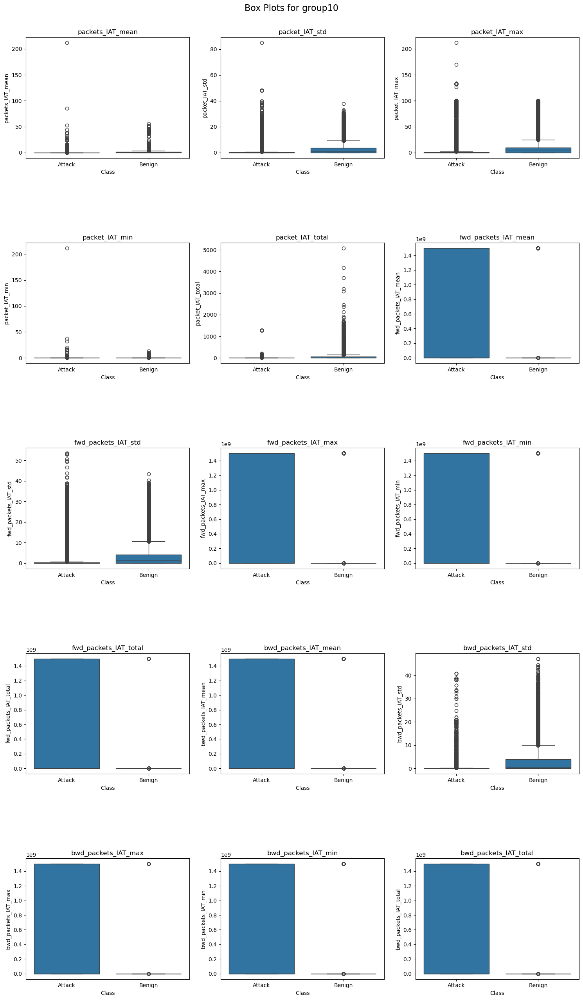

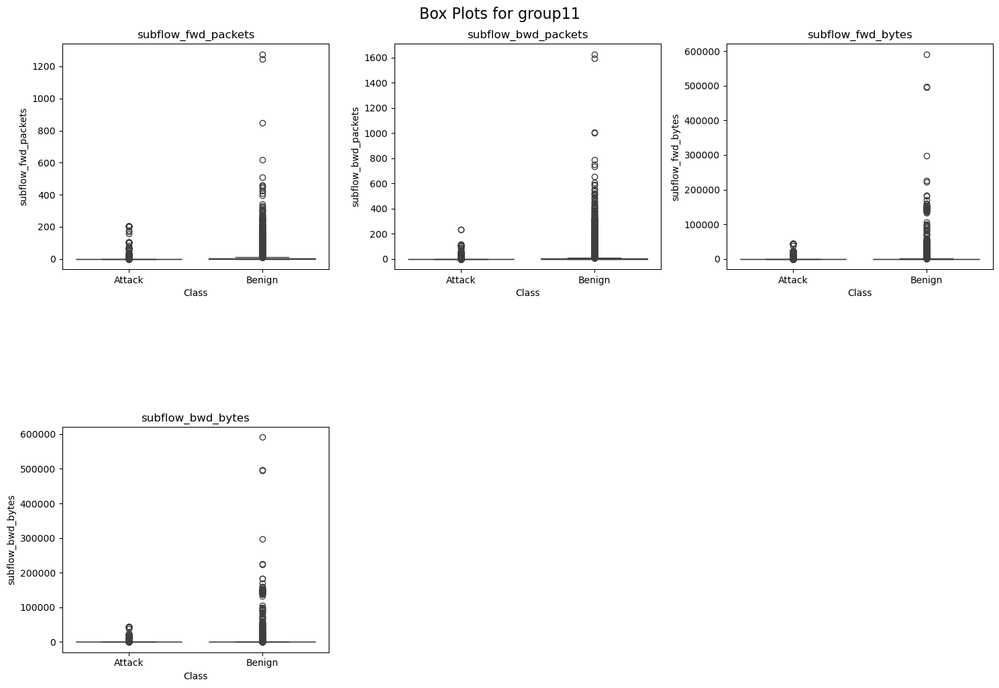

In [140]:
for group_number in range(1, 12):
    # Dynamically set the group variable (e.g., group2, group3, ..., group12)
    group_name = f"group{group_number}"  
    chosen_variables = eval(group_name).columns.tolist()  # Get the column names for the group

    # Calculate the number of rows and columns for subplots
    n_vars = len(chosen_variables)
    n_cols = 3  # Number of columns per row
    n_rows = math.ceil(n_vars / n_cols)  # Calculate rows dynamically

    # Create subplots
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(5 * n_cols, 5 * n_rows))  # Adjust figure size
    axes = axes.flatten()  # Flatten axes for easier iteration

    # Plot boxplots for each variable in the group
    for i, var in enumerate(chosen_variables):
        # Create boxplot
        sns.boxplot(data=data_TCP, x='Class', y=var, ax=axes[i])  # Create the boxplot
        axes[i].set_title(f'{var}')  # Add title

    # Turn off unused subplots
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    # Adjust layout
    plt.tight_layout()
    plt.suptitle(f'Box Plots for {group_name}', y=1.02, fontsize=16)  # Add a title for the entire figure
    plt.subplots_adjust(hspace=0.7)  # Add space for tables
    plt.show()

*   The majority of plots show that there are many outliers which skew the distribution, so the Anova test might not be an appropriate choice for FS. Scaling perhaps should be considered

In [141]:
# Perform ANOVA test
anova_stats, p_values = f_classif(X, y)

# Create a DataFrame summarizing results
anova_results = pd.DataFrame({
    'Feature': X.columns,
    'F-Statistic': anova_stats,
    'P-Value': p_values
})

# Filter significant features based on threshold
significant_features = anova_results[anova_results['P-Value'] < 0.05]

# Get the names of selected and dropped features
selected_feature_names = significant_features['Feature'].tolist()
dropped_features_anova = list(set(X.columns) - set(selected_feature_names))

#Results
print(f"\nSelected Feature Names: {len(selected_feature_names)}")
print(selected_feature_names)

print(f"\nDropped Feature Names: {len(dropped_features_anova)}")
print(dropped_features_anova)


Selected Feature Names: 87
['duration', 'packets_count', 'total_payload_bytes', 'payload_bytes_max', 'payload_bytes_min', 'payload_bytes_mean', 'payload_bytes_std', 'payload_bytes_variance', 'fwd_payload_bytes_max', 'fwd_payload_bytes_mean', 'fwd_payload_bytes_std', 'fwd_payload_bytes_variance', 'bwd_payload_bytes_max', 'bwd_payload_bytes_mean', 'bwd_payload_bytes_std', 'bwd_payload_bytes_variance', 'total_header_bytes', 'max_header_bytes', 'min_header_bytes', 'mean_header_bytes', 'std_header_bytes', 'fwd_max_header_bytes', 'fwd_min_header_bytes', 'fwd_mean_header_bytes', 'fwd_std_header_bytes', 'bwd_max_header_bytes', 'bwd_min_header_bytes', 'bwd_mean_header_bytes', 'bwd_std_header_bytes', 'fwd_avg_segment_size', 'bwd_avg_segment_size', 'avg_segment_size', 'fwd_init_win_bytes', 'bwd_init_win_bytes', 'bytes_rate', 'fwd_bytes_rate', 'bwd_bytes_rate', 'packets_rate', 'fwd_packets_rate', 'down_up_rate', 'avg_fwd_bytes_per_bulk', 'avg_fwd_packets_per_bulk', 'avg_bwd_bytes_per_bulk', 'avg_

*   Without scaling, Anova dropped 2 features which is not significant considering the number of features available.

### Mutual Information

In [142]:
# Step 1: Calculate mutual information scores
mi_scores = mutual_info_classif(X, y, random_state=42)

# Step 2: Create a DataFrame summarizing results
mutual_info_results = pd.DataFrame({'Feature': X.columns,
                                    'Mutual Information': mi_scores})

* I will calculate the thresholds to drop 20%, 40% and 60% of the features.

In [143]:
# Convert MI scores to a NumPy array for easier manipulation
mi_scores = np.array(mi_scores)

# Sort MI scores in ascending order
sorted_mi_scores = np.sort(mi_scores)

# Calculate the thresholds for 20%, 40%, and 60%
threshold_20 = np.percentile(sorted_mi_scores, 20)  # 20th percentile
threshold_40 = np.percentile(sorted_mi_scores, 40)  # 40th percentile
threshold_60 = np.percentile(sorted_mi_scores, 60)  # 60th percentile

# Print the thresholds
print(f"Threshold for 20% of features: {threshold_20:.2f}")
print(f"Threshold for 40% of features: {threshold_40:.2f}")
print(f"Threshold for 60% of features: {threshold_60:.2f}")

Threshold for 20% of features: 0.10
Threshold for 40% of features: 0.21
Threshold for 60% of features: 0.29


#### Threshold 20%

In [144]:
mi_threshold = 0.1
significant_mi_features = mutual_info_results[mutual_info_results['Mutual Information'] > mi_threshold]

# Get the names of selected and dropped features
selected_mi_feature_names = significant_mi_features['Feature'].tolist()
dropped_features_mi = list(set(X.columns) - set(selected_mi_feature_names))

print(f"\nSelected Feature Names (Mutual Information): {len(selected_mi_feature_names)}")
print(selected_mi_feature_names)

print(f"\nDropped Feature Names (Mutual Information): {len(dropped_features_mi)}")
print(dropped_features_mi)


Selected Feature Names (Mutual Information): 71
['duration', 'packets_count', 'total_payload_bytes', 'payload_bytes_max', 'payload_bytes_mean', 'payload_bytes_std', 'payload_bytes_variance', 'fwd_payload_bytes_max', 'fwd_payload_bytes_mean', 'fwd_payload_bytes_std', 'fwd_payload_bytes_variance', 'bwd_payload_bytes_max', 'bwd_payload_bytes_mean', 'bwd_payload_bytes_std', 'bwd_payload_bytes_variance', 'total_header_bytes', 'max_header_bytes', 'mean_header_bytes', 'std_header_bytes', 'fwd_max_header_bytes', 'fwd_min_header_bytes', 'fwd_mean_header_bytes', 'fwd_std_header_bytes', 'bwd_max_header_bytes', 'bwd_mean_header_bytes', 'bwd_std_header_bytes', 'fwd_avg_segment_size', 'bwd_avg_segment_size', 'avg_segment_size', 'fwd_init_win_bytes', 'bwd_init_win_bytes', 'bytes_rate', 'fwd_bytes_rate', 'bwd_bytes_rate', 'packets_rate', 'bwd_packets_rate', 'fwd_packets_rate', 'down_up_rate', 'avg_bwd_bytes_per_bulk', 'avg_bwd_bulk_rate', 'bwd_bulk_total_size', 'bwd_bulk_duration', 'fin_flag_counts',

#### Threshold 40%

In [145]:
mi_threshold = 0.21
significant_mi_features = mutual_info_results[mutual_info_results['Mutual Information'] > mi_threshold]

# Get the names of selected and dropped features
selected_mi_feature_names = significant_mi_features['Feature'].tolist()
dropped_features_mi = list(set(X.columns) - set(selected_mi_feature_names))

print(f"\nSelected Feature Names (Mutual Information): {len(selected_mi_feature_names)}")
print(selected_mi_feature_names)

print(f"\nDropped Feature Names (Mutual Information): {len(dropped_features_mi)}")
print(dropped_features_mi)


Selected Feature Names (Mutual Information): 54
['duration', 'packets_count', 'total_payload_bytes', 'payload_bytes_max', 'payload_bytes_mean', 'payload_bytes_std', 'payload_bytes_variance', 'fwd_payload_bytes_max', 'fwd_payload_bytes_mean', 'fwd_payload_bytes_std', 'fwd_payload_bytes_variance', 'bwd_payload_bytes_max', 'bwd_payload_bytes_mean', 'bwd_payload_bytes_std', 'bwd_payload_bytes_variance', 'total_header_bytes', 'mean_header_bytes', 'std_header_bytes', 'fwd_mean_header_bytes', 'fwd_std_header_bytes', 'bwd_mean_header_bytes', 'bwd_std_header_bytes', 'fwd_avg_segment_size', 'bwd_avg_segment_size', 'avg_segment_size', 'fwd_init_win_bytes', 'bwd_init_win_bytes', 'bytes_rate', 'bwd_bytes_rate', 'packets_rate', 'bwd_packets_rate', 'fwd_packets_rate', 'down_up_rate', 'fin_flag_counts', 'psh_flag_counts', 'syn_flag_counts', 'ack_flag_counts', 'rst_flag_counts', 'fwd_fin_flag_counts', 'fwd_psh_flag_counts', 'fwd_ack_flag_counts', 'bwd_psh_flag_counts', 'bwd_ack_flag_counts', 'packets_

#### Threshold 60%

In [146]:
mi_threshold = 0.29
significant_mi_features = mutual_info_results[mutual_info_results['Mutual Information'] > mi_threshold]

# Get the names of selected and dropped features
selected_mi_feature_names = significant_mi_features['Feature'].tolist()
dropped_features_mi = list(set(X.columns) - set(selected_mi_feature_names))

print(f"\nSelected Feature Names (Mutual Information): {len(selected_mi_feature_names)}")
print(selected_mi_feature_names)

print(f"\nDropped Feature Names (Mutual Information): {len(dropped_features_mi)}")
print(dropped_features_mi)


Selected Feature Names (Mutual Information): 37
['duration', 'packets_count', 'total_payload_bytes', 'payload_bytes_max', 'payload_bytes_mean', 'payload_bytes_std', 'payload_bytes_variance', 'fwd_payload_bytes_max', 'fwd_payload_bytes_mean', 'fwd_payload_bytes_std', 'fwd_payload_bytes_variance', 'bwd_payload_bytes_max', 'bwd_payload_bytes_mean', 'bwd_payload_bytes_std', 'bwd_payload_bytes_variance', 'total_header_bytes', 'mean_header_bytes', 'std_header_bytes', 'fwd_mean_header_bytes', 'bwd_mean_header_bytes', 'fwd_avg_segment_size', 'bwd_avg_segment_size', 'avg_segment_size', 'bwd_init_win_bytes', 'packets_rate', 'bwd_packets_rate', 'fwd_packets_rate', 'ack_flag_counts', 'rst_flag_counts', 'packets_IAT_mean', 'packet_IAT_max', 'packet_IAT_total', 'fwd_packets_IAT_max', 'fwd_packets_IAT_total', 'bwd_packets_IAT_mean', 'bwd_packets_IAT_max', 'bwd_packets_IAT_total']

Dropped Feature Names (Mutual Information): 52
['bwd_packets_IAT_min', 'fwd_bytes_rate', 'fwd_packets_IAT_std', 'fwd_std

### Random Forrest Classifier

In [147]:
# Step 1: Train Random Forest Classifier
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
rf_model.fit(X, y)

# Step 2: Extract Feature Importance
feature_importances = rf_model.feature_importances_

# Create a DataFrame summarizing feature importance
feature_importance_df = pd.DataFrame({
    'Feature': X.columns,
    'Importance': feature_importances
})

feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

* I will calculate the thresholds to drop 20%, 40% and 60% of the features.

In [148]:
# Step 2: Extract Feature Importances
feature_importances = np.array(rf_model.feature_importances_)

# Step 3: Sort feature importances in ascending order
sorted_feature_importances = np.sort(feature_importances)

# Step 4: Calculate the thresholds for 20%, 40%, and 60%
threshold_20 = np.percentile(sorted_feature_importances, 20)  # 20th percentile
threshold_40 = np.percentile(sorted_feature_importances, 40)  # 40th percentile
threshold_60 = np.percentile(sorted_feature_importances, 60)  # 60th percentile

# Step 5: Print the thresholds
print(f"Threshold for 20% of features: {threshold_20:.5f}")
print(f"Threshold for 40% of features: {threshold_40:.5f}")
print(f"Threshold for 60% of features: {threshold_60:.5f}")

Threshold for 20% of features: 0.00091
Threshold for 40% of features: 0.00337
Threshold for 60% of features: 0.00835


#### Threshold 20%

In [149]:
threshold = 0.00091
selected_features_rf = feature_importance_df[feature_importance_df['Importance'] > threshold]
dropped_features_rf = feature_importance_df[feature_importance_df['Importance'] <= threshold]

print(f"\nSelected Features: {len(selected_features_rf)}")
print(selected_features_rf['Feature'].to_list())

print(f"\nDropped Features: {len(dropped_features_rf)}")
print(dropped_features_rf['Feature'].to_list())

# Get the list of selected feature names
#selected_feature_names_rf = selected_features_rf['Feature'].tolist()


Selected Features: 71
['ack_flag_counts', 'rst_flag_counts', 'bwd_payload_bytes_std', 'fwd_fin_flag_counts', 'bwd_psh_flag_counts', 'bwd_payload_bytes_variance', 'fwd_ack_flag_counts', 'total_header_bytes', 'fwd_payload_bytes_std', 'psh_flag_counts', 'packets_count', 'bwd_packets_IAT_total', 'bwd_avg_segment_size', 'payload_bytes_std', 'bwd_packets_IAT_mean', 'bwd_packets_IAT_min', 'payload_bytes_variance', 'bwd_rst_flag_counts', 'bwd_ack_flag_counts', 'fwd_packets_IAT_total', 'fwd_psh_flag_counts', 'bwd_payload_bytes_max', 'bwd_init_win_bytes', 'fwd_payload_bytes_max', 'fwd_packets_IAT_min', 'fin_flag_counts', 'bwd_packets_IAT_max', 'bwd_payload_bytes_mean', 'bwd_packets_rate', 'payload_bytes_max', 'payload_bytes_mean', 'fwd_packets_IAT_max', 'total_payload_bytes', 'mean_header_bytes', 'packets_rate', 'fwd_payload_bytes_mean', 'packet_IAT_min', 'fwd_packets_rate', 'fwd_packets_IAT_mean', 'packets_IAT_mean', 'duration', 'packet_IAT_total', 'std_header_bytes', 'fwd_syn_flag_counts', 'd

#### Threshold 40%

In [150]:
threshold = 0.00337
selected_features_rf = feature_importance_df[feature_importance_df['Importance'] > threshold]
dropped_features_rf = feature_importance_df[feature_importance_df['Importance'] <= threshold]

print(f"\nSelected Features: {len(selected_features_rf)}")
print(selected_features_rf['Feature'].to_list())

print(f"\nDropped Features: {len(dropped_features_rf)}")
print(dropped_features_rf['Feature'].to_list())

# Get the list of selected feature names
#selected_feature_names_rf = selected_features_rf['Feature'].tolist()


Selected Features: 53
['ack_flag_counts', 'rst_flag_counts', 'bwd_payload_bytes_std', 'fwd_fin_flag_counts', 'bwd_psh_flag_counts', 'bwd_payload_bytes_variance', 'fwd_ack_flag_counts', 'total_header_bytes', 'fwd_payload_bytes_std', 'psh_flag_counts', 'packets_count', 'bwd_packets_IAT_total', 'bwd_avg_segment_size', 'payload_bytes_std', 'bwd_packets_IAT_mean', 'bwd_packets_IAT_min', 'payload_bytes_variance', 'bwd_rst_flag_counts', 'bwd_ack_flag_counts', 'fwd_packets_IAT_total', 'fwd_psh_flag_counts', 'bwd_payload_bytes_max', 'bwd_init_win_bytes', 'fwd_payload_bytes_max', 'fwd_packets_IAT_min', 'fin_flag_counts', 'bwd_packets_IAT_max', 'bwd_payload_bytes_mean', 'bwd_packets_rate', 'payload_bytes_max', 'payload_bytes_mean', 'fwd_packets_IAT_max', 'total_payload_bytes', 'mean_header_bytes', 'packets_rate', 'fwd_payload_bytes_mean', 'packet_IAT_min', 'fwd_packets_rate', 'fwd_packets_IAT_mean', 'packets_IAT_mean', 'duration', 'packet_IAT_total', 'std_header_bytes', 'fwd_syn_flag_counts', 'd

#### Threshold 60%

In [151]:
threshold = 0.00835
selected_features_rf = feature_importance_df[feature_importance_df['Importance'] > threshold]
dropped_features_rf = feature_importance_df[feature_importance_df['Importance'] <= threshold]

print(f"\nSelected Features: {len(selected_features_rf)}")
print(selected_features_rf['Feature'].to_list())

print(f"\nDropped Features: {len(dropped_features_rf)}")
print(dropped_features_rf['Feature'].to_list())

# Get the list of selected feature names
selected_feature_names_rf = selected_features_rf['Feature'].tolist()


Selected Features: 36
['ack_flag_counts', 'rst_flag_counts', 'bwd_payload_bytes_std', 'fwd_fin_flag_counts', 'bwd_psh_flag_counts', 'bwd_payload_bytes_variance', 'fwd_ack_flag_counts', 'total_header_bytes', 'fwd_payload_bytes_std', 'psh_flag_counts', 'packets_count', 'bwd_packets_IAT_total', 'bwd_avg_segment_size', 'payload_bytes_std', 'bwd_packets_IAT_mean', 'bwd_packets_IAT_min', 'payload_bytes_variance', 'bwd_rst_flag_counts', 'bwd_ack_flag_counts', 'fwd_packets_IAT_total', 'fwd_psh_flag_counts', 'bwd_payload_bytes_max', 'bwd_init_win_bytes', 'fwd_payload_bytes_max', 'fwd_packets_IAT_min', 'fin_flag_counts', 'bwd_packets_IAT_max', 'bwd_payload_bytes_mean', 'bwd_packets_rate', 'payload_bytes_max', 'payload_bytes_mean', 'fwd_packets_IAT_max', 'total_payload_bytes', 'mean_header_bytes', 'packets_rate', 'fwd_payload_bytes_mean']

Dropped Features: 53
['packet_IAT_min', 'fwd_packets_rate', 'fwd_packets_IAT_mean', 'packets_IAT_mean', 'duration', 'packet_IAT_total', 'std_header_bytes', 'f

#### Threshold 0.02

In [152]:
threshold = 0.02
selected_features_rf = feature_importance_df[feature_importance_df['Importance'] > threshold]
dropped_features_rf = feature_importance_df[feature_importance_df['Importance'] <= threshold]

print(f"\nSelected Features: {len(selected_features_rf)}")
display(selected_features_rf)

print(f"\nDropped Features: {len(dropped_features_rf)}")
display(dropped_features_rf)

# Get the list of selected feature names
selected_feature_names_rf2 = selected_features_rf['Feature'].tolist()


Selected Features: 18


,Feature,Importance
59,ack_flag_counts,0.068820
61,rst_flag_counts,0.059031
14,bwd_payload_bytes_std,0.041047
62,fwd_fin_flag_counts,0.040050
68,bwd_psh_flag_counts,0.039202
15,bwd_payload_bytes_variance,0.036290
65,fwd_ack_flag_counts,0.035785
16,total_header_bytes,0.035518
10,fwd_payload_bytes_std,0.034349
56,psh_flag_counts,0.031114



Dropped Features: 71


,Feature,Importance
70,bwd_ack_flag_counts,0.019399
81,fwd_packets_IAT_total,0.018867
63,fwd_psh_flag_counts,0.017373
12,bwd_payload_bytes_max,0.017288
33,bwd_init_win_bytes,0.016946
...,...,...
54,bwd_bulk_duration,0.000094
49,fwd_bulk_per_packet,0.000035
4,payload_bytes_min,0.000009
60,cwr_flag_counts,0.000000


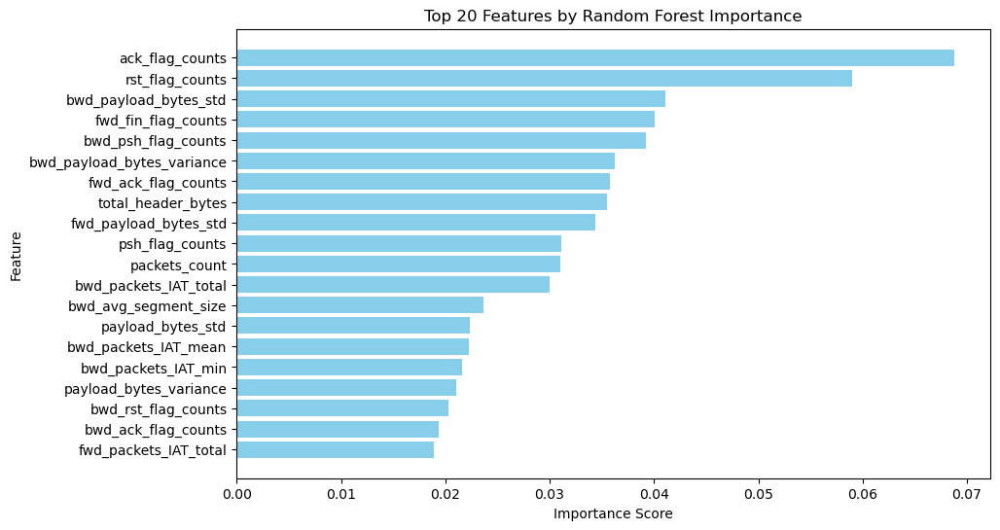

In [153]:
plt.figure(figsize=(10, 6))
top_features = feature_importance_df.head(20)
plt.barh(top_features['Feature'], top_features['Importance'], color='skyblue')
plt.xlabel('Importance Score')
plt.ylabel('Feature')
plt.title('Top 20 Features by Random Forest Importance')
plt.gca().invert_yaxis()
plt.show()

## Model Building and Evaluation: Random Forest<a id='model-building-and-evaluation-random-forest'></a>

### Functions for Evaluation

In [154]:
def evaluate_model(predictions, probs, train_predictions, train_probs):
    """Compare machine learning model to baseline performance.
    Computes statistics and shows ROC curve."""
    
    baseline = {}
    
    baseline['recall'] = recall_score(y_test, [1 for _ in range(len(y_test))])
    baseline['precision'] = precision_score(y_test, [1 for _ in range(len(y_test))])
    baseline['roc'] = 0.5
    
    results = {}
    
    results['recall'] = recall_score(y_test, predictions)
    results['precision'] = precision_score(y_test, predictions)
    results['roc'] = roc_auc_score(y_test, probs)
    
    train_results = {}
    train_results['recall'] = recall_score(y_train, train_predictions)
    train_results['precision'] = precision_score(y_train, train_predictions)
    train_results['roc'] = roc_auc_score(y_train, train_probs)
        
    for metric in ['recall', 'precision', 'roc']:
        print(f'{metric.capitalize()} Baseline: {round(baseline[metric], 2)} Test: {round(results[metric], 2)} Train: {round(train_results[metric], 2)}')
    
    print("\nAccuracy:", accuracy_score(y_test, rf_predictions))
    # Calculate false positive rates and true positive rates
    base_fpr, base_tpr, _ = roc_curve(y_test, [1 for _ in range(len(y_test))])
    model_fpr, model_tpr, _ = roc_curve(y_test, probs)

    plt.figure(figsize = (8, 6))
    plt.rcParams['font.size'] = 16
    
    # Plot both curves
    plt.plot(base_fpr, base_tpr, 'b', label = 'baseline')
    plt.plot(model_fpr, model_tpr, 'r', label = 'model')
    plt.legend();
    plt.xlabel('False Positive Rate'); plt.ylabel('True Positive Rate'); plt.title('ROC Curves');

In [156]:
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Oranges):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    Source: http://scikit-learn.org/stable/auto_examples/model_selection/plot_confusion_matrix.html
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    plt.figure(figsize = (10, 10))
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title, size = 24)
    plt.colorbar(aspect=4)
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45, size = 14)
    plt.yticks(tick_marks, classes, size = 14)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    
    # Labeling the plot
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt), fontsize = 20,
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")
        
    plt.grid(None)
    plt.tight_layout()
    plt.ylabel('True y', size = 18)
    plt.xlabel('Predicted y', size = 18)

### Splitting the Data

In [157]:
# 20% examples in test data
X_train, X_test, y_train, y_test = train_test_split(X, y, 
                                                          stratify = y,
                                                          test_size = 0.2, 
                                                          random_state = 42)

In [158]:
# Checking the class distribution in the splits
print("Original class distribution:")
print(y.value_counts())

print("\nTraining set class distribution:")
print(pd.Series(y_train).value_counts())

print("\nTesting set class distribution:")
print(pd.Series(y_test).value_counts())

Original class distribution:
Class
0    531151
1    484977
Name: count, dtype: int64

Training set class distribution:
Class
0    424921
1    387981
Name: count, dtype: int64

Testing set class distribution:
Class
0    106230
1     96996
Name: count, dtype: int64


### Base Model: Random Forrest

In [159]:
model_base = RandomForestClassifier(n_estimators=100, 
                               random_state=42, # reproducibility of results.
                               max_features = 'sqrt', #setting it to 'sqrt', the model will consider the square root of the total number of features at each split
                               n_jobs=-1, #all processors are used, which can significantly speed up the training process,
                               verbose = 1) # the progress of the fitting process will be printed, providing feedback on the training status

# Fit on training data
model_base.fit(X_train, y_train)

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 tasks      | elapsed:   18.2s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   49.6s finished


,n_estimators,100
,criterion,'gini'
,max_depth,None
,min_samples_split,2
,min_samples_leaf,1
,min_weight_fraction_leaf,0.0
,max_features,'sqrt'
,max_leaf_nodes,None
,min_impurity_decrease,0.0
,bootstrap,True
,oob_score,False


In [160]:
n_nodes = []
max_depths = []

for ind_tree in model_base.estimators_:
    n_nodes.append(ind_tree.tree_.node_count)
    max_depths.append(ind_tree.tree_.max_depth)
    
print(f'Average number of nodes {int(np.mean(n_nodes))}')
print(f'Average maximum depth {int(np.mean(max_depths))}')

Average number of nodes 2998
Average maximum depth 34


In [161]:
train_rf_predictions = model_base.predict(X_train)
train_rf_probs = model_base.predict_proba(X_train)[:, 1]

rf_predictions = model_base.predict(X_test)
rf_probs = model_base.predict_proba(X_test)[:, 1]

[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.3s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.8s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.3s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.7s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.1s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.2s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.1s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.2s finished


Recall Baseline: 1.0 Test: 1.0 Train: 1.0
Precision Baseline: 0.48 Test: 1.0 Train: 1.0
Roc Baseline: 0.5 Test: 1.0 Train: 1.0

Accuracy: 0.9993061911369608


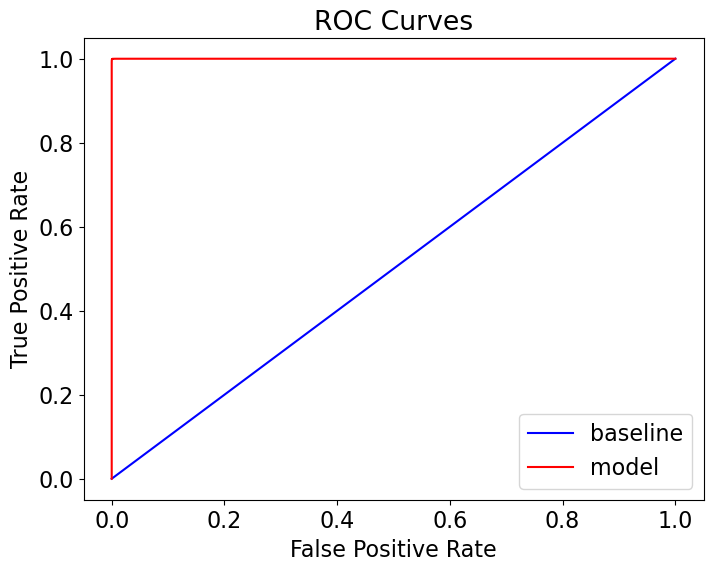

In [162]:
evaluate_model(rf_predictions, rf_probs, train_rf_predictions, train_rf_probs)

Confusion matrix, without normalization
[[106151     79]
 [    62  96934]]


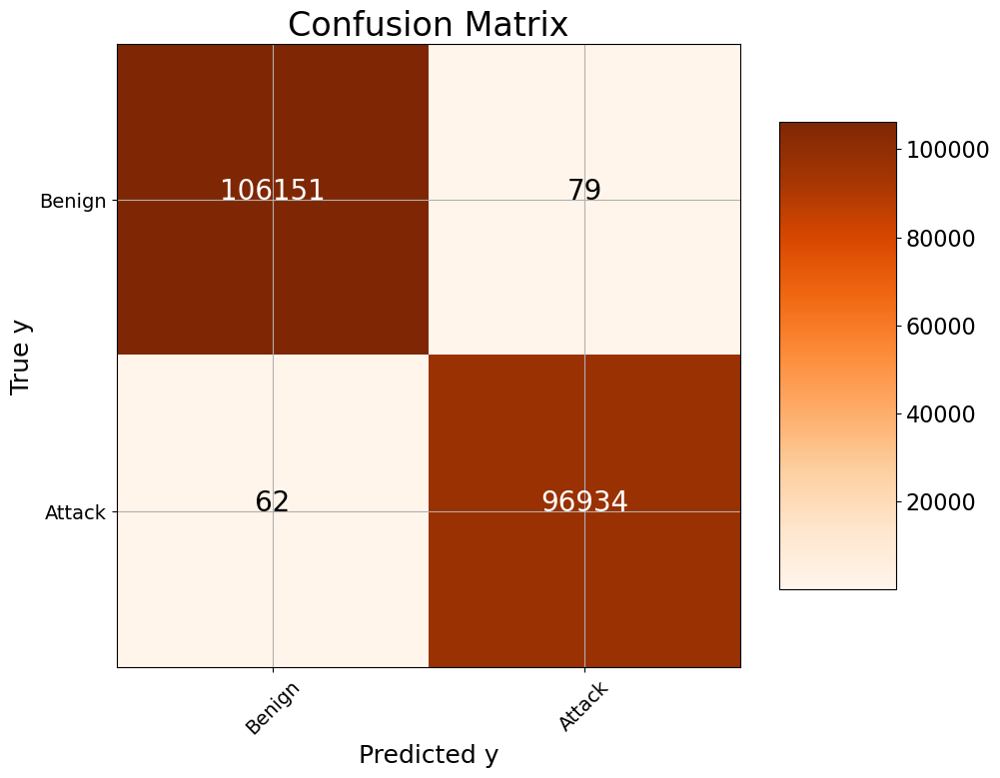

In [163]:
cm = confusion_matrix(y_test, rf_predictions)
plot_confusion_matrix(cm, classes = ['Benign', 'Attack'],
                      title = 'Confusion Matrix')

## Model Testing with Feature Engineering Outputs<a id='model-testing-with-feature-engineering-outputs'></a>

* I will train 3 models:
    * m1: 60% dropping feature threshold calculated with RF.
    * m2: 60% dropping feature threshold calculated with MI.
    * m3: RF with 0.02 threshold which gave 15 features.
* I will test PCA with 10, 33 and 51 components.

In [164]:
rf_features = selected_feature_names_rf
mi_features = selected_mi_feature_names
rf_features2 = selected_feature_names_rf2


selected = pd.DataFrame(list(zip_longest(rf_features, mi_features, rf_features2, fillvalue=None)), columns=['RF_60%', 'MI_60%', 'RF_0.02'])

selected['RF_60%'] = selected['RF_60%'].sort_values(ascending=True).values
selected['MI_60%'] = selected['MI_60%'].sort_values(ascending=True).values
selected['RF_0.02'] = selected['RF_0.02'].sort_values(ascending=True).values

# Display the DataFrame
selected

,RF_60%,MI_60%,RF_0.02
0,ack_flag_counts,ack_flag_counts,ack_flag_counts
1,bwd_ack_flag_counts,avg_segment_size,bwd_avg_segment_size
2,bwd_avg_segment_size,bwd_avg_segment_size,bwd_packets_IAT_mean
3,bwd_init_win_bytes,bwd_init_win_bytes,bwd_packets_IAT_min
4,bwd_packets_IAT_max,bwd_mean_header_bytes,bwd_packets_IAT_total
5,bwd_packets_IAT_mean,bwd_packets_IAT_max,bwd_payload_bytes_std
6,bwd_packets_IAT_min,bwd_packets_IAT_mean,bwd_payload_bytes_variance
7,bwd_packets_IAT_total,bwd_packets_IAT_total,bwd_psh_flag_counts
8,bwd_packets_rate,bwd_packets_rate,bwd_rst_flag_counts
9,bwd_payload_bytes_max,bwd_payload_bytes_max,fwd_ack_flag_counts


### Model 1: Random Forrest Classifier 60% Threshold

In [165]:
X_train_rf60 = X_train[selected['RF_60%'].dropna()]
X_test_rf60 = X_test[selected['RF_60%'].dropna()]

In [166]:
model_base.fit(X_train_rf60, y_train)

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 tasks      | elapsed:   14.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   40.6s finished


,n_estimators,100
,criterion,'gini'
,max_depth,None
,min_samples_split,2
,min_samples_leaf,1
,min_weight_fraction_leaf,0.0
,max_features,'sqrt'
,max_leaf_nodes,None
,min_impurity_decrease,0.0
,bootstrap,True
,oob_score,False


In [167]:
train_rf_predictions = model_base.predict(X_train_rf60)
train_rf_probs = model_base.predict_proba(X_train_rf60)[:, 1]

rf_predictions = model_base.predict(X_test_rf60)
rf_probs = model_base.predict_proba(X_test_rf60)[:, 1]

[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.2s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.7s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.2s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.7s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.1s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.2s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.1s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.2s finished


Recall Baseline: 1.0 Test: 1.0 Train: 1.0
Precision Baseline: 0.48 Test: 1.0 Train: 1.0
Roc Baseline: 0.5 Test: 1.0 Train: 1.0

Accuracy: 0.9994242862625845


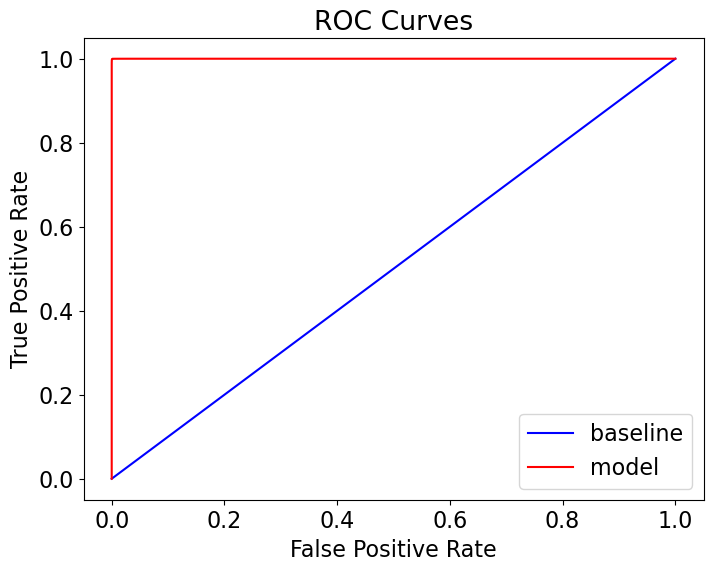

In [168]:
evaluate_model(rf_predictions, rf_probs, train_rf_predictions, train_rf_probs)

Confusion matrix, without normalization
[[106161     69]
 [    48  96948]]


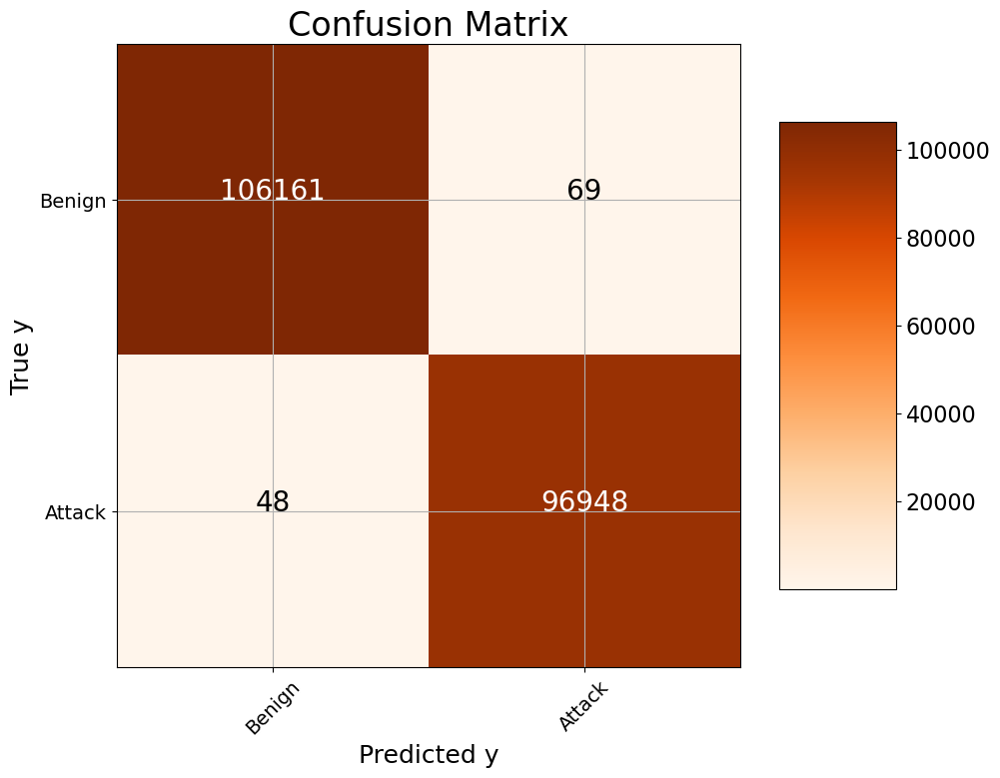

In [169]:
cm = confusion_matrix(y_test, rf_predictions)
plot_confusion_matrix(cm, classes = ['Benign', 'Attack'],
                      title = 'Confusion Matrix')

### Model 2: Mutual Information 60% Threshold

In [170]:
X_train_mi60 = X_train[selected['MI_60%'].dropna()]
X_test_mi60 = X_test[selected['MI_60%'].dropna()]

In [171]:
model_base.fit(X_train_mi60, y_train)

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 tasks      | elapsed:   16.7s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   50.8s finished


,n_estimators,100
,criterion,'gini'
,max_depth,None
,min_samples_split,2
,min_samples_leaf,1
,min_weight_fraction_leaf,0.0
,max_features,'sqrt'
,max_leaf_nodes,None
,min_impurity_decrease,0.0
,bootstrap,True
,oob_score,False


In [172]:
train_rf_predictions = model_base.predict(X_train_mi60)
train_rf_probs = model_base.predict_proba(X_train_mi60)[:, 1]

rf_predictions = model_base.predict(X_test_mi60)
rf_probs = model_base.predict_proba(X_test_mi60)[:, 1]

[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.3s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.7s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.2s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.7s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.1s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.2s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.1s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.2s finished


Recall Baseline: 1.0 Test: 1.0 Train: 1.0
Precision Baseline: 0.48 Test: 1.0 Train: 1.0
Roc Baseline: 0.5 Test: 1.0 Train: 1.0

Accuracy: 0.999217619792743


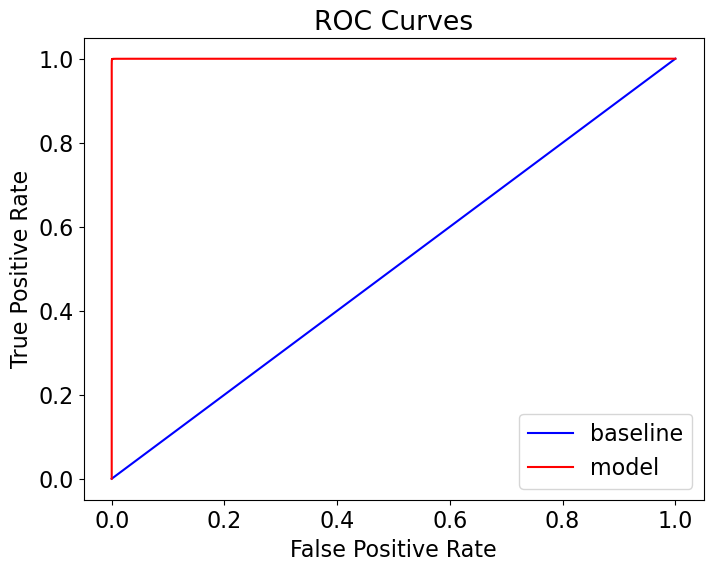

In [173]:
evaluate_model(rf_predictions, rf_probs, train_rf_predictions, train_rf_probs)

Confusion matrix, without normalization
[[106151     79]
 [    80  96916]]


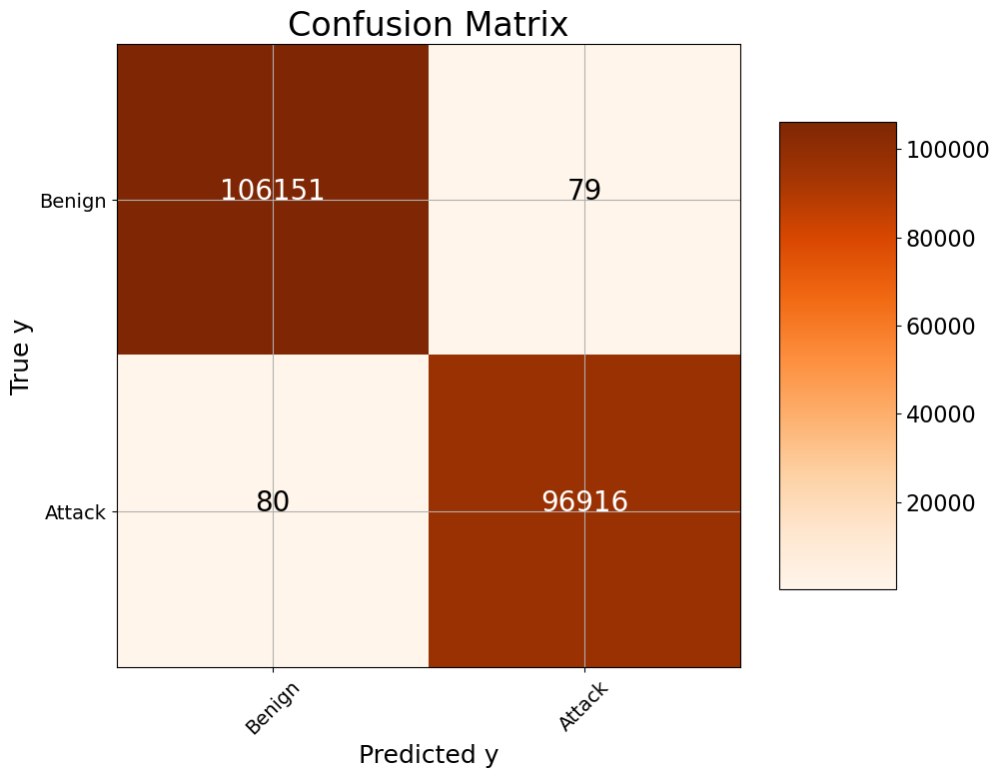

In [174]:
cm = confusion_matrix(y_test, rf_predictions)
plot_confusion_matrix(cm, classes = ['Benign', 'Attack'],
                      title = 'Confusion Matrix')

### Model 3: Random Forrest Classifier 0.02 Threshold

In [175]:
X_train_rf02 = X_train[selected['RF_0.02'].dropna()]
X_test_rf02 = X_test[selected['RF_0.02'].dropna()]

In [176]:
model_base.fit(X_train_rf02, y_train)

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 tasks      | elapsed:    8.2s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   25.9s finished


,n_estimators,100
,criterion,'gini'
,max_depth,None
,min_samples_split,2
,min_samples_leaf,1
,min_weight_fraction_leaf,0.0
,max_features,'sqrt'
,max_leaf_nodes,None
,min_impurity_decrease,0.0
,bootstrap,True
,oob_score,False


In [177]:
train_rf_predictions = model_base.predict(X_train_rf02)
train_rf_probs = model_base.predict_proba(X_train_rf02)[:, 1]

rf_predictions = model_base.predict(X_test_rf02)
rf_probs = model_base.predict_proba(X_test_rf02)[:, 1]

[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.2s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.7s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.2s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.7s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.1s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.2s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.1s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.2s finished


Recall Baseline: 1.0 Test: 0.99 Train: 1.0
Precision Baseline: 0.48 Test: 0.99 Train: 1.0
Roc Baseline: 0.5 Test: 1.0 Train: 1.0

Accuracy: 0.9935785775442119


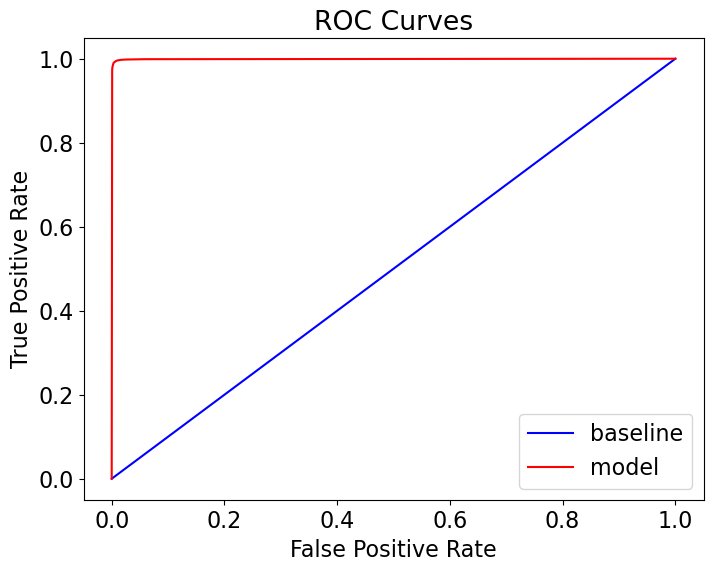

In [178]:
evaluate_model(rf_predictions, rf_probs, train_rf_predictions, train_rf_probs)

Confusion matrix, without normalization
[[105521    709]
 [   596  96400]]


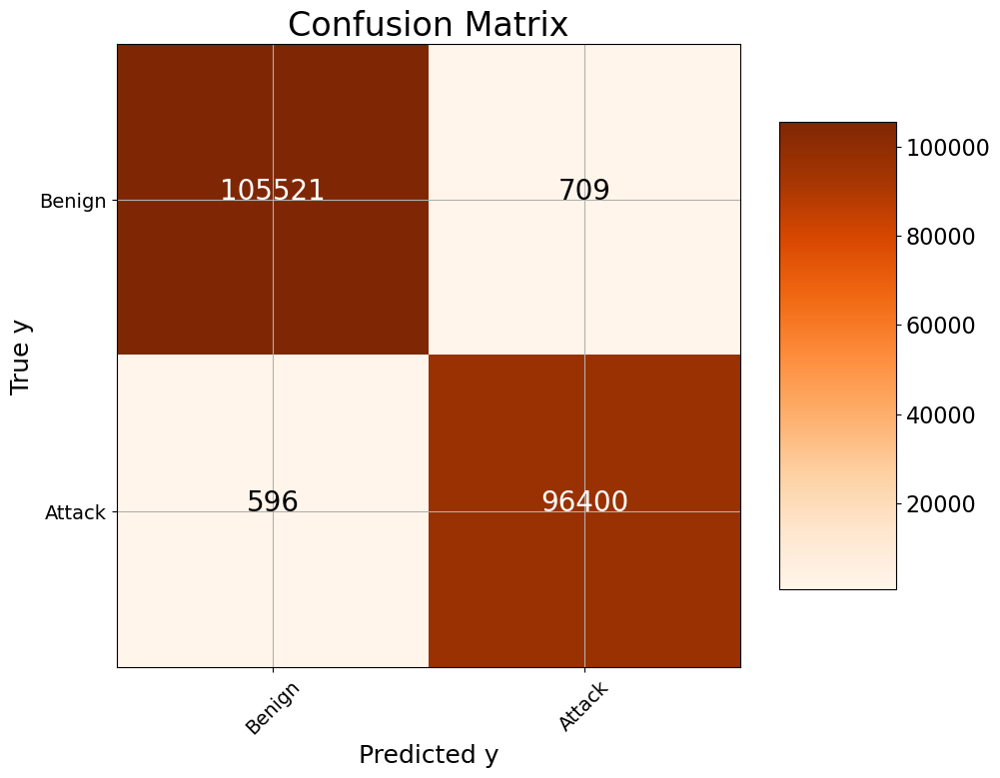

In [179]:
cm = confusion_matrix(y_test, rf_predictions)
plot_confusion_matrix(cm, classes = ['Benign', 'Attack'],
                      title = 'Confusion Matrix')

### Principal Component Analysis

In [180]:
y = data_model['Class']
y = y.map({'Attack': 1, 'Benign': 0})

X = data_model.drop(columns='Class')

In [181]:
sc = StandardScaler()
sc_X = sc.fit_transform(X)

sc_X = pd.DataFrame(sc_X, columns = X.columns)
sc_X.head()

,duration,packets_count,total_payload_bytes,payload_bytes_max,payload_bytes_min,payload_bytes_mean,payload_bytes_std,payload_bytes_variance,fwd_payload_bytes_max,fwd_payload_bytes_mean,...,fwd_packets_IAT_max,fwd_packets_IAT_min,fwd_packets_IAT_total,bwd_packets_IAT_mean,bwd_packets_IAT_std,bwd_packets_IAT_max,bwd_packets_IAT_min,bwd_packets_IAT_total,subflow_fwd_packets,subflow_bwd_packets
0,-0.369325,-0.258271,-0.243515,-0.790769,-0.019045,-0.840503,-0.803626,-0.542606,-0.790769,-0.840503,...,-0.520466,-0.520466,-0.520466,-0.529976,-0.399105,-0.529976,-0.529976,-0.529976,-0.39916,-0.284406
1,-0.369177,-0.258271,-0.242933,-0.783126,-0.019045,-0.833032,-0.794400,-0.542525,-0.783126,-0.833032,...,-0.520466,-0.520466,-0.520466,-0.529976,-0.398302,-0.529976,-0.529976,-0.529976,-0.39916,-0.284406
2,-0.369318,-0.258271,-0.243515,-0.790769,-0.019045,-0.840503,-0.803626,-0.542606,-0.790769,-0.840503,...,-0.520466,-0.520466,-0.520466,-0.529976,-0.399084,-0.529976,-0.529976,-0.529976,-0.39916,-0.284406
3,-0.369190,-0.258271,-0.242933,-0.783126,-0.019045,-0.833032,-0.794400,-0.542525,-0.783126,-0.833032,...,-0.520466,-0.520466,-0.520466,-0.529976,-0.398491,-0.529976,-0.529976,-0.529976,-0.39916,-0.284406
4,-0.369316,-0.258271,-0.243515,-0.790769,-0.019045,-0.840503,-0.803626,-0.542606,-0.790769,-0.840503,...,-0.520466,-0.520466,-0.520466,-0.529976,-0.399040,-0.529976,-0.529976,-0.529976,-0.39916,-0.284406


In [182]:
# PCA
pca = PCA()
pcs = pca.fit_transform(sc_X)

pcs_df = pd.DataFrame(pcs, columns=[f'PC{i+1}' for i in range(pcs.shape[1])])
pcs_df.head()

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,...,PC80,PC81,PC82,PC83,PC84,PC85,PC86,PC87,PC88,PC89
0,0.277841,0.380395,-2.846734,2.982793,-2.914421,0.559045,-0.443973,0.283024,0.553176,-0.074303,...,-4.289354e-10,-1.214732e-09,-5.776512e-10,-3.921759e-09,-7.174887e-10,5.288334e-10,6.410983e-10,1.503039e-09,1.545088e-09,4.324478e-10
1,0.294590,0.369175,-2.838093,2.979533,-2.907396,0.557895,-0.450685,0.274810,0.544647,-0.067044,...,-4.230310e-10,-1.201221e-09,-5.711819e-10,-3.875281e-09,-7.085408e-10,5.223603e-10,6.332164e-10,1.485609e-09,1.527263e-09,4.280778e-10
2,0.278043,0.380426,-2.846935,2.982816,-2.914414,0.559027,-0.445159,0.282086,0.552342,-0.073508,...,-4.289706e-10,-1.214459e-09,-5.775096e-10,-3.921131e-09,-7.174396e-10,5.288053e-10,6.410672e-10,1.502801e-09,1.544868e-09,4.324124e-10
3,0.294507,0.369084,-2.837971,2.979507,-2.907560,0.557943,-0.450474,0.275069,0.544937,-0.067211,...,-4.230198e-10,-1.201011e-09,-5.709869e-10,-3.874541e-09,-7.084402e-10,5.224280e-10,6.332838e-10,1.485365e-09,1.526986e-09,4.284597e-10
4,0.278087,0.380437,-2.846979,2.982821,-2.914409,0.559024,-0.445399,0.281886,0.552165,-0.073340,...,-4.289467e-10,-1.214536e-09,-5.775680e-10,-3.921260e-09,-7.174525e-10,5.287027e-10,6.409482e-10,1.502882e-09,1.544957e-09,4.324337e-10


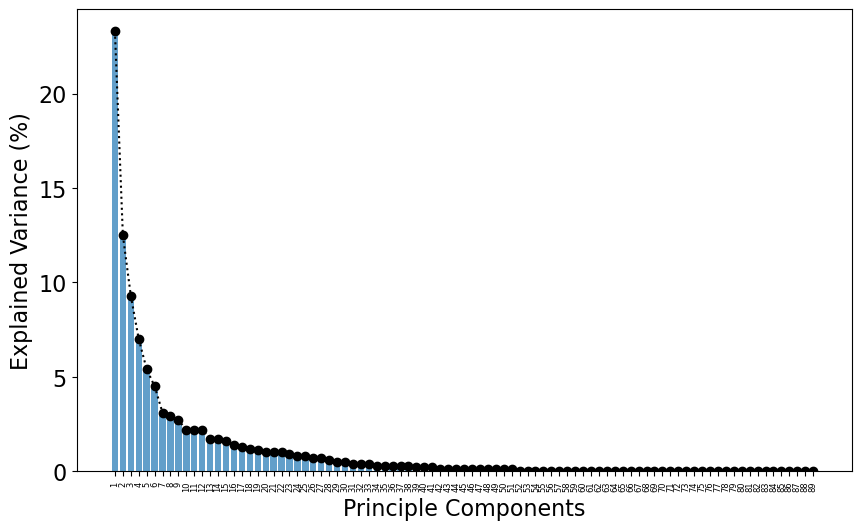

In [183]:
# Scree plot
var_pct = np.round(pca.explained_variance_ratio_ * 100, decimals = 1)

plt.figure(figsize=(10, 6))
plt.bar(range(1, len(var_pct) + 1), var_pct, alpha=0.7)
plt.plot(range(1, len(var_pct) + 1), var_pct, color='k', linestyle=':', marker='o')

plt.xticks(range(1, len(var_pct) + 1),rotation=90, fontsize=6)
plt.xlabel('Principle Components')
plt.ylabel('Explained Variance (%)')

plt.show()

#### 10 PCA components

In [184]:
# loadings
loadings = pd.DataFrame(pca.components_.T[:, :10],
                        columns = ['PC1','PC2','PC3','PC4','PC5','PC6','PC7','PC8','PC9','PC10'], 
                        index = X.columns)
loadings

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10
duration,0.053152,0.175080,-0.074665,0.023204,0.210222,-0.054460,0.163050,-0.123482,-0.065363,0.031330
packets_count,0.094609,0.230350,0.133294,-0.060442,-0.048055,-0.018836,-0.000706,-0.042578,0.054714,0.024619
total_payload_bytes,0.087001,0.174304,0.183952,-0.083242,-0.095191,-0.056337,-0.029196,0.064797,-0.102159,-0.035496
payload_bytes_max,0.168530,-0.138050,0.105705,-0.047429,0.098209,-0.017570,0.023136,-0.032375,0.014570,-0.020187
payload_bytes_min,0.001247,-0.002151,0.016238,-0.015348,0.028916,0.135823,-0.001804,0.069989,-0.096909,0.010305
...,...,...,...,...,...,...,...,...,...,...
bwd_packets_IAT_max,-0.167704,-0.005023,0.178983,0.086473,0.087831,-0.004632,0.001953,-0.009257,-0.011985,0.000344
bwd_packets_IAT_min,-0.167704,-0.005023,0.178983,0.086473,0.087831,-0.004632,0.001953,-0.009257,-0.011985,0.000344
bwd_packets_IAT_total,-0.167704,-0.005023,0.178983,0.086473,0.087831,-0.004632,0.001953,-0.009257,-0.011985,0.000344
subflow_fwd_packets,0.077067,0.115859,0.060733,-0.077447,0.016403,-0.057690,-0.123207,0.121649,0.022727,-0.040333


In [185]:
pca_X = pcs_df.iloc[:, :10]
pca_X.head()

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10
0,0.277841,0.380395,-2.846734,2.982793,-2.914421,0.559045,-0.443973,0.283024,0.553176,-0.074303
1,0.294590,0.369175,-2.838093,2.979533,-2.907396,0.557895,-0.450685,0.274810,0.544647,-0.067044
2,0.278043,0.380426,-2.846935,2.982816,-2.914414,0.559027,-0.445159,0.282086,0.552342,-0.073508
3,0.294507,0.369084,-2.837971,2.979507,-2.907560,0.557943,-0.450474,0.275069,0.544937,-0.067211
4,0.278087,0.380437,-2.846979,2.982821,-2.914409,0.559024,-0.445399,0.281886,0.552165,-0.073340


In [186]:
X_train_pca, X_test_pca, _, _ = train_test_split(pca_X, y, test_size = 0.2, random_state = 42)

In [187]:
model_base.fit(X_train_pca, y_train)

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  3.8min finished


,n_estimators,100
,criterion,'gini'
,max_depth,None
,min_samples_split,2
,min_samples_leaf,1
,min_weight_fraction_leaf,0.0
,max_features,'sqrt'
,max_leaf_nodes,None
,min_impurity_decrease,0.0
,bootstrap,True
,oob_score,False


In [188]:
train_rf_predictions = model_base.predict(X_train_pca)
train_rf_probs = model_base.predict_proba(X_train_pca)[:, 1]

rf_predictions = model_base.predict(X_test_pca)
rf_probs = model_base.predict_proba(X_test_pca)[:, 1]

[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    2.8s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    8.9s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    2.7s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    8.7s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.8s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    2.5s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    1.1s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    2.7s finished


Recall Baseline: 1.0 Test: 0.43 Train: 0.88
Precision Baseline: 0.48 Test: 0.48 Train: 0.92
Roc Baseline: 0.5 Test: 0.5 Train: 0.98

Accuracy: 0.5041234881363605


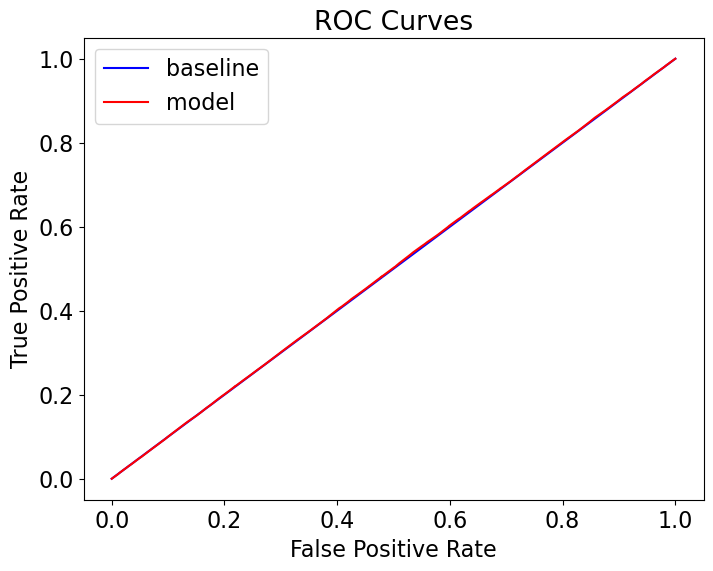

In [189]:
evaluate_model(rf_predictions, rf_probs, train_rf_predictions, train_rf_probs)

Confusion matrix, without normalization
[[60411 45819]
 [54956 42040]]


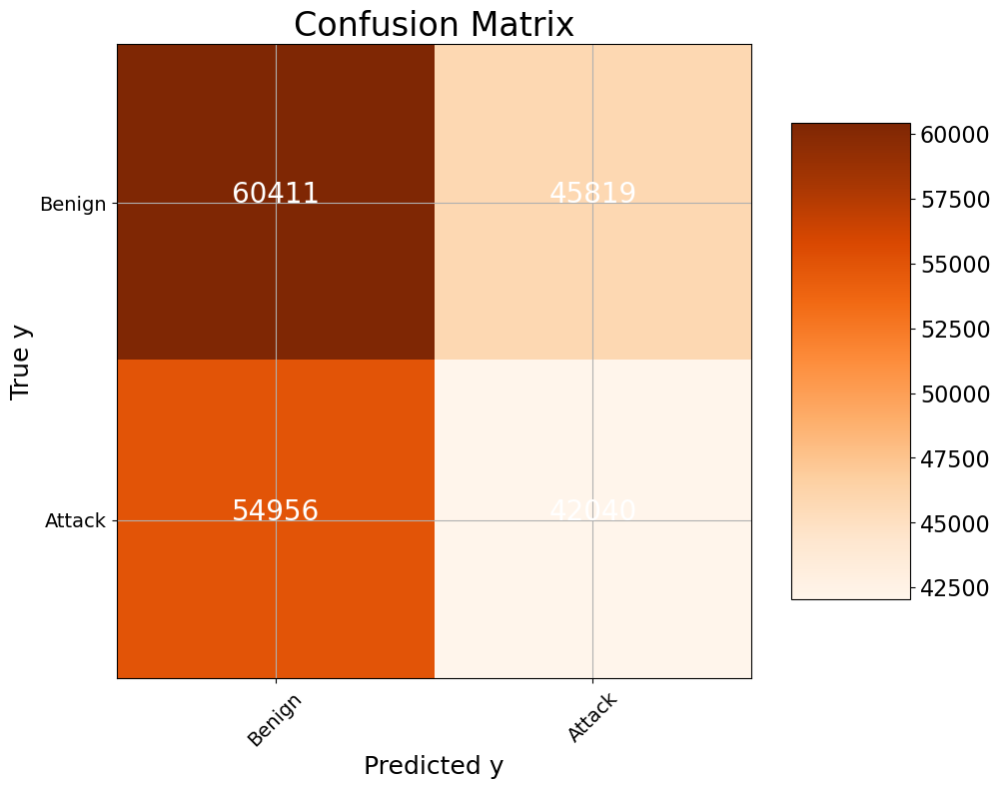

In [190]:
cm = confusion_matrix(y_test, rf_predictions)
plot_confusion_matrix(cm, classes = ['Benign', 'Attack'],
                      title = 'Confusion Matrix')

#### 33 PCA Component

In [191]:
pca_X = pcs_df.iloc[:, :33]
pca_X.head()

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,...,PC24,PC25,PC26,PC27,PC28,PC29,PC30,PC31,PC32,PC33
0,0.277841,0.380395,-2.846734,2.982793,-2.914421,0.559045,-0.443973,0.283024,0.553176,-0.074303,...,0.070411,0.027723,0.107928,-0.201461,-0.237058,0.377991,0.139284,0.037021,0.048778,-0.104550
1,0.294590,0.369175,-2.838093,2.979533,-2.907396,0.557895,-0.450685,0.274810,0.544647,-0.067044,...,0.069215,0.025891,0.105721,-0.200795,-0.237166,0.376788,0.139570,0.033735,0.047153,-0.102472
2,0.278043,0.380426,-2.846935,2.982816,-2.914414,0.559027,-0.445159,0.282086,0.552342,-0.073508,...,0.070423,0.027741,0.107940,-0.201513,-0.237035,0.378075,0.139278,0.036702,0.048445,-0.104608
3,0.294507,0.369084,-2.837971,2.979507,-2.907560,0.557943,-0.450474,0.275069,0.544937,-0.067211,...,0.069243,0.025914,0.105699,-0.200739,-0.237156,0.376766,0.139542,0.033771,0.047271,-0.102466
4,0.278087,0.380437,-2.846979,2.982821,-2.914409,0.559024,-0.445399,0.281886,0.552165,-0.073340,...,0.070369,0.027743,0.107956,-0.201504,-0.237043,0.378093,0.139271,0.036648,0.048368,-0.104621


In [192]:
X_train, X_test, y_train, y_test = train_test_split(sc_X, y, test_size = 0.2, random_state = 42)
X_train_pca, X_test_pca, _, _ = train_test_split(pca_X, y, test_size = 0.2, random_state = 42)

In [193]:
model_base.fit(X_train_pca, y_train)

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 tasks      | elapsed:   28.9s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  1.4min finished


,n_estimators,100
,criterion,'gini'
,max_depth,None
,min_samples_split,2
,min_samples_leaf,1
,min_weight_fraction_leaf,0.0
,max_features,'sqrt'
,max_leaf_nodes,None
,min_impurity_decrease,0.0
,bootstrap,True
,oob_score,False


In [194]:
train_rf_predictions = model_base.predict(X_train_pca)
train_rf_probs = model_base.predict_proba(X_train_pca)[:, 1]

rf_predictions = model_base.predict(X_test_pca)
rf_probs = model_base.predict_proba(X_test_pca)[:, 1]

[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.3s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.7s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.2s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.7s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.1s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.2s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.1s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.2s finished


Recall Baseline: 1.0 Test: 1.0 Train: 1.0
Precision Baseline: 0.48 Test: 1.0 Train: 1.0
Roc Baseline: 0.5 Test: 1.0 Train: 1.0

Accuracy: 0.9989912708019644


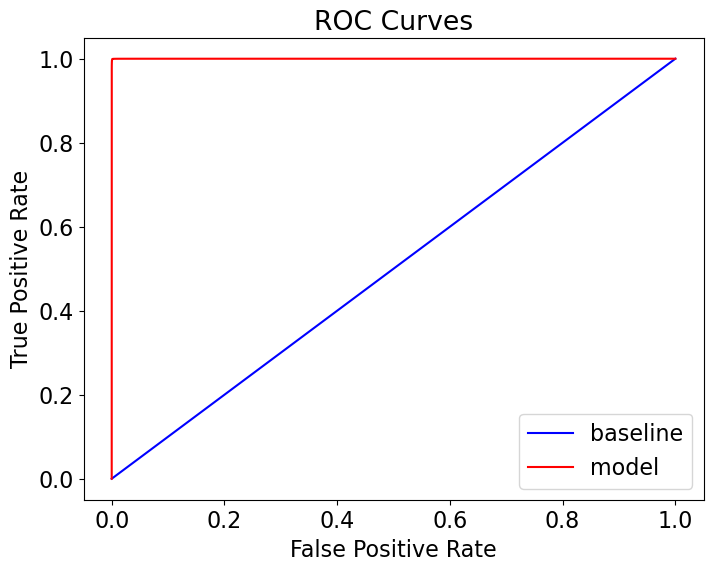

In [195]:
evaluate_model(rf_predictions, rf_probs, train_rf_predictions, train_rf_probs)

Confusion matrix, without normalization
[[106231    104]
 [   101  96790]]


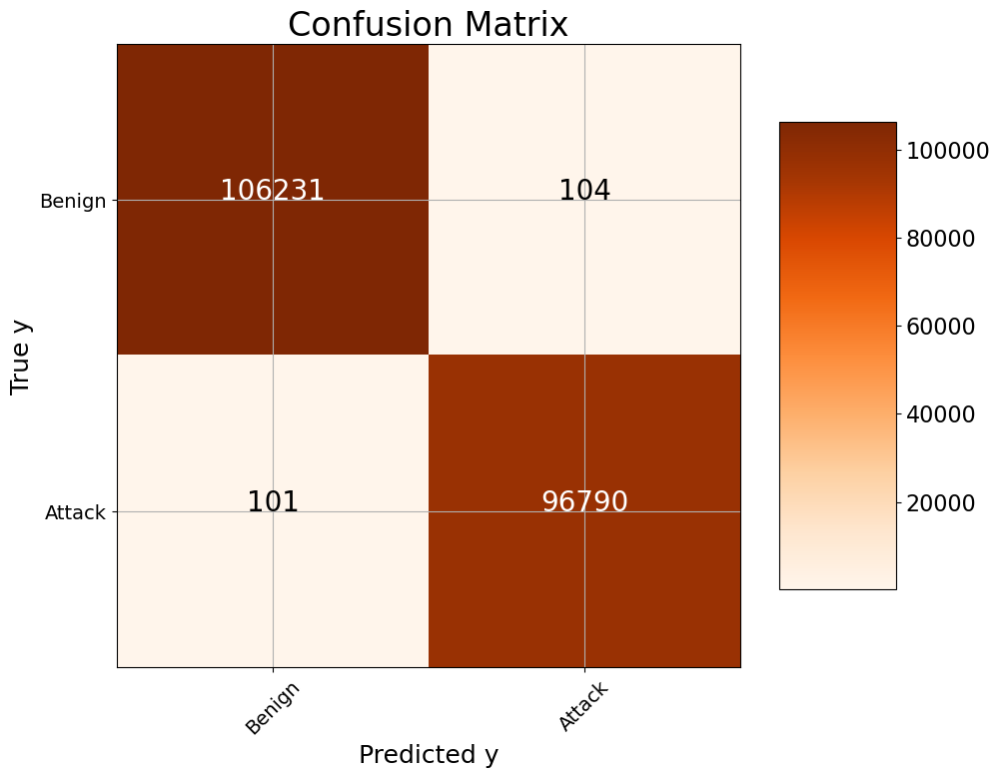

In [196]:
cm = confusion_matrix(y_test, rf_predictions)
plot_confusion_matrix(cm, classes = ['Benign', 'Attack'],
                      title = 'Confusion Matrix')

#### 51 PCA Components

In [197]:
pca_X = pcs_df.iloc[:, :51]
pca_X.head()

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,...,PC42,PC43,PC44,PC45,PC46,PC47,PC48,PC49,PC50,PC51
0,0.277841,0.380395,-2.846734,2.982793,-2.914421,0.559045,-0.443973,0.283024,0.553176,-0.074303,...,-0.079622,0.188809,0.388956,-0.017432,-0.075205,0.154565,0.009307,-0.041671,-0.053916,0.008320
1,0.294590,0.369175,-2.838093,2.979533,-2.907396,0.557895,-0.450685,0.274810,0.544647,-0.067044,...,-0.081857,0.189199,0.386374,-0.017230,-0.073822,0.149717,0.010680,-0.040277,-0.054351,0.005174
2,0.278043,0.380426,-2.846935,2.982816,-2.914414,0.559027,-0.445159,0.282086,0.552342,-0.073508,...,-0.079667,0.188848,0.388961,-0.017434,-0.075209,0.154576,0.009321,-0.041644,-0.053910,0.008310
3,0.294507,0.369084,-2.837971,2.979507,-2.907560,0.557943,-0.450474,0.275069,0.544937,-0.067211,...,-0.081837,0.189198,0.386408,-0.017244,-0.073869,0.149688,0.010682,-0.040295,-0.054353,0.005179
4,0.278087,0.380437,-2.846979,2.982821,-2.914409,0.559024,-0.445399,0.281886,0.552165,-0.073340,...,-0.079682,0.188855,0.388955,-0.017425,-0.075183,0.154587,0.009319,-0.041631,-0.053908,0.008308


In [198]:
X_train_pca, X_test_pca, _, _ = train_test_split(pca_X, y, test_size = 0.2, random_state = 42)

In [199]:
model_base.fit(X_train_pca, y_train)

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 tasks      | elapsed:   44.9s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  2.3min finished


,n_estimators,100
,criterion,'gini'
,max_depth,None
,min_samples_split,2
,min_samples_leaf,1
,min_weight_fraction_leaf,0.0
,max_features,'sqrt'
,max_leaf_nodes,None
,min_impurity_decrease,0.0
,bootstrap,True
,oob_score,False


In [200]:
train_rf_predictions = model_base.predict(X_train_pca)
train_rf_probs = model_base.predict_proba(X_train_pca)[:, 1]

rf_predictions = model_base.predict(X_test_pca)
rf_probs = model_base.predict_proba(X_test_pca)[:, 1]

[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.3s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.8s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.3s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.8s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.1s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.2s finished
[Parallel(n_jobs=10)]: Using backend ThreadingBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.1s
[Parallel(n_jobs=10)]: Done 100 out of 100 | elapsed:    0.2s finished


Recall Baseline: 1.0 Test: 1.0 Train: 1.0
Precision Baseline: 0.48 Test: 1.0 Train: 1.0
Roc Baseline: 0.5 Test: 1.0 Train: 1.0

Accuracy: 0.9991142865578223


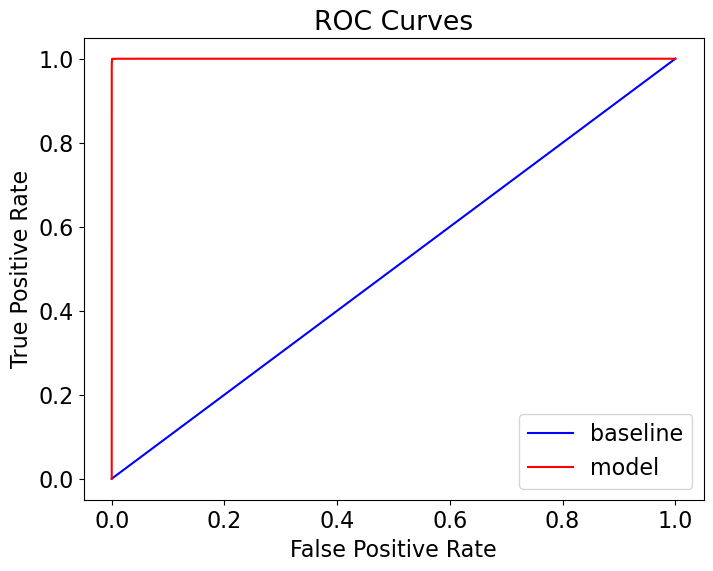

In [201]:
evaluate_model(rf_predictions, rf_probs, train_rf_predictions, train_rf_probs)

Confusion matrix, without normalization
[[106241     94]
 [    86  96805]]


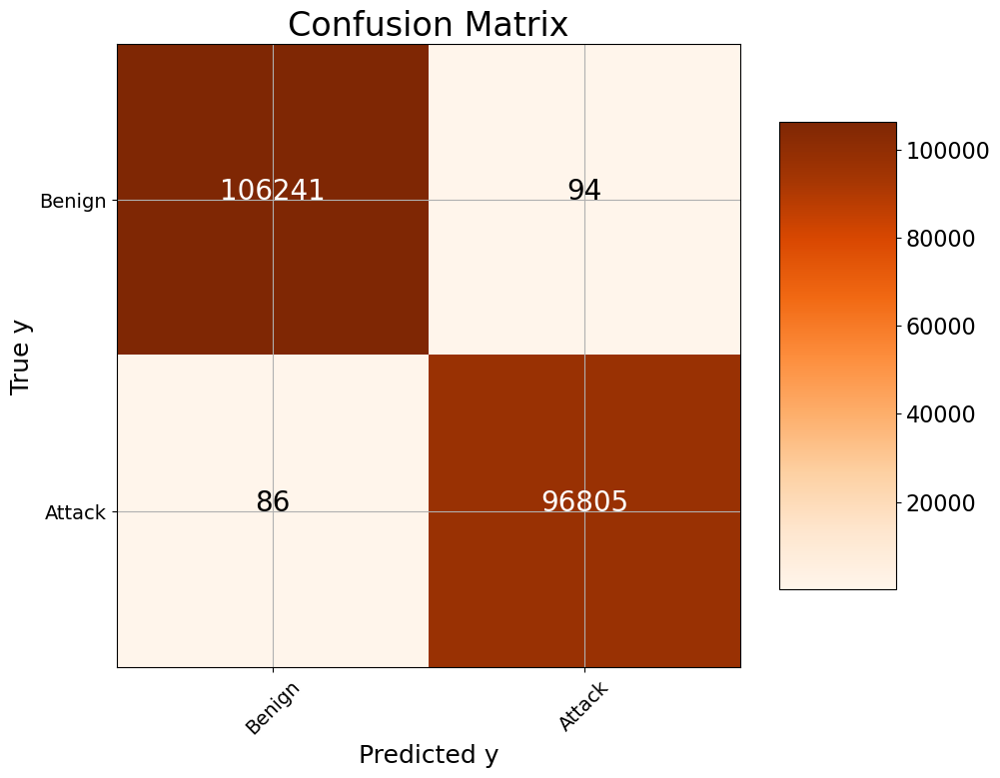

In [202]:
cm = confusion_matrix(y_test, rf_predictions)
plot_confusion_matrix(cm, classes = ['Benign', 'Attack'],
                      title = 'Confusion Matrix')

## Performance Summary <a id='performance-summary'></a>

*   After the pre-processing, the data was reduced from 121 predictors to 89.

*   A random Forrest model with the entire set of features (89) obtained a 99.932% accuracy.

*   It was decided to use 3 sets of thresholds (20%, 40%, 60%) for the RF and MI classifiers based on best practices learned from the paper.

*   Additionaly, it was considered and extra set of features obtained with the RF threshold of 0.02 as it reduced the number of data to just 17.

*   Based on the variance vs component plot, 3 PCA models were built with PCA=10, 33 and 51. The highest accuracy obtained was 99.91% for the 51 PCA component.

*   The features selected through the RF classifier with a 60% threshold obtained the highest accuracy in this project with 99.94%.




|No|Feature Selection                | Number of Features | Classifier| Best Accuracy|
|-|----------------------------------|--------------------| ----------|--------------|
|1| Random Forrest 60% Threshold     | 36  | Random Forrest | 99.943% |
|2| Mutual Information 60% Threshold | 37  | Random Forrest | 99.923% |
|3| Random Forrest 0.02 Threshold    | 17  | Random Forrest | 99.357% |
|4| None                             | 89  | Random Forrest | 99.932% |
|5| PCA with 10 components | - | Random Forrest | 99.873% |
|6| PCA with 33 components | - | Random Forrest | 99.901% |
|7| PCA with 51 components | - | Random Forrest | 99.911% |
|8| Paper results, page 6      | 13 | SVM, MLP, RF and XGB  | 99.92% | 


# Conclusion

## Key Findings and Insights<a id='key-findings-and-insights'></a>

* **Data Characteristics**

	* The dataset contained over 2.4 million rows and 122 features, with a strong imbalance between benign traffic and different attack types.
	
	* TCP traffic dominated in both benign and attack data, while UDP appeared rarely and was almost exclusively associated with Port Scan attacks.
	
	* Several feature groups (e.g., payload_bytes, header_bytes, packet_count) were highly correlated, indicating redundancy in the dataset.

* **Exploratory Data Analysis (EDA)**

	* Benign data showed broader variability in flow identifiers, timestamps, and connections compared to attack traffic, which was more concentrated in fewer IPs and ports.
	
	* Outlier proportions varied significantly: benign traffic had higher variability in duration and packet_count, while attack traffic displayed sharper anomalies in bulk and flags.
	
	* Feature distributions revealed that attacks often exhibit extreme but more uniform patterns compared to benign traffic.

* **Feature Selection Insights**

	* Techniques such as Chi-Square, ANOVA, Mutual Information, and Random Forest ranked traffic-based metrics (e.g., packet rates, IAT features, flow duration) as strong predictors of attack activity.
	
	* Redundant variables (e.g., sums and averages of correlated packet or byte counts) added little additional value for modeling.

* **Modeling Outcomes**
	* Random Forest achieved strong classification performance across benign vs. attack categories, confirming the predictive value of selected features.
	
	* Reduced models using only top-ranked features retained high accuracy while simplifying complexity, showing the importance of feature selection for practical deployment.

## Summary<a id='summary'></a>

This project presented a comprehensive analysis of network traffic data to distinguish benign activity from cyber-attacks. Beginning with a dataset of more than 2.4 million rows and 122 features, the work involved a detailed exploratory data analysis (EDA) to uncover distributions, correlations, and outlier patterns across multiple feature groups. The comparison between benign and attack traffic revealed clear contrasts in variability, protocol distribution, and connection structures, providing a strong foundation for downstream modeling.

To address the complexity of the dataset, feature engineering and selection techniques were applied to refine the most predictive attributes. Methods including Chi-Square, ANOVA, Mutual Information, and Random Forest importance were explored to identify features with the highest discriminatory power. This process highlighted that many variables were redundant or highly correlated, and reducing the feature space not only simplified the modeling process but also retained strong predictive capability.

Building on this foundation, the Random Forest classifier was developed and evaluated as the primary modeling approach. Its robustness in handling high-dimensional data and feature interactions made it well-suited for this task. The final model, trained with 36 carefully selected predictors, achieved an impressive accuracy of 99.943% in distinguishing cyber-attacks from benign traffic. Even reduced versions of the model maintained excellent performance while improving interpretability. Overall, the project demonstrates how a systematic approach, from EDA through feature engineering to model evaluation, can deliver effective solutions to complex cybersecurity challenges.